## Model partition calibration example

In [1]:
%matplotlib inline

import sys

from data_models.parameters import arl_path

import numpy

from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy import constants as const
from astropy.wcs.utils import pixel_to_skycoord

from matplotlib import pyplot as plt
from matplotlib import pylab as pylab

from data_models.memory_data_models import SkyModel
from data_models.polarisation import PolarisationFrame

from processing_library.util.coordinate_support import simulate_point, skycoord_to_lmn

from wrappers.serial.calibration.calibration_control import calibrate_function, create_calibration_controls
from wrappers.serial.skycomponent.operations import find_skycomponents, partition_skycomponent_neighbours

from wrappers.serial.visibility.base import create_blockvisibility, copy_visibility
from processing_library.image.operations import copy_image
from wrappers.serial.image.operations import show_image, qa_image
from wrappers.serial.simulation.testing_support import create_named_configuration, \
    create_low_test_skycomponents_from_gleam, create_unittest_components
from wrappers.serial.skycomponent.operations import filter_skycomponents_by_flux
from wrappers.serial.simulation.mpc import create_gaintable_from_screen, sum_visibility_over_partitions, \
    calculate_sf_from_screen
from wrappers.serial.skymodel.operations import show_skymodel

from processing_components.simulation.mpc import expand_skymodel_by_skycomponents

from wrappers.serial.imaging.primary_beams import create_low_test_beam
from wrappers.serial.skycomponent.operations import apply_beam_to_skycomponent
from wrappers.serial.imaging.base import create_image_from_visibility, advise_wide_field
from wrappers.serial.image.operations import import_image_from_fits, export_image_to_fits

from wrappers.arlexecute.visibility.coalesce import convert_blockvisibility_to_visibility
from wrappers.arlexecute.skycomponent.operations import insert_skycomponent
from wrappers.arlexecute.image.operations import smooth_image, show_components

from workflows.arlexecute.pipelines.pipeline_arlexecute import continuum_imaging_list_arlexecute_workflow, \
    ical_list_arlexecute_workflow
from workflows.serial.imaging.imaging_serial import invert_list_serial_workflow
from workflows.serial.imaging.imaging_serial import weight_list_serial_workflow, taper_list_serial_workflow
from workflows.serial.pipelines.pipeline_serial import continuum_imaging_list_serial_workflow, \
    ical_list_serial_workflow
from data_models.data_model_helpers import import_skycomponent_from_hdf5, import_gaintable_from_hdf5

from data_models.data_model_helpers import import_skymodel_from_hdf5
from workflows.arlexecute.imaging.imaging_arlexecute import invert_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import predict_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import extract_datamodels_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import invert_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import convolve_skymodel_list_arlexecute_workflow
from workflows.arlexecute.skymodel.skymodel_arlexecute import calculate_skymodel_equivalent_image
from workflows.arlexecute.skymodel.skymodel_arlexecute import update_skymodel_from_image
from workflows.arlexecute.skymodel.skymodel_arlexecute import update_skymodel_from_gaintables
from workflows.arlexecute.imaging.imaging_arlexecute import deconvolve_list_arlexecute_workflow
from data_models.data_model_helpers import export_skymodel_to_hdf5
from workflows.arlexecute.calibration.calibration_arlexecute import calibrate_list_arlexecute_workflow

from data_models.data_model_helpers import import_blockvisibility_from_hdf5

from wrappers.arlexecute.execution_support.arlexecute import arlexecute
from wrappers.arlexecute.execution_support.dask_init import get_dask_Client

In [2]:
import logging
def init_logging():
    logging.basicConfig(filename='low-sims-mpc.log',
                        filemode='a',
                        format='%(asctime)s,%(msecs)d %(name)s %(levelname)s %(message)s',
                        datefmt='%H:%M:%S',
                        level=logging.DEBUG)

init_logging()
log = logging.getLogger()
    
def lprint(*args):
    log.info(*args)
    print(*args)

In [3]:
pylab.rcParams['figure.figsize'] = (14.0, 14.0)
pylab.rcParams['image.cmap'] = 'rainbow'

In [4]:
c = get_dask_Client(memory_limit=48 * 1024 * 1024 * 1024, n_workers=16)
arlexecute.set_client(c)
arlexecute.run(init_logging)

Creating LocalCluster and Dask Client
Diagnostic pages available on port http://127.0.0.1:8787


{'tcp://127.0.0.1:33419': None,
 'tcp://127.0.0.1:33739': None,
 'tcp://127.0.0.1:36053': None,
 'tcp://127.0.0.1:36319': None,
 'tcp://127.0.0.1:36489': None,
 'tcp://127.0.0.1:36561': None,
 'tcp://127.0.0.1:37415': None,
 'tcp://127.0.0.1:37907': None,
 'tcp://127.0.0.1:38245': None,
 'tcp://127.0.0.1:38801': None,
 'tcp://127.0.0.1:40483': None,
 'tcp://127.0.0.1:40987': None,
 'tcp://127.0.0.1:42637': None,
 'tcp://127.0.0.1:44683': None,
 'tcp://127.0.0.1:44759': None,
 'tcp://127.0.0.1:45609': None}

### Read the previously prepared observation

In [5]:
blockvis = import_blockvisibility_from_hdf5('low-sims-skymodel_noniso_blockvis_rmax10000.0.hdf5')
Vobs = convert_blockvisibility_to_visibility(blockvis)

### Initialization phase

#### Read the previous iteration of skymodels, $\theta_p^{(n)}$. Each skymodel will contain a mask based on the decomposition, an image and gaintable derived from ICAL

/home/timcornwell/anaconda3/envs/arl/lib/python3.6/site-packages/distributed/worker.py:901: UserWarning: Large object of size 134.22 MB detected in task graph: 
  ('getitem-873ddd2e13e231f175f1971b5d40f8eb', <data ... -bf99eb2a84f2')
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


arlexecute.compute: Execution using Dask took 10.980 seconds
Iteration 1
arlexecute.compute: Execution using Dask took 38.152 seconds
arlexecute.compute: Execution using Dask took 33.433 seconds
arlexecute.compute: Execution using Dask took 36.028 seconds
0 0.4829116331639425
1 0.5122068320088912
2 0.47674194117137747
3 0.4161756900643859
4 0.4612897277253935
5 0.5229784662026795
6 0.5595599547874601
7 0.37164654719050766
8 0.47001671622232466
9 0.36539003990807895
Peak residual : 0.5595599547874601
arlexecute.compute: Execution using Dask took 7.944 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.594606006853012'
		min: '-0.07841895169274078'
		rms: '0.0001535042266724232'
		sum: '2.634712900200194'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.250 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.019599377912803296'
		

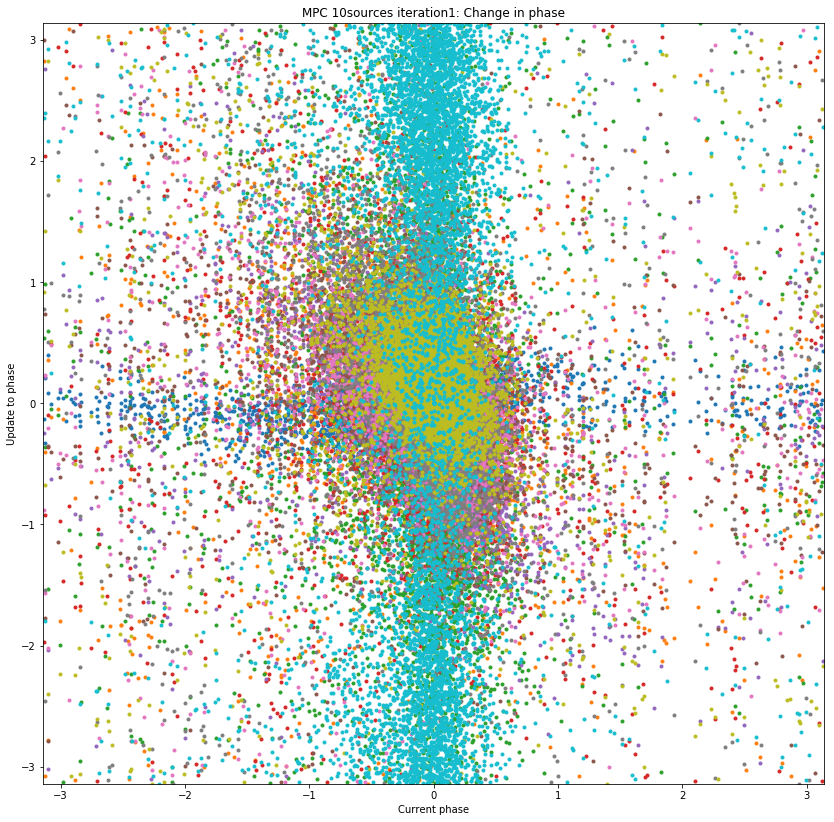

Iteration 2
arlexecute.compute: Execution using Dask took 37.400 seconds
arlexecute.compute: Execution using Dask took 33.720 seconds
arlexecute.compute: Execution using Dask took 36.223 seconds
0 0.2989022399322261
1 0.6717369873669554
2 0.8088853676637786
3 0.550591098919543
4 0.5147590857592109
5 0.4848220635428072
6 1.03457089796741
7 0.7414403794921586
8 1.6906922382078526
9 0.8407871201152892
Peak residual : 1.6906922382078526
arlexecute.compute: Execution using Dask took 6.539 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '0.0'
		rms: '0.0'
		sum: '0.0'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 4.160 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0103873134294602'
		min: '0.0'
		rms: '7.0134942125381925e-06'
		sum: '0.14989587695646717'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execu

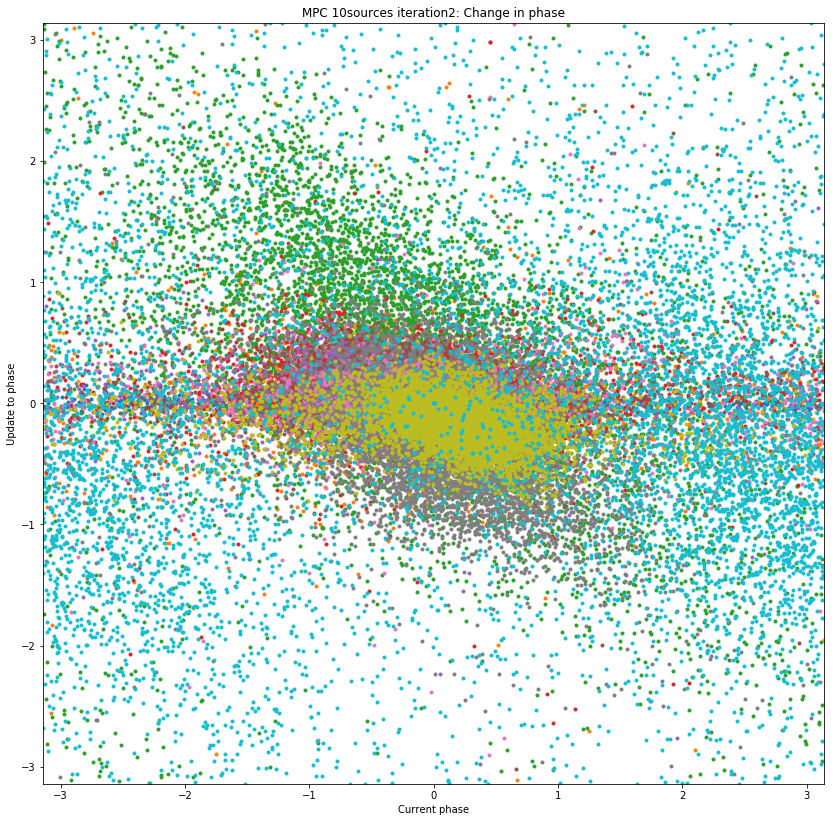

Iteration 3
arlexecute.compute: Execution using Dask took 37.703 seconds
arlexecute.compute: Execution using Dask took 34.025 seconds
arlexecute.compute: Execution using Dask took 35.879 seconds
0 0.3105264837445523
1 0.7950387169953049
2 0.8039577723385039
3 0.5445318845356468
4 0.5374880212265024
5 0.5395742757208396
6 0.7557490598511785
7 0.8200469426723141
8 0.841708463577242
9 0.8243593492449679
Peak residual : 0.841708463577242
arlexecute.compute: Execution using Dask took 6.779 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.10779540592324266'
		min: '-0.017895557172027003'
		rms: '2.668720237953311e-05'
		sum: '0.08390059349813869'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 4.541 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.09271754532692583'
		min: '0.0'
		rms: '3.670541753250523e-05'
		sum: '0.87634708503

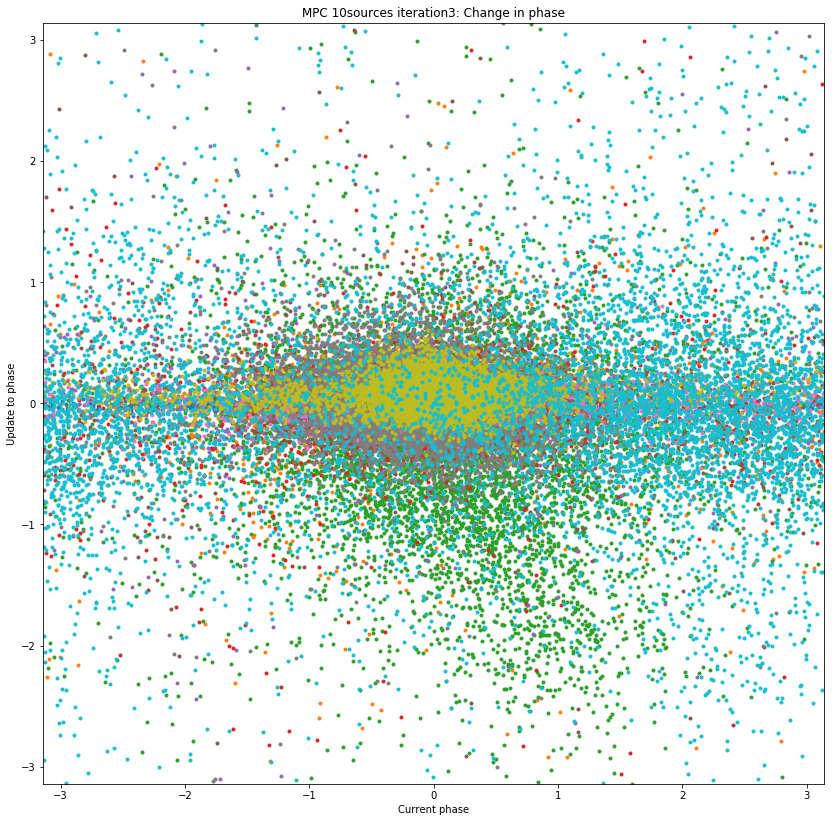

Iteration 4
arlexecute.compute: Execution using Dask took 37.251 seconds
arlexecute.compute: Execution using Dask took 33.445 seconds
arlexecute.compute: Execution using Dask took 36.116 seconds
0 0.2385250236383083
1 0.5751156586866899
2 0.3292965689451337
3 0.4197147446070296
4 0.441970358209664
5 0.4465955409259731
6 0.36081849198055416
7 0.35497418534094716
8 0.39865507265460254
9 0.2502244324164986
Peak residual : 0.5751156586866899
arlexecute.compute: Execution using Dask took 4.560 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.02289492019857737'
		min: '-0.01801154765656928'
		rms: '7.2806496877249685e-06'
		sum: '-0.02374694557249858'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 4.110 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.3771863906728049'
		min: '-0.050930523666029764'
		rms: '9.63073936707297e-05'


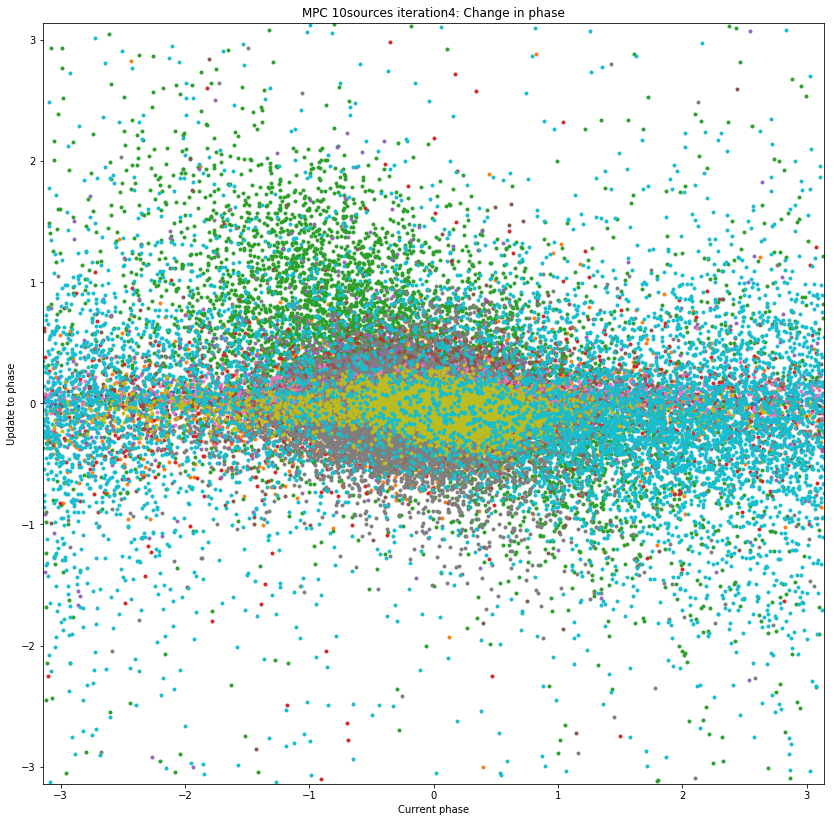

Iteration 5
arlexecute.compute: Execution using Dask took 37.260 seconds
arlexecute.compute: Execution using Dask took 33.428 seconds
arlexecute.compute: Execution using Dask took 35.991 seconds
0 0.22100914407090677
1 0.44840459294065327
2 0.31527749087598544
3 0.34120601300024433
4 0.41309365203366444
5 0.34269683760420344
6 0.29384074375810654
7 0.3342631880278797
8 0.2888107625887759
9 0.19882835911997437
Peak residual : 0.44840459294065327
arlexecute.compute: Execution using Dask took 5.135 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0831043264465933'
		min: '-0.03170226123953012'
		rms: '2.2459397119607553e-05'
		sum: '0.08185980711818203'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.053 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.31810608726480094'
		min: '-0.0314933113503493'
		rms: '8.358485618544439e

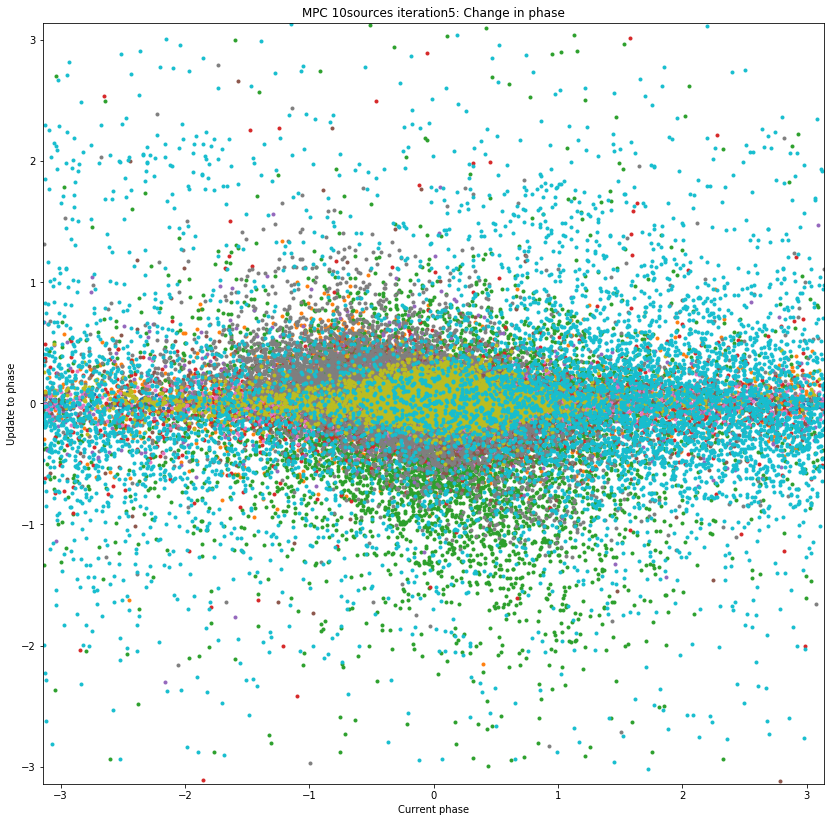

Iteration 6
arlexecute.compute: Execution using Dask took 37.330 seconds
arlexecute.compute: Execution using Dask took 33.552 seconds
arlexecute.compute: Execution using Dask took 36.211 seconds
0 0.19524885203051934
1 0.19920737629454155
2 0.19032055796382058
3 0.23124540533927407
4 0.25067028466426455
5 0.1934605996328811
6 0.18923725875070724
7 0.20819569940433091
8 0.2092983588838071
9 0.19497704253596132
Peak residual : 0.25067028466426455
arlexecute.compute: Execution using Dask took 6.501 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.17077207447010487'
		min: '-0.05254672222819138'
		rms: '5.7933867265785895e-05'
		sum: '1.3335351093870724'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 8.054 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.15241227429326537'
		min: '-0.028034977595826932'
		rms: '5.21737218194786

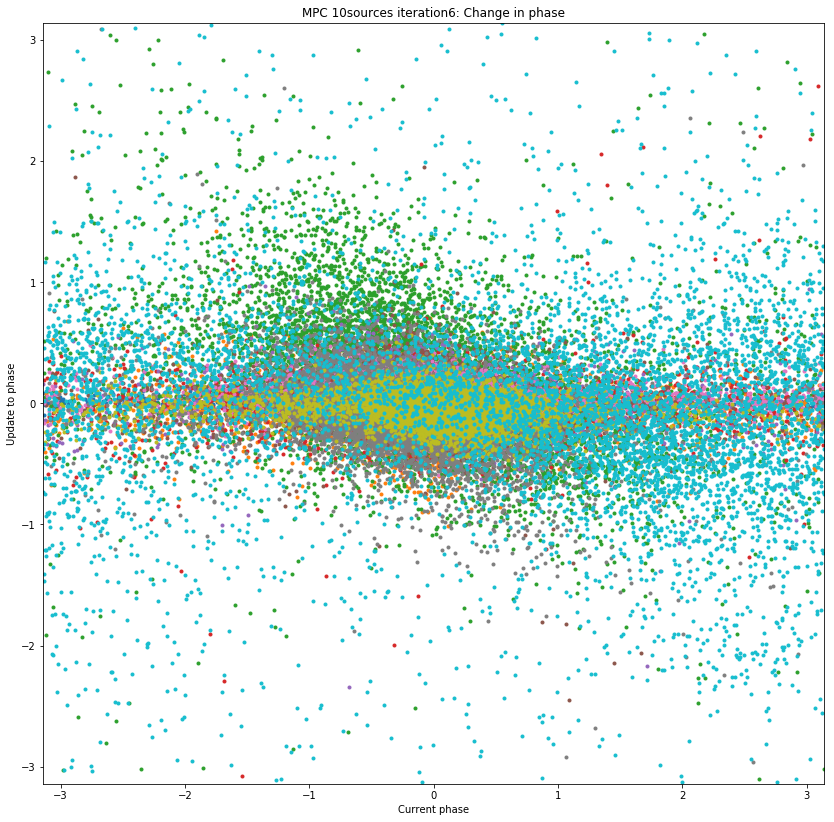

Iteration 7
arlexecute.compute: Execution using Dask took 37.550 seconds
arlexecute.compute: Execution using Dask took 33.372 seconds
arlexecute.compute: Execution using Dask took 36.263 seconds
0 0.15076381851192544
1 0.22619800300649584
2 0.14078228957460404
3 0.14270318380379088
4 0.16814542940227506
5 0.1496098111749273
6 0.1847699017613964
7 0.1557092580149575
8 0.14573611233443762
9 0.1335335418722603
Peak residual : 0.22619800300649584
arlexecute.compute: Execution using Dask took 7.565 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.10087108728486259'
		min: '-0.03214855322278086'
		rms: '3.232722482162627e-05'
		sum: '0.25465067203363684'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.768 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.16011207854253878'
		min: '-0.03339681394087006'
		rms: '4.428222501696954e-

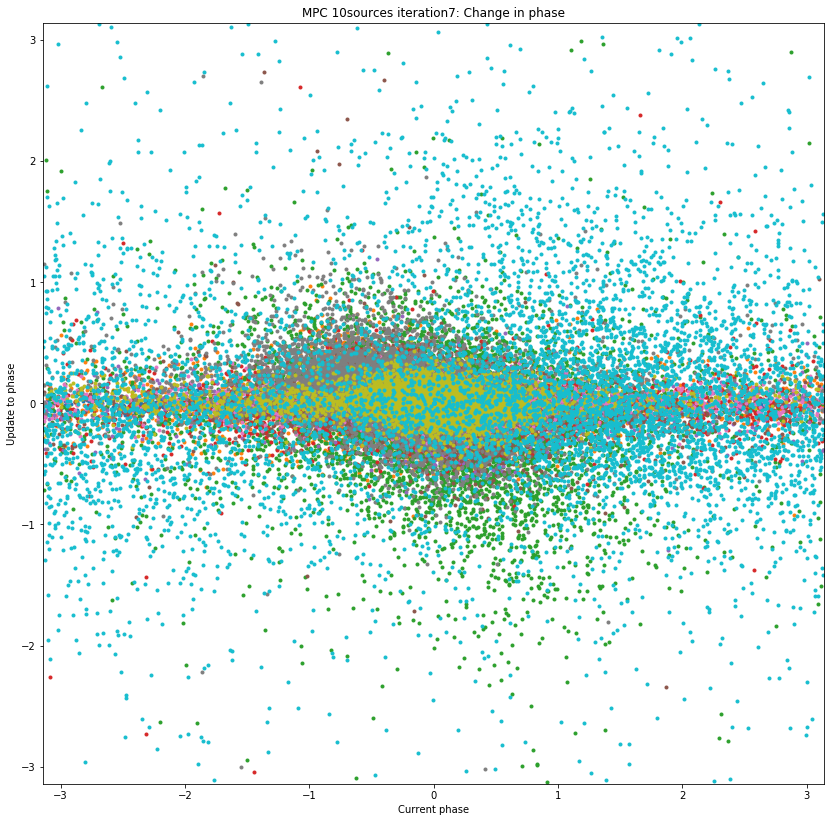

Iteration 8
arlexecute.compute: Execution using Dask took 37.155 seconds
arlexecute.compute: Execution using Dask took 33.372 seconds
arlexecute.compute: Execution using Dask took 35.946 seconds
0 0.1239997396509166
1 0.13104855240216606
2 0.1321911230975925
3 0.10619113558746221
4 0.12319408689978228
5 0.11245458914947655
6 0.12048518560711496
7 0.1331768778611548
8 0.11209206008434824
9 0.15435117681795252
Peak residual : 0.15435117681795252
arlexecute.compute: Execution using Dask took 8.744 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.058461237895514974'
		min: '-0.05623499211038077'
		rms: '3.9739206176248166e-05'
		sum: '0.6302377024045525'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.784 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.02213608334140018'
		min: '-0.039613507560859976'
		rms: '3.16017930795325

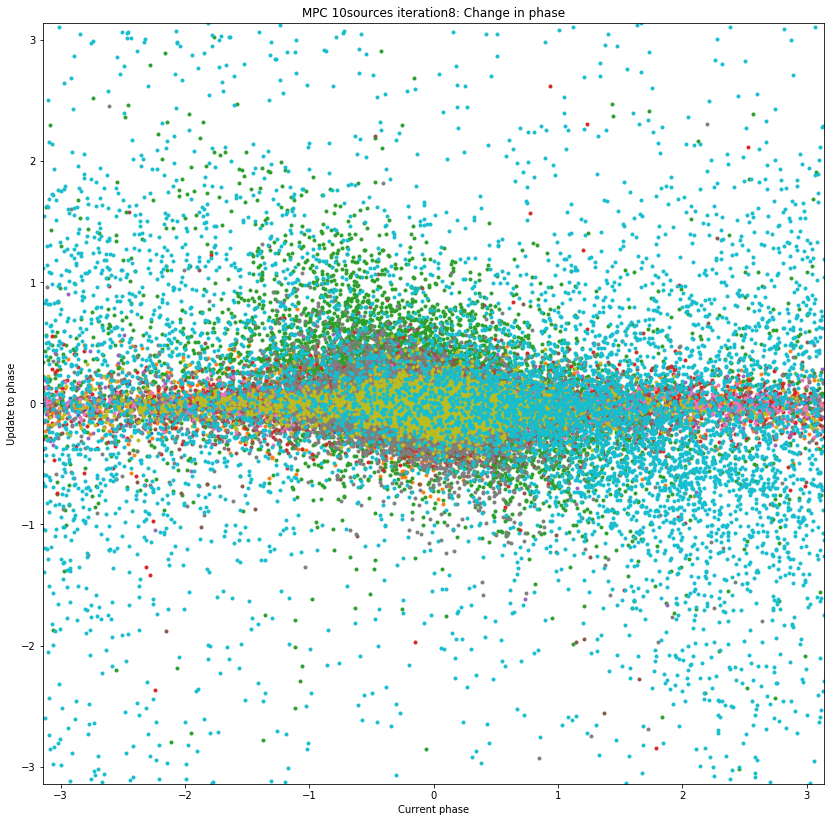

Iteration 9
arlexecute.compute: Execution using Dask took 37.366 seconds
arlexecute.compute: Execution using Dask took 33.345 seconds
arlexecute.compute: Execution using Dask took 36.267 seconds
0 0.11960460997030067
1 0.16408103240749083
2 0.12469731473502854
3 0.10642583821627505
4 0.09814435570045066
5 0.11927353946651917
6 0.1311872529826279
7 0.11949332009280222
8 0.1080275695090842
9 0.10344832810737091
Peak residual : 0.16408103240749083
arlexecute.compute: Execution using Dask took 7.978 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.014655525772632093'
		min: '-0.011057939296551567'
		rms: '1.5013427560883494e-05'
		sum: '0.4018935515330806'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.389 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.09324857806867173'
		min: '-0.014942587054171824'
		rms: '2.838912527440

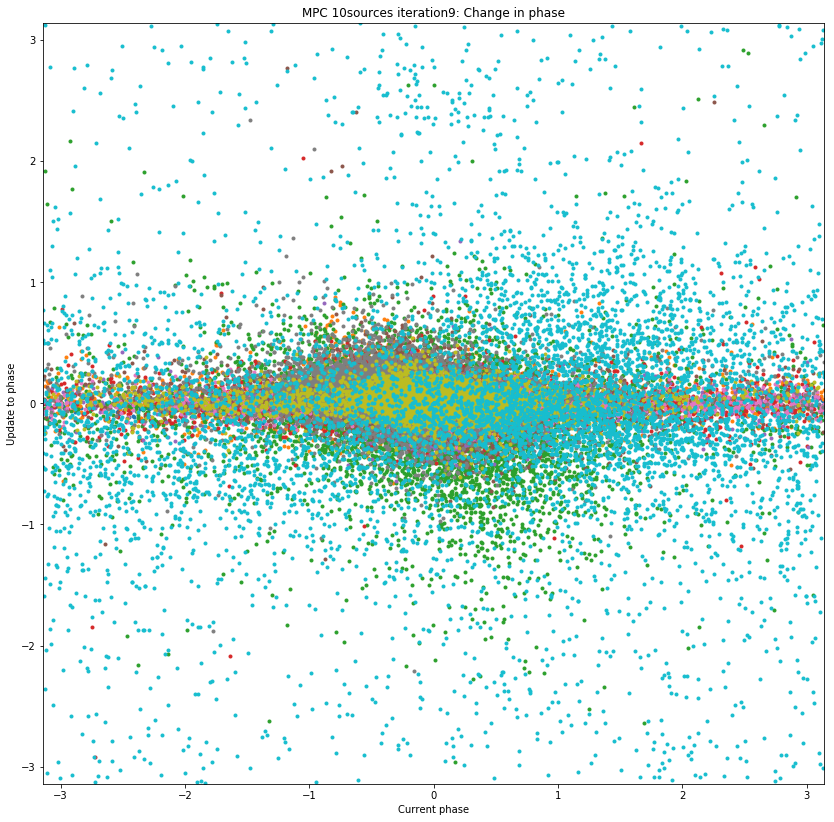

Iteration 10
arlexecute.compute: Execution using Dask took 37.131 seconds
arlexecute.compute: Execution using Dask took 33.442 seconds
arlexecute.compute: Execution using Dask took 35.966 seconds
0 0.10462241086952516
1 0.10420065347842522
2 0.0926138642253228
3 0.07567196482774285
4 0.08974404806398056
5 0.10151292207572735
6 0.1071989284428283
7 0.1106474744501119
8 0.09252978535196194
9 0.10454615802835865
Peak residual : 0.1106474744501119
arlexecute.compute: Execution using Dask took 8.276 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.02659543976931368'
		min: '-0.027389251724412124'
		rms: '2.7253048453229633e-05'
		sum: '0.47374053612803046'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.949 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01585395967048554'
		min: '-0.022585586513865497'
		rms: '2.5431234308972

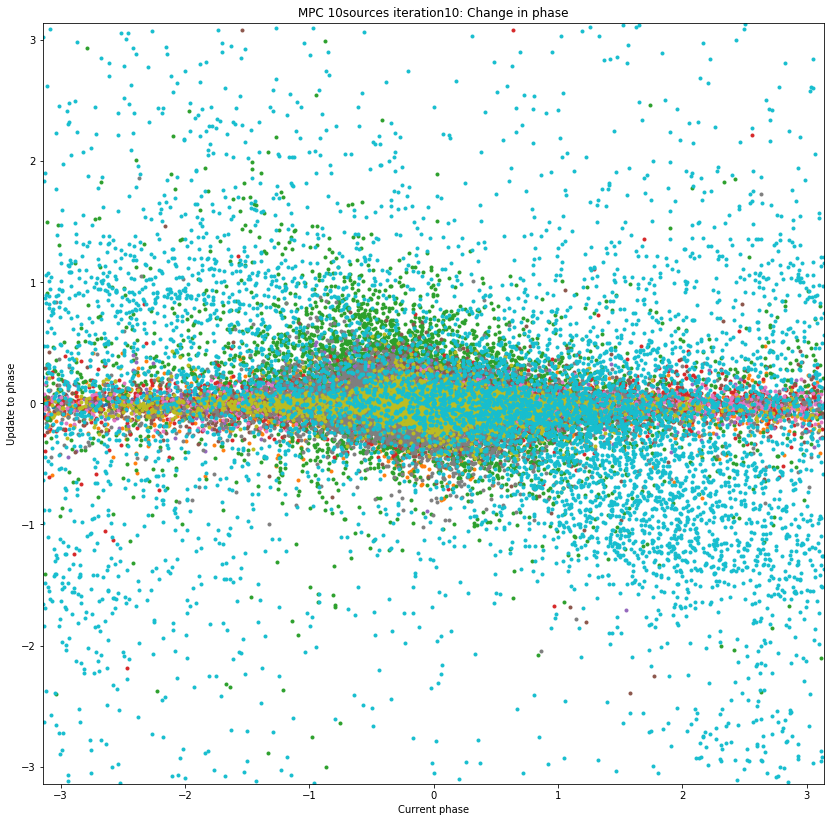

Iteration 11
arlexecute.compute: Execution using Dask took 37.354 seconds
arlexecute.compute: Execution using Dask took 33.637 seconds
arlexecute.compute: Execution using Dask took 36.530 seconds
0 0.10067940157499014
1 0.11602043986171529
2 0.09576735740102504
3 0.07145271693864086
4 0.07640591860609403
5 0.10931924990160524
6 0.0977128487574892
7 0.10608796774004435
8 0.10006410101848956
9 0.0881895450595977
Peak residual : 0.11602043986171529
arlexecute.compute: Execution using Dask took 8.588 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01957748410229866'
		min: '-0.016865870913345158'
		rms: '2.164286992311413e-05'
		sum: '0.49704425169601885'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.554 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.06062500446103422'
		min: '-0.016444575665668298'
		rms: '2.254681998595

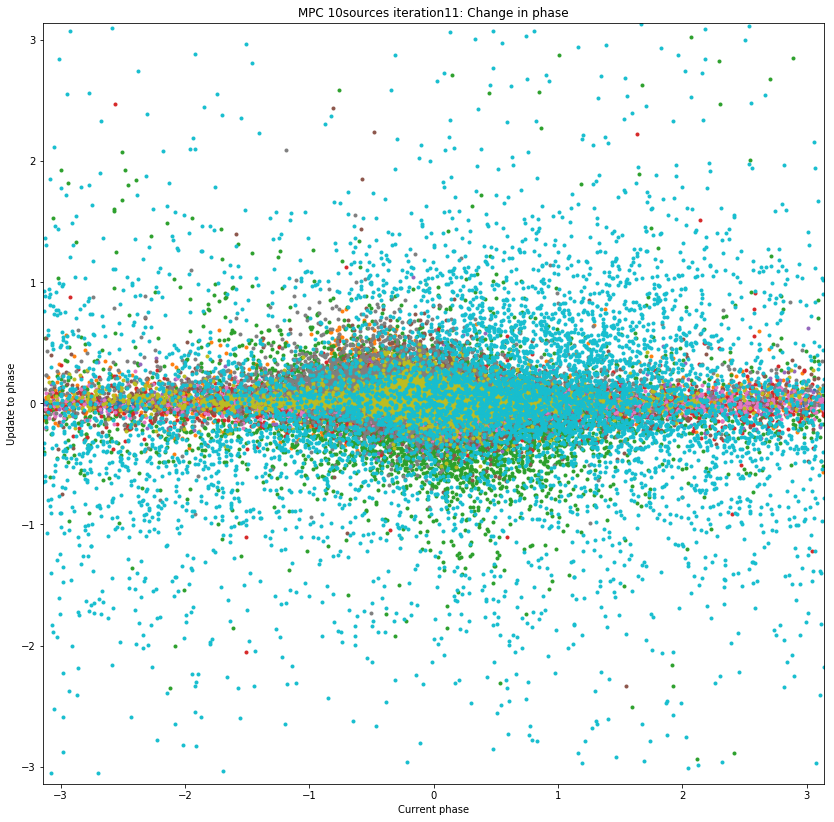

Iteration 12
arlexecute.compute: Execution using Dask took 37.611 seconds
arlexecute.compute: Execution using Dask took 33.392 seconds
arlexecute.compute: Execution using Dask took 36.290 seconds
0 0.095315903306578
1 0.09206377774266156
2 0.08802453035167176
3 0.06713643271227832
4 0.07456049542075067
5 0.094417866295766
6 0.0753669201962317
7 0.09613994033219202
8 0.08844194170634068
9 0.07722976095285494
Peak residual : 0.09613994033219202
arlexecute.compute: Execution using Dask took 8.532 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.013785858083562856'
		min: '-0.012115547249860508'
		rms: '1.848798906302804e-05'
		sum: '0.27897458674315556'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.887 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01147574361581'
		min: '-0.02936473315849594'
		rms: '1.692995077714595e-0

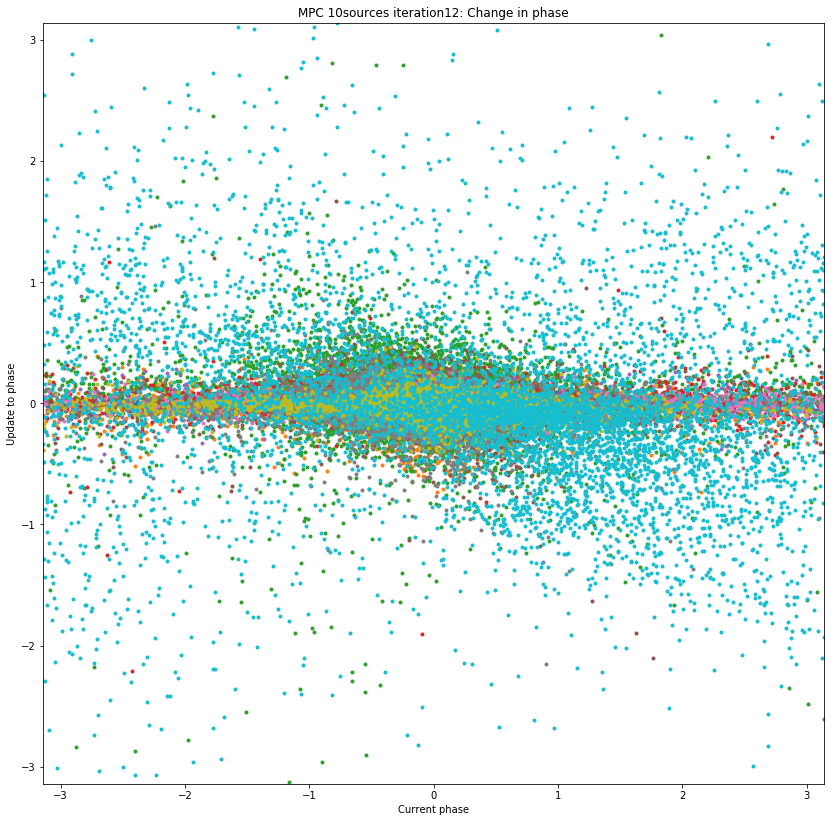

Iteration 13
arlexecute.compute: Execution using Dask took 37.600 seconds
arlexecute.compute: Execution using Dask took 33.677 seconds
arlexecute.compute: Execution using Dask took 36.384 seconds
0 0.08584531575792115
1 0.0858836564420482
2 0.08214972794099837
3 0.06356207000434068
4 0.06675178985496959
5 0.09518603484451164
6 0.07522176674781195
7 0.08958473413092638
8 0.08196537057447936
9 0.07776688475880723
Peak residual : 0.09518603484451164
arlexecute.compute: Execution using Dask took 8.321 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.018718247126177014'
		min: '-0.011613969614815476'
		rms: '1.7980116276209585e-05'
		sum: '0.13141273501346515'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 8.342 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.04021181788733906'
		min: '-0.013981196087993697'
		rms: '1.867510289

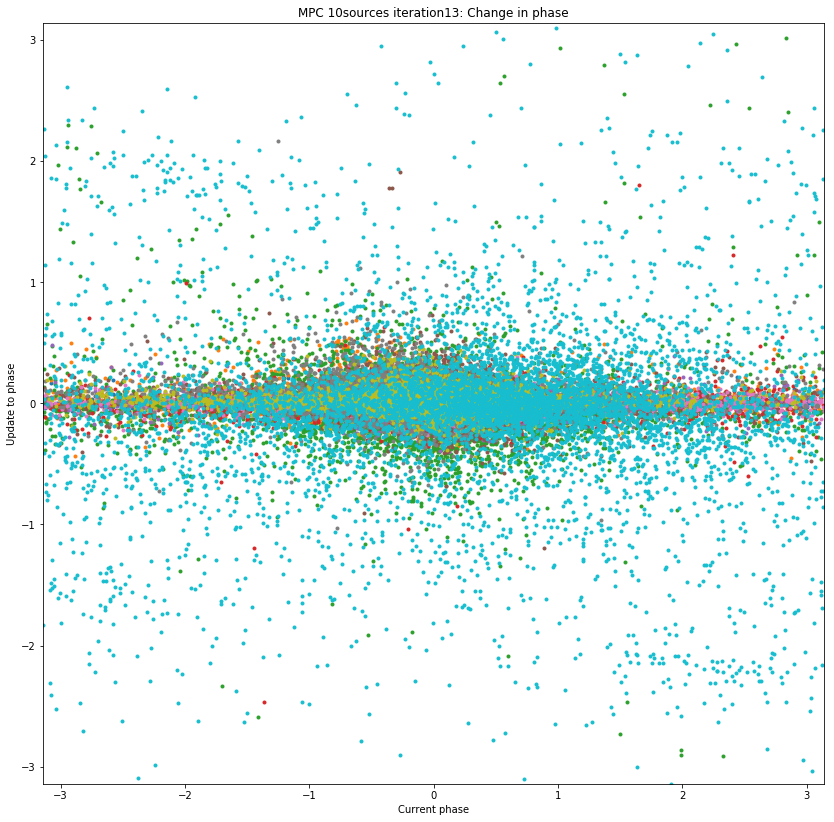

Iteration 14
arlexecute.compute: Execution using Dask took 37.782 seconds
arlexecute.compute: Execution using Dask took 33.591 seconds
arlexecute.compute: Execution using Dask took 36.236 seconds
0 0.08259700785840257
1 0.0760760489895045
2 0.07799549437377877
3 0.05557931453323839
4 0.0606957749044863
5 0.08789794470789486
6 0.06412259666249184
7 0.08395633767787725
8 0.08614294144838269
9 0.06652722259474442
Peak residual : 0.08789794470789486
arlexecute.compute: Execution using Dask took 8.130 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.011648129017040838'
		min: '-0.01977269119314409'
		rms: '1.5793453371648037e-05'
		sum: '0.23723767567830736'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.510 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.015003158103307983'
		min: '-0.012289304661415186'
		rms: '1.2985840794

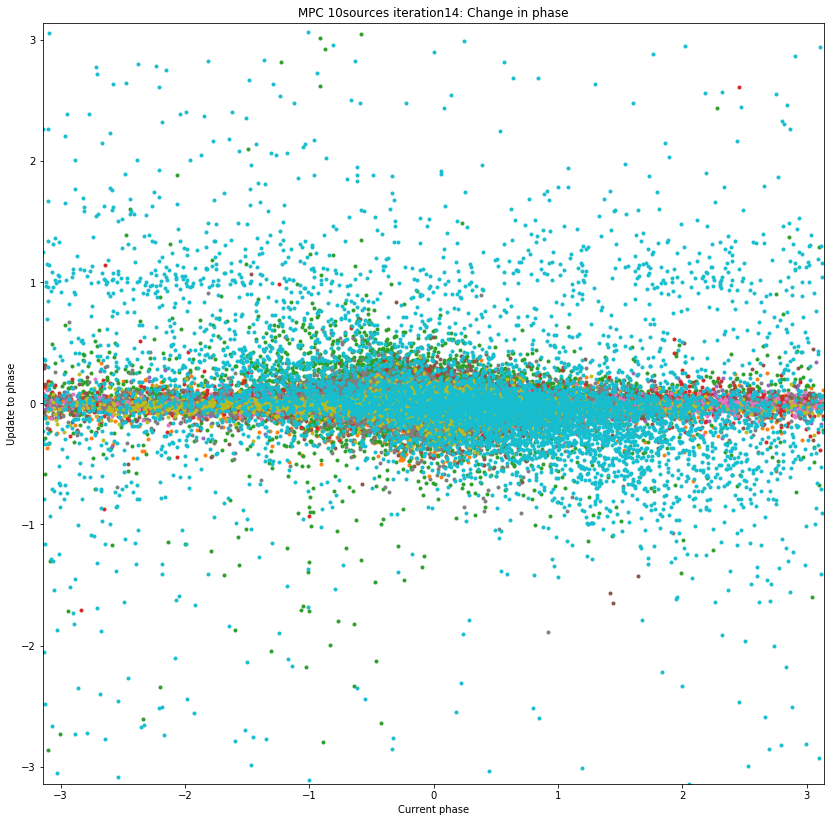

Iteration 15
arlexecute.compute: Execution using Dask took 38.014 seconds
arlexecute.compute: Execution using Dask took 33.523 seconds
arlexecute.compute: Execution using Dask took 36.363 seconds
0 0.07413930229964778
1 0.07099868430654173
2 0.08303792796293832
3 0.049144444010887606
4 0.05448575914230136
5 0.07705560418193341
6 0.06080608308210603
7 0.0869130817188424
8 0.07129863820411604
9 0.06435514489898149
Peak residual : 0.0869130817188424
arlexecute.compute: Execution using Dask took 7.940 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.016660169677971636'
		min: '-0.008942079137727028'
		rms: '1.4552848878293601e-05'
		sum: '0.07506445069703854'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.730 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.01942588094300729'
		min: '-0.008529569021535045'
		rms: '1.196801866

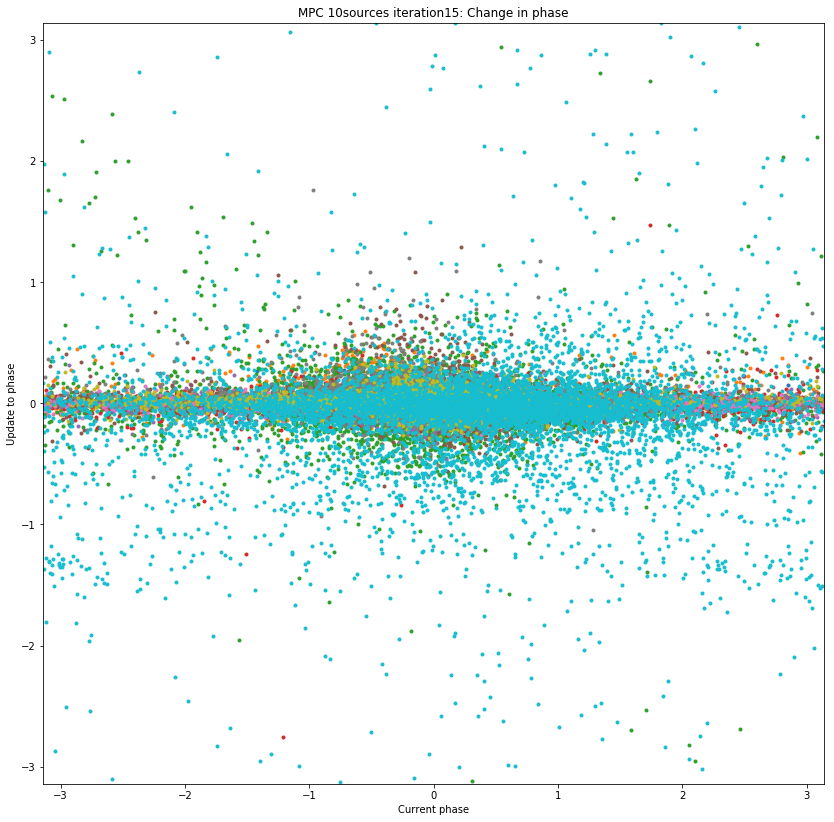

Iteration 16
arlexecute.compute: Execution using Dask took 37.681 seconds
arlexecute.compute: Execution using Dask took 33.759 seconds
arlexecute.compute: Execution using Dask took 36.501 seconds
0 0.07992141022335794
1 0.0693266541032098
2 0.06860198994246616
3 0.04372198073538066
4 0.05024735944186878
5 0.06389860610880241
6 0.059140662807536125
7 0.07057234798707598
8 0.06067579921974555
9 0.0643204872049976
Peak residual : 0.07992141022335794
arlexecute.compute: Execution using Dask took 7.789 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.011504998743316624'
		min: '-0.007218324960629418'
		rms: '1.4060575176498278e-05'
		sum: '0.15605139776532426'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.733 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.011526361441091228'
		min: '-0.008064813026521359'
		rms: '1.27176728

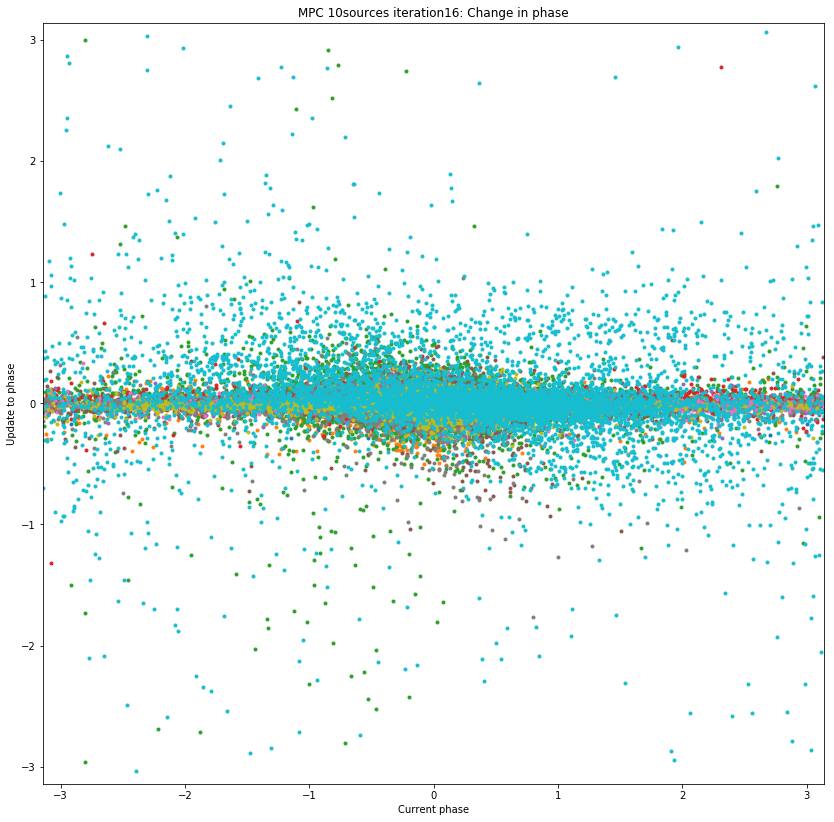

Iteration 17
arlexecute.compute: Execution using Dask took 37.875 seconds
arlexecute.compute: Execution using Dask took 33.243 seconds
arlexecute.compute: Execution using Dask took 36.250 seconds
0 0.07350258960635395
1 0.06397788902806092
2 0.07625828258732766
3 0.04177459329648697
4 0.04391234128270745
5 0.0647701505271498
6 0.05407996597156581
7 0.07726303128402998
8 0.06576131261889775
9 0.058814532464282546
Peak residual : 0.07726303128402998
arlexecute.compute: Execution using Dask took 8.339 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.011079150837020905'
		min: '-0.007444606690907714'
		rms: '1.363822975226661e-05'
		sum: '-0.015402661949500473'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.555 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.010737683768419649'
		min: '-0.007421086516990291'
		rms: '1.233328

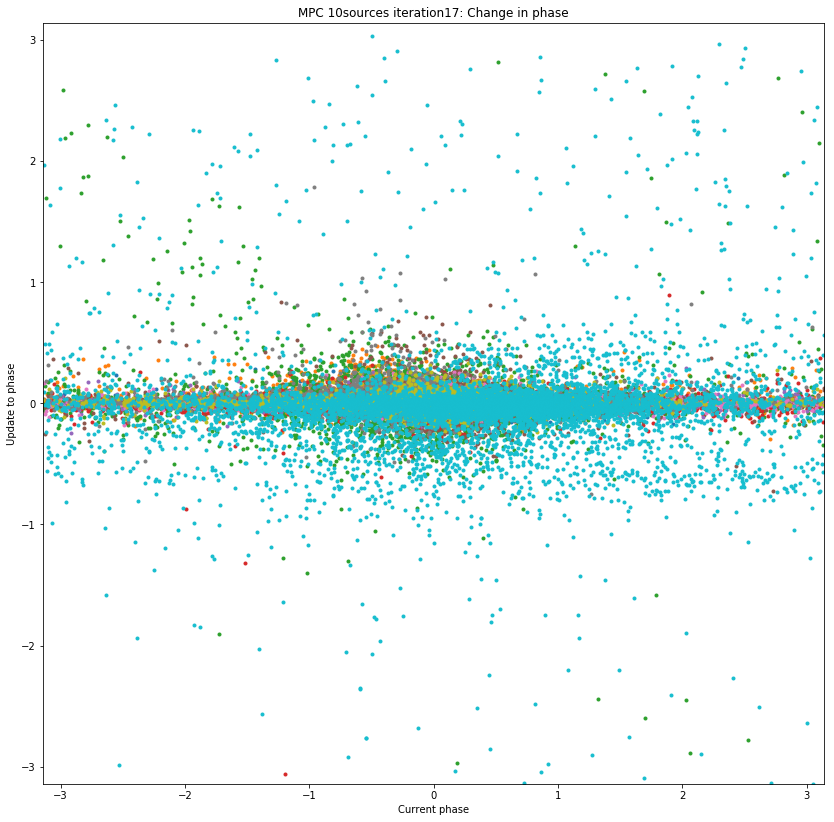

Iteration 18
arlexecute.compute: Execution using Dask took 37.789 seconds
arlexecute.compute: Execution using Dask took 33.720 seconds
arlexecute.compute: Execution using Dask took 36.595 seconds
0 0.0779975700543662
1 0.06293687908074105
2 0.06509914454033544
3 0.040225470774962184
4 0.0412763049964379
5 0.05850697371323113
6 0.05552362072464041
7 0.06382948289145925
8 0.057541754008469836
9 0.06072864192539092
Peak residual : 0.0779975700543662
arlexecute.compute: Execution using Dask took 7.565 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.007260638586018786'
		min: '-0.006128730176004334'
		rms: '6.372936096599198e-06'
		sum: '0.02817382125360506'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.400 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.007050310126910521'
		min: '-0.008474664551792048'
		rms: '7.603013557

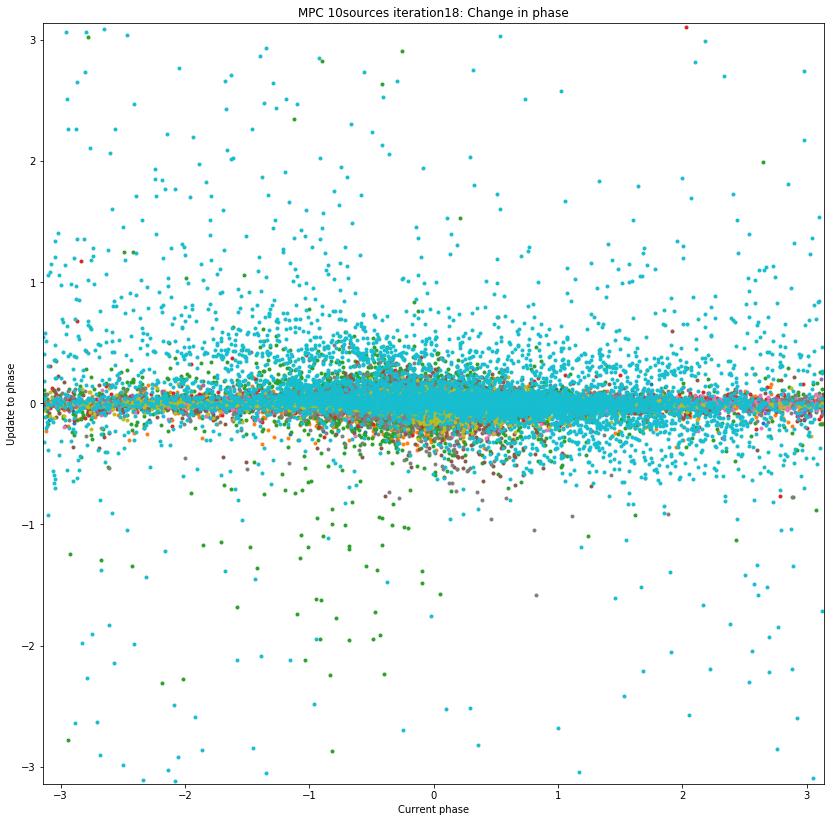

Iteration 19
arlexecute.compute: Execution using Dask took 37.683 seconds
arlexecute.compute: Execution using Dask took 33.615 seconds
arlexecute.compute: Execution using Dask took 36.444 seconds
0 0.06585826035688036
1 0.062398266705242664
2 0.06606102186197682
3 0.03448781965497246
4 0.03696135625987593
5 0.06008027633760393
6 0.0504248727559751
7 0.07641293347573935
8 0.06210890250800187
9 0.0579934283920542
Peak residual : 0.07641293347573935
arlexecute.compute: Execution using Dask took 7.432 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0033045700508004825'
		min: '-0.003437021846573017'
		rms: '3.6959260778712247e-06'
		sum: '-0.004875486577275051'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.030 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.006752682164001772'
		min: '-0.003318585485016219'
		rms: '5.42595

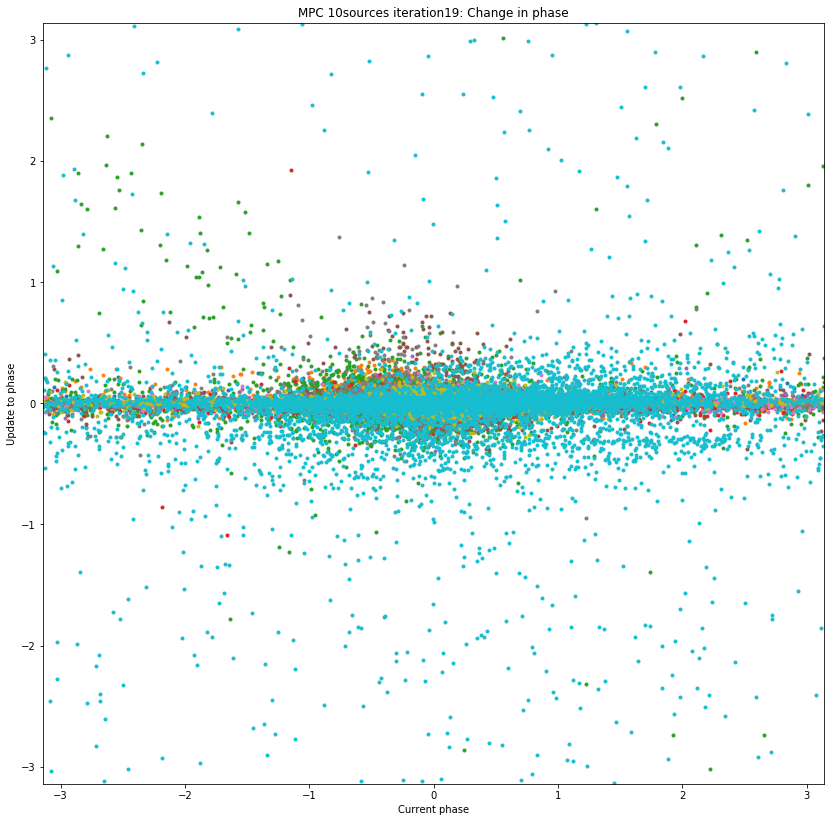

Iteration 20
arlexecute.compute: Execution using Dask took 37.746 seconds
arlexecute.compute: Execution using Dask took 33.431 seconds
arlexecute.compute: Execution using Dask took 36.355 seconds
0 0.07192920328618028
1 0.06049359603896069
2 0.06458172033042006
3 0.03551280453056971
4 0.03531060754463822
5 0.056762792059736424
6 0.05255862664852059
7 0.06530852461967938
8 0.05472595271147025
9 0.05486837273147542
Peak residual : 0.07192920328618028
arlexecute.compute: Execution using Dask took 7.454 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004802861521575788'
		min: '-0.003297791710583201'
		rms: '5.378718778787993e-06'
		sum: '0.015721871550522563'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.213 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.006688766940167141'
		min: '-0.006347868116545018'
		rms: '5.295070

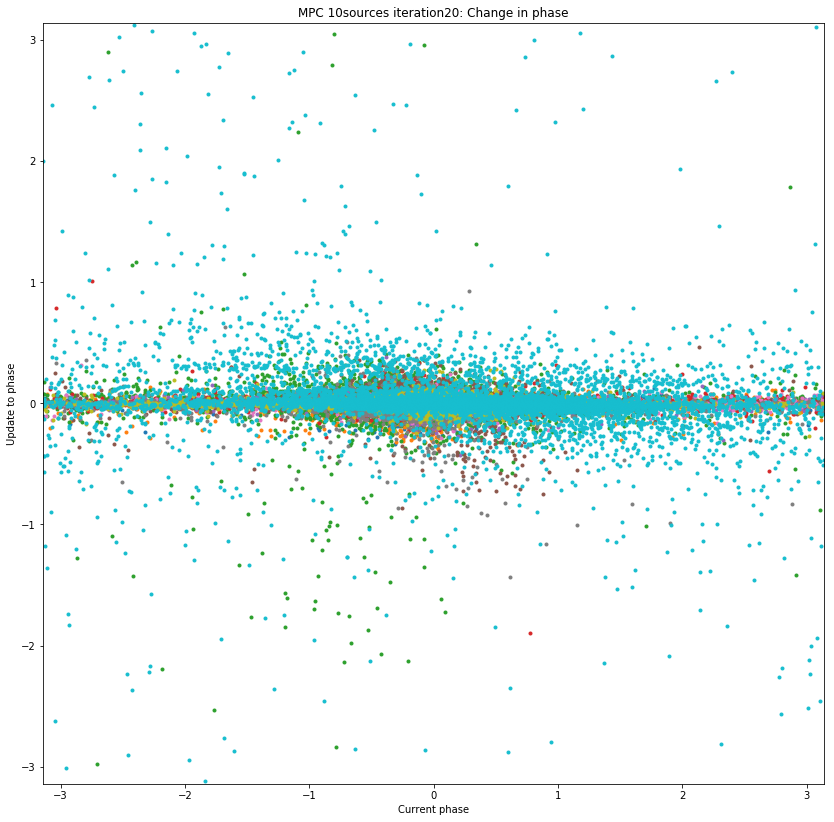

Iteration 21
arlexecute.compute: Execution using Dask took 37.694 seconds
arlexecute.compute: Execution using Dask took 33.788 seconds
arlexecute.compute: Execution using Dask took 36.760 seconds
0 0.0685205005652395
1 0.06145467779227002
2 0.06450074360418553
3 0.03298255349235567
4 0.03508400207162677
5 0.05787396755544696
6 0.050876612893774736
7 0.0679845199223818
8 0.05994578126413116
9 0.05733539732649699
Peak residual : 0.0685205005652395
arlexecute.compute: Execution using Dask took 7.499 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.006164170305311252'
		min: '-0.005961841421062419'
		rms: '8.624587293343349e-06'
		sum: '0.032129131843116776'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.525 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.006361722008903168'
		min: '-0.006195147949860038'
		rms: '8.401825504

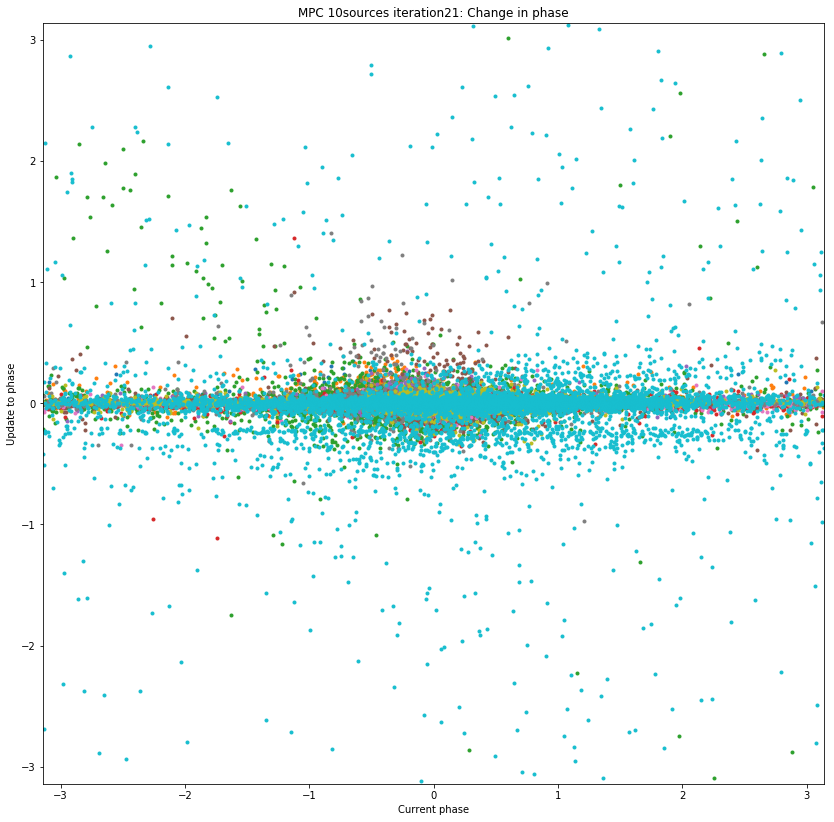

Iteration 22
arlexecute.compute: Execution using Dask took 37.205 seconds
arlexecute.compute: Execution using Dask took 33.424 seconds
arlexecute.compute: Execution using Dask took 36.178 seconds
0 0.0693142256527904
1 0.05770954426647902
2 0.06703911996707702
3 0.03295096225820879
4 0.034710207485704414
5 0.055866374839749926
6 0.051261998931125756
7 0.062105732673256406
8 0.05225014933246694
9 0.05517469635952953
Peak residual : 0.0693142256527904
arlexecute.compute: Execution using Dask took 7.787 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.003133397641319856'
		min: '-0.0062508946654660546'
		rms: '5.157741061044668e-06'
		sum: '0.0671483153722545'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.130 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.006256449239801872'
		min: '-0.0031602095334396967'
		rms: '5.40095

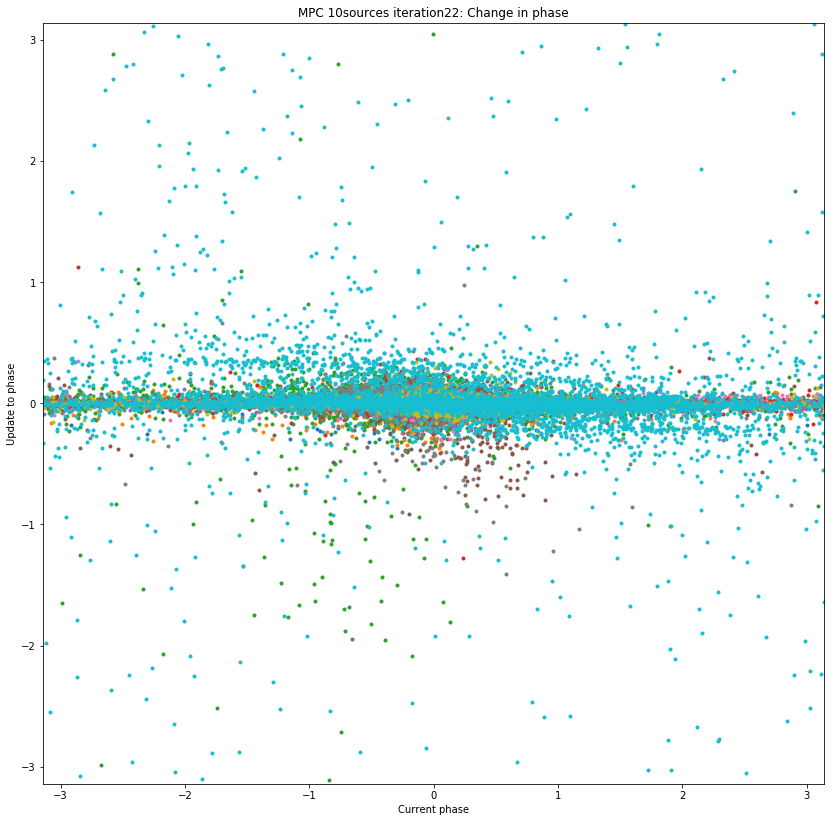

Iteration 23
arlexecute.compute: Execution using Dask took 37.953 seconds
arlexecute.compute: Execution using Dask took 33.619 seconds
arlexecute.compute: Execution using Dask took 36.337 seconds
0 0.06307374696795348
1 0.05974607239699704
2 0.06189989363045246
3 0.030873072547975396
4 0.030375692124880234
5 0.055164342698066804
6 0.04807959680467097
7 0.06804293654964108
8 0.057356219021822384
9 0.05571175938001283
Peak residual : 0.06804293654964108
arlexecute.compute: Execution using Dask took 7.374 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0029734679085171786'
		min: '-0.0030476070791084745'
		rms: '3.816256881582507e-06'
		sum: '0.08351933166612166'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.856 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0030893490602814508'
		min: '-0.00302337755749613'
		rms: '4.29

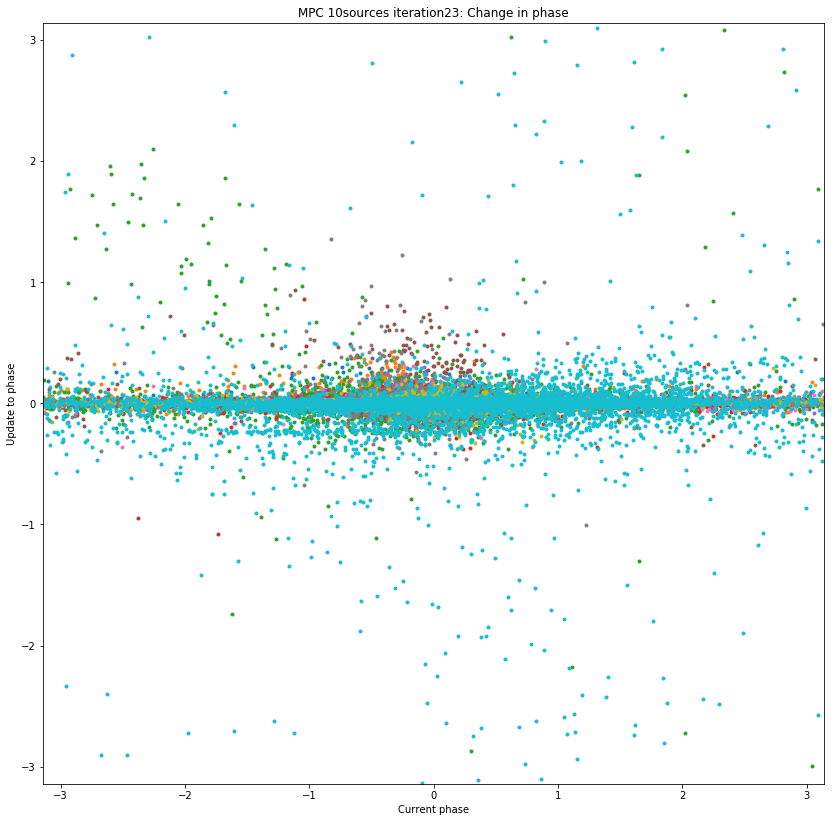

Iteration 24
arlexecute.compute: Execution using Dask took 37.692 seconds
arlexecute.compute: Execution using Dask took 33.524 seconds
arlexecute.compute: Execution using Dask took 36.445 seconds
0 0.06640131681534503
1 0.056944515753633226
2 0.0649606797175495
3 0.02937249129551205
4 0.030151733381696008
5 0.05648045506432823
6 0.04954023127981254
7 0.063340271931147
8 0.05525154963226485
9 0.05444921375372695
Peak residual : 0.06640131681534503
arlexecute.compute: Execution using Dask took 7.439 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.004470379570811767'
		min: '-0.0029707760486739595'
		rms: '4.798640038686828e-06'
		sum: '-0.004660986078673091'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.912 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002915458933230362'
		min: '-0.002992682180599294'
		rms: '4.017351

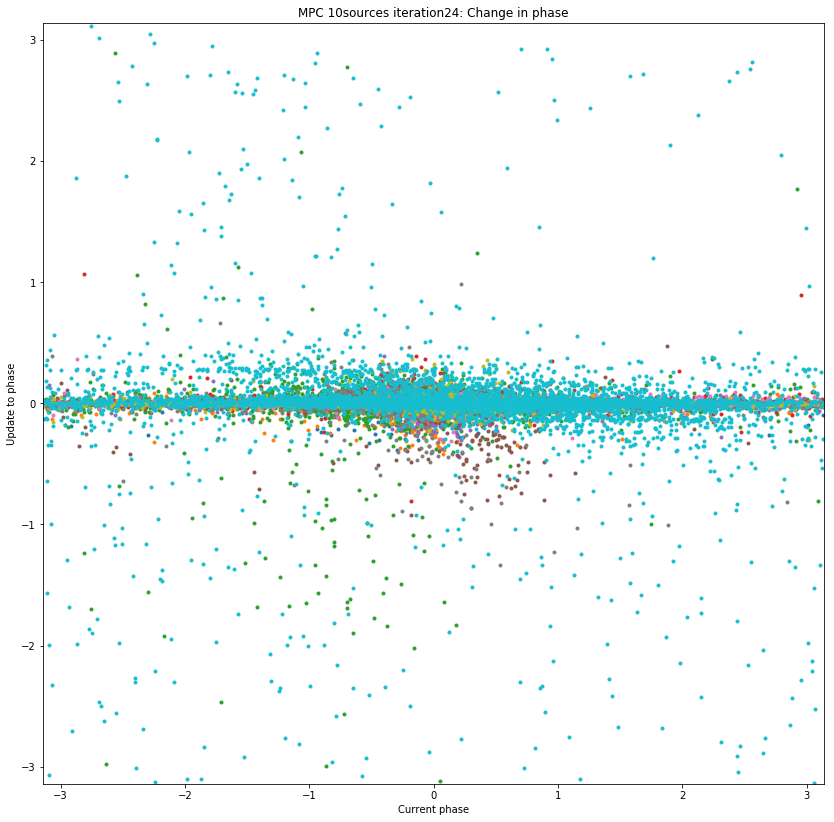

Iteration 25
arlexecute.compute: Execution using Dask took 37.557 seconds
arlexecute.compute: Execution using Dask took 33.770 seconds
arlexecute.compute: Execution using Dask took 36.116 seconds
0 0.0632675680639507
1 0.05812387049118962
2 0.06259040108408209
3 0.030335192038132258
4 0.029612236161071448
5 0.05378454011020566
6 0.04627342426927262
7 0.06599142917129824
8 0.05517945392363951
9 0.05249825495315873
Peak residual : 0.06599142917129824
arlexecute.compute: Execution using Dask took 7.247 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028792549599909005'
		min: '-0.002935329426622451'
		rms: '4.210722155232879e-06'
		sum: '0.017095146076722044'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.873 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028718302665900973'
		min: '-0.0029734959763597843'
		rms: '3.275

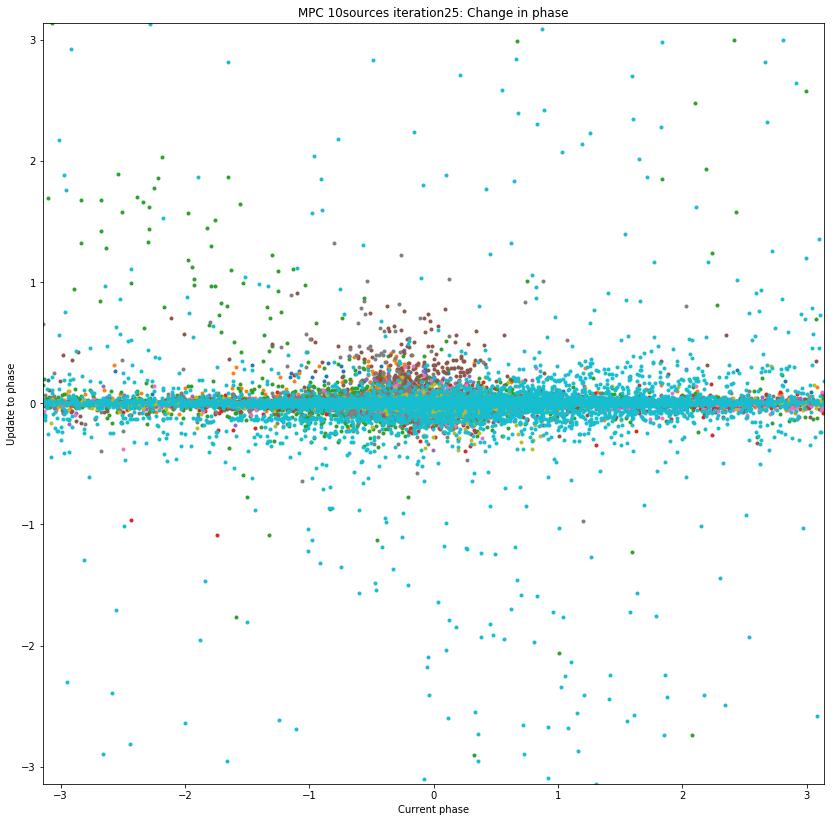

Iteration 26
arlexecute.compute: Execution using Dask took 37.623 seconds
arlexecute.compute: Execution using Dask took 33.589 seconds
arlexecute.compute: Execution using Dask took 36.253 seconds
0 0.065764588239021
1 0.0565095235738537
2 0.06303861147051337
3 0.0286931287145399
4 0.029465555325408246
5 0.0550888166847141
6 0.046321052759427744
7 0.06291918886038786
8 0.05410995894488299
9 0.053281291183183095
Peak residual : 0.065764588239021
arlexecute.compute: Execution using Dask took 6.871 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027754848951243027'
		min: '-0.002810376648212138'
		rms: '3.1184775070834896e-06'
		sum: '-0.0001610759874538948'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.260 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028927711306237593'
		min: '-0.002844574713676242'
		rms: '2.549545

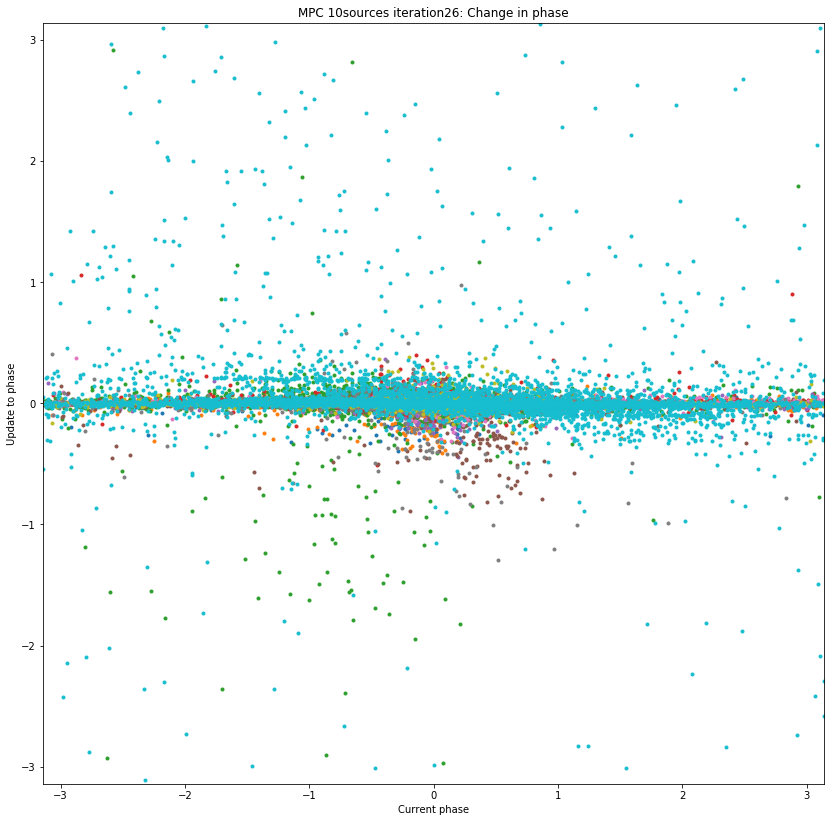

Iteration 27
arlexecute.compute: Execution using Dask took 37.763 seconds
arlexecute.compute: Execution using Dask took 33.782 seconds
arlexecute.compute: Execution using Dask took 36.243 seconds
0 0.06338735951869603
1 0.057016801432791
2 0.05971048242266174
3 0.027712684069111433
4 0.02890435715464248
5 0.05550546577303174
6 0.04552671001767224
7 0.06620168521959649
8 0.053909346786732495
9 0.05314714791487122
Peak residual : 0.06620168521959649
arlexecute.compute: Execution using Dask took 7.325 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028103287658775553'
		min: '-0.0027671210778516453'
		rms: '2.542833199619958e-06'
		sum: '0.00835691281521502'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.799 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028279567148231026'
		min: '-0.0027722645291545175'
		rms: '2.7958

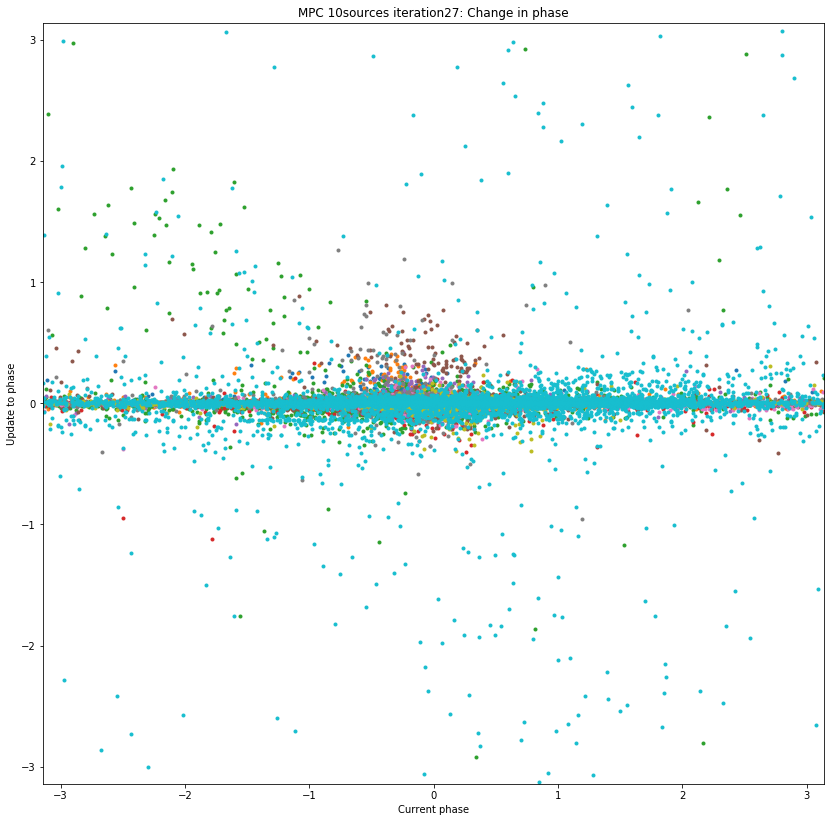

Iteration 28
arlexecute.compute: Execution using Dask took 37.587 seconds
arlexecute.compute: Execution using Dask took 33.902 seconds
arlexecute.compute: Execution using Dask took 36.046 seconds
0 0.06644206010931254
1 0.05600181280823479
2 0.062013332470801624
3 0.02780078596223852
4 0.028353795916304048
5 0.05623074175944599
6 0.0472070329033683
7 0.062449228822229516
8 0.052265199768508484
9 0.05145148494281915
Peak residual : 0.06644206010931254
arlexecute.compute: Execution using Dask took 7.426 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002766119111454295'
		min: '-0.0028324942924893635'
		rms: '2.5290036577617146e-06'
		sum: '0.023644321112996507'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.124 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002831879736989198'
		min: '-0.002783803757203217'
		rms: '1.44

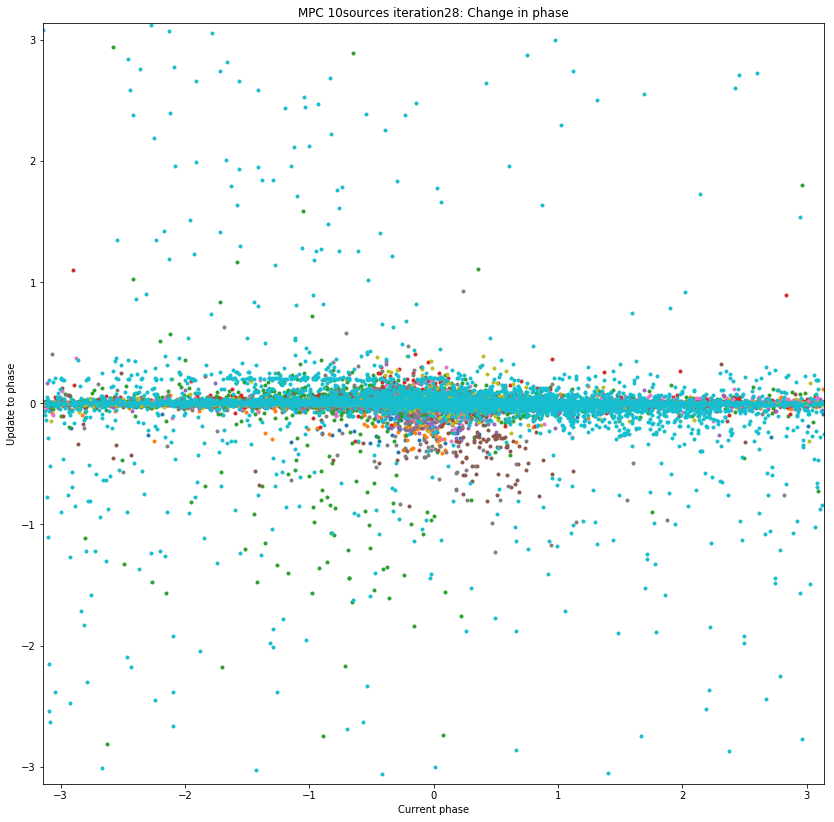

Iteration 29
arlexecute.compute: Execution using Dask took 37.712 seconds
arlexecute.compute: Execution using Dask took 33.821 seconds
arlexecute.compute: Execution using Dask took 36.367 seconds
0 0.0640390326986817
1 0.056888082279529836
2 0.06040788007382025
3 0.02860529670659128
4 0.02784199725692033
5 0.05364141271367475
6 0.047177672120417825
7 0.0647344918565844
8 0.05207862955894903
9 0.05172085077186034
Peak residual : 0.0647344918565844
arlexecute.compute: Execution using Dask took 7.563 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028057548033131197'
		min: '-0.002854384163410255'
		rms: '3.697655825665808e-06'
		sum: '-0.023962645972400328'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.992 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027583984714625114'
		min: '-0.002757008435746688'
		rms: '2.91409

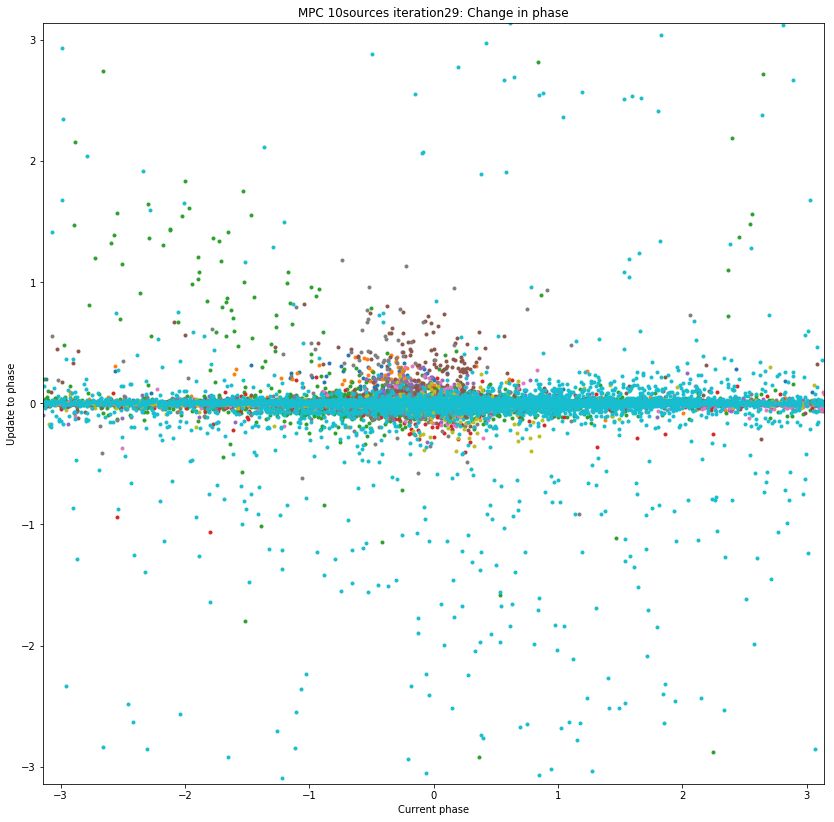

Iteration 30
arlexecute.compute: Execution using Dask took 37.943 seconds
arlexecute.compute: Execution using Dask took 33.775 seconds
arlexecute.compute: Execution using Dask took 36.440 seconds
0 0.06565115982597174
1 0.05691511354585887
2 0.062479235865161284
3 0.027956412158112846
4 0.028294686606189404
5 0.05483525775029485
6 0.04695792028341279
7 0.060436413127332604
8 0.0541341979683153
9 0.051384964103030395
Peak residual : 0.06565115982597174
arlexecute.compute: Execution using Dask took 7.384 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027541299068514816'
		min: '-0.0028847978815812855'
		rms: '1.8799177169609981e-06'
		sum: '-0.0027885392426682445'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.139 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027469964925394604'
		min: '-0.002781820297354541'
		rms: 

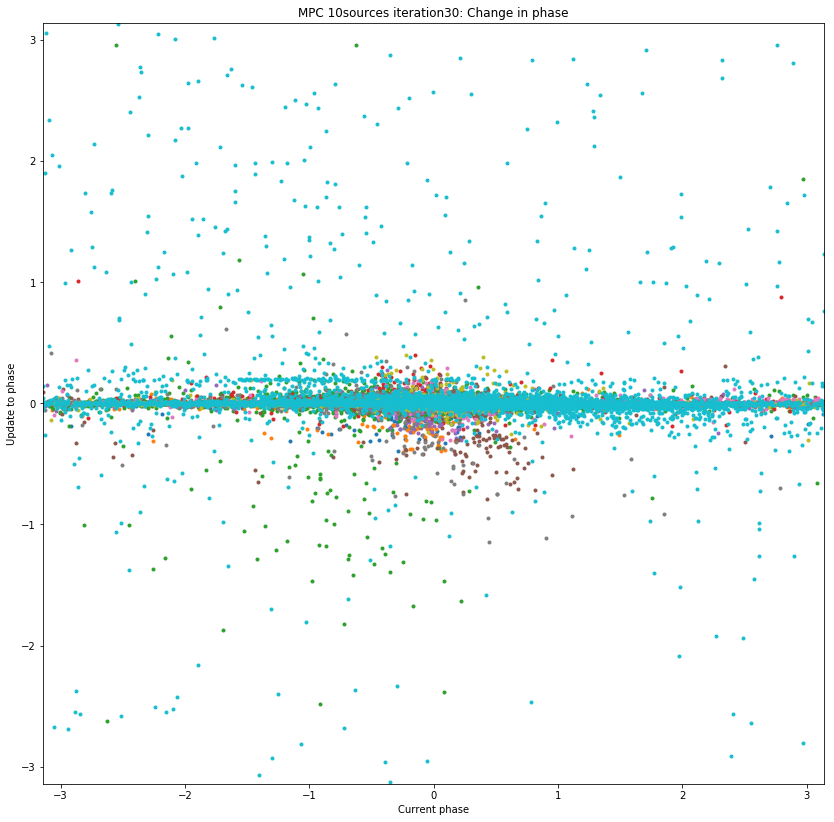

Iteration 31
arlexecute.compute: Execution using Dask took 37.686 seconds
arlexecute.compute: Execution using Dask took 33.466 seconds
arlexecute.compute: Execution using Dask took 36.536 seconds
0 0.06241899116222436
1 0.05657166071681429
2 0.05925463725781643
3 0.027589119430090812
4 0.02829436465530221
5 0.05481687675360194
6 0.04633041120035235
7 0.0652343808103554
8 0.05481499109595211
9 0.05408812620194213
Peak residual : 0.0652343808103554
arlexecute.compute: Execution using Dask took 7.448 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002728863249163957'
		min: '-0.0027071433348025004'
		rms: '2.493179161487413e-06'
		sum: '0.005625047821140913'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.088 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028133679990645167'
		min: '-0.002883506795663377'
		rms: '1.793327

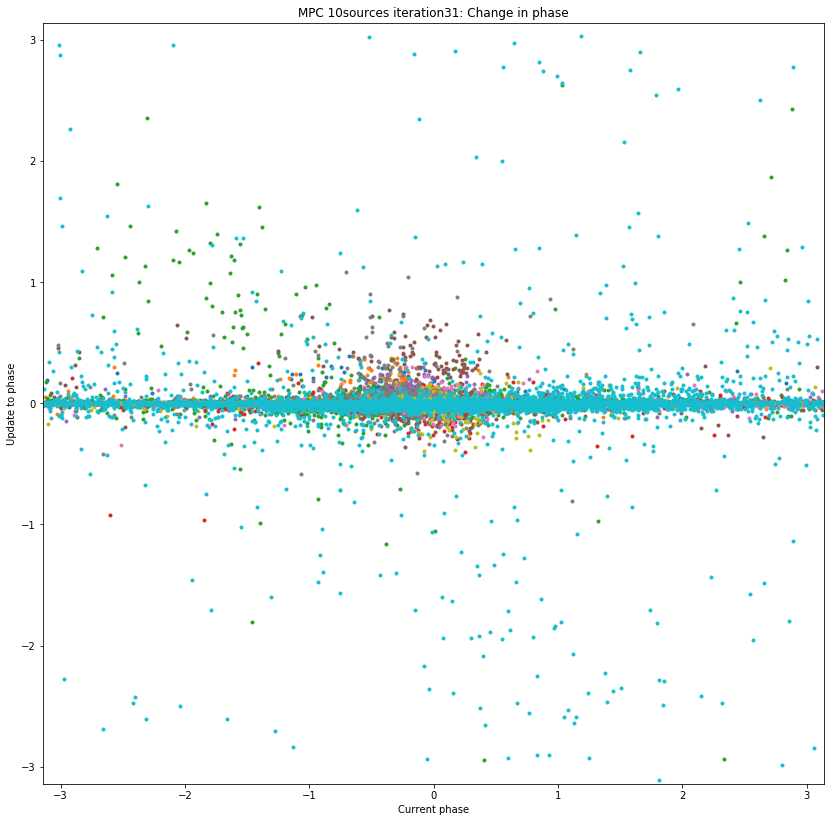

Iteration 32
arlexecute.compute: Execution using Dask took 37.921 seconds
arlexecute.compute: Execution using Dask took 33.523 seconds
arlexecute.compute: Execution using Dask took 36.453 seconds
0 0.06475772718750623
1 0.056399324261093654
2 0.06351950490730301
3 0.02709039923884711
4 0.02938587540023875
5 0.054039165180503466
6 0.04570890533238076
7 0.06215309684205835
8 0.051343628648659115
9 0.054505200745751756
Peak residual : 0.06475772718750623
arlexecute.compute: Execution using Dask took 7.648 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002646370633103511'
		min: '-0.0027289101159989025'
		rms: '2.0486370123045572e-06'
		sum: '-0.01844667866353604'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.985 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002774540648077386'
		min: '-0.0027884244390246563'
		rms: '1.

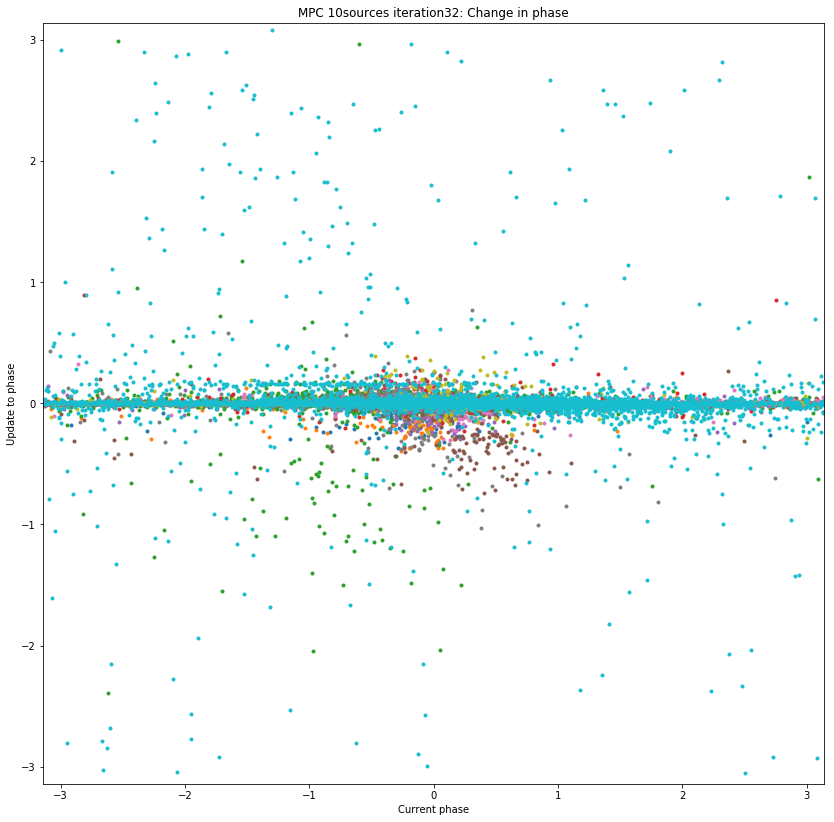

Iteration 33
arlexecute.compute: Execution using Dask took 37.753 seconds
arlexecute.compute: Execution using Dask took 33.628 seconds
arlexecute.compute: Execution using Dask took 36.091 seconds
0 0.062111427842562475
1 0.05766377345698332
2 0.06010486587593357
3 0.027779647231168735
4 0.02792865302315725
5 0.05374580073941976
6 0.04642447628855803
7 0.06337306722807731
8 0.05220167844127177
9 0.052745967185628156
Peak residual : 0.06337306722807731
arlexecute.compute: Execution using Dask took 7.622 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0028374892015919553'
		min: '-0.002710378298123853'
		rms: '3.2738685992912813e-06'
		sum: '0.041394459299773'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.243 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027766552647909204'
		min: '-0.0027903208175740868'
		rms: '3.319

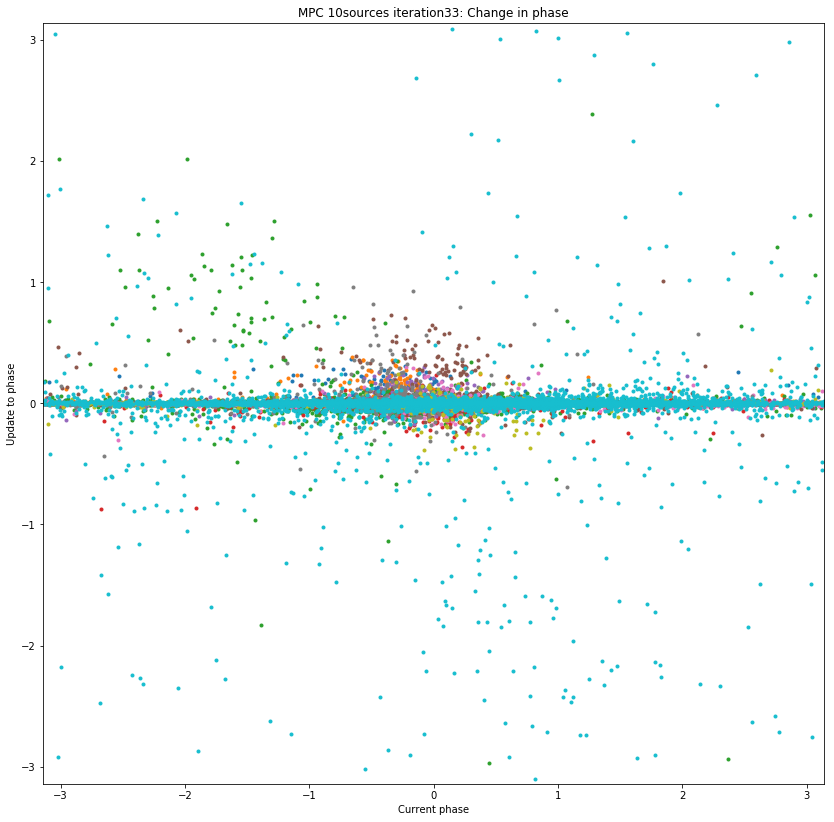

Iteration 34
arlexecute.compute: Execution using Dask took 37.760 seconds
arlexecute.compute: Execution using Dask took 33.671 seconds
arlexecute.compute: Execution using Dask took 36.122 seconds
0 0.06424561452194226
1 0.05795851008145148
2 0.06325473741316394
3 0.02852593694630095
4 0.02775766926678456
5 0.05500754424291769
6 0.04560459476991959
7 0.06109402014136736
8 0.050395952523582616
9 0.048755149483703374
Peak residual : 0.06424561452194226
arlexecute.compute: Execution using Dask took 7.014 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002839578107349269'
		min: '-0.002725543646134324'
		rms: '2.364289100124962e-06'
		sum: '-0.0033154405260662463'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.188 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027532123379840636'
		min: '-0.0027052970979496785'
		rms: '2.1

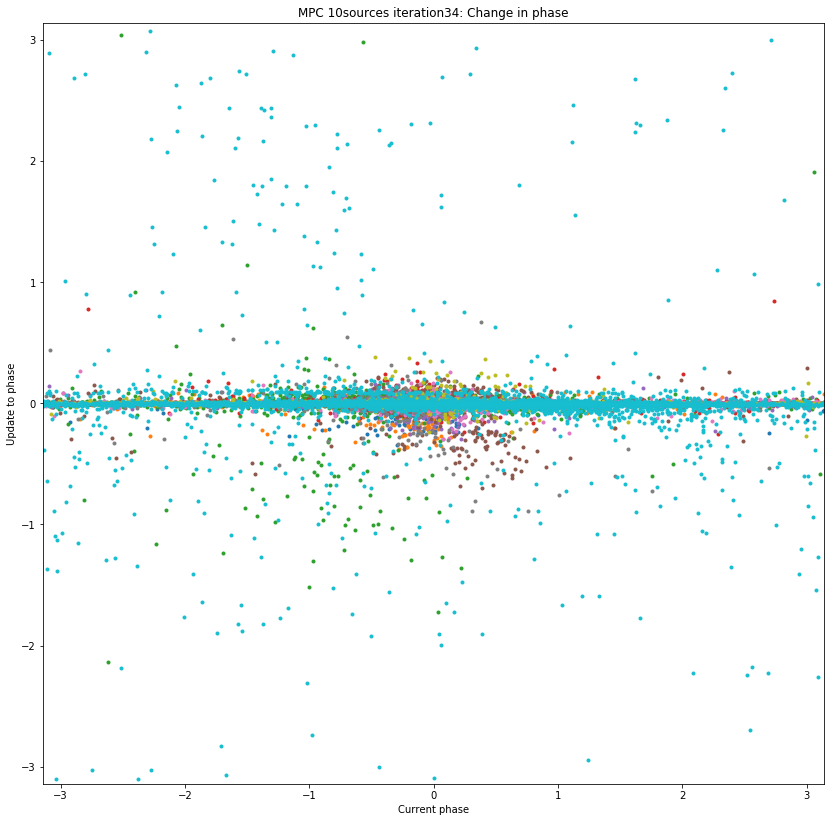

Iteration 35
arlexecute.compute: Execution using Dask took 37.811 seconds
arlexecute.compute: Execution using Dask took 33.476 seconds
arlexecute.compute: Execution using Dask took 36.295 seconds
0 0.0634313454474772
1 0.05780907290991418
2 0.058827970628102744
3 0.02723882982113862
4 0.027526817448586885
5 0.054353677891794766
6 0.04647994908140478
7 0.06300316433953204
8 0.052241731926053525
9 0.05140766037976296
Peak residual : 0.0634313454474772
arlexecute.compute: Execution using Dask took 7.330 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002667192140333145'
		min: '-0.0027079477270121155'
		rms: '2.7510225713352063e-06'
		sum: '0.018499181756697555'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.232 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002660184292997175'
		min: '-0.0027260626691724657'
		rms: '2.28

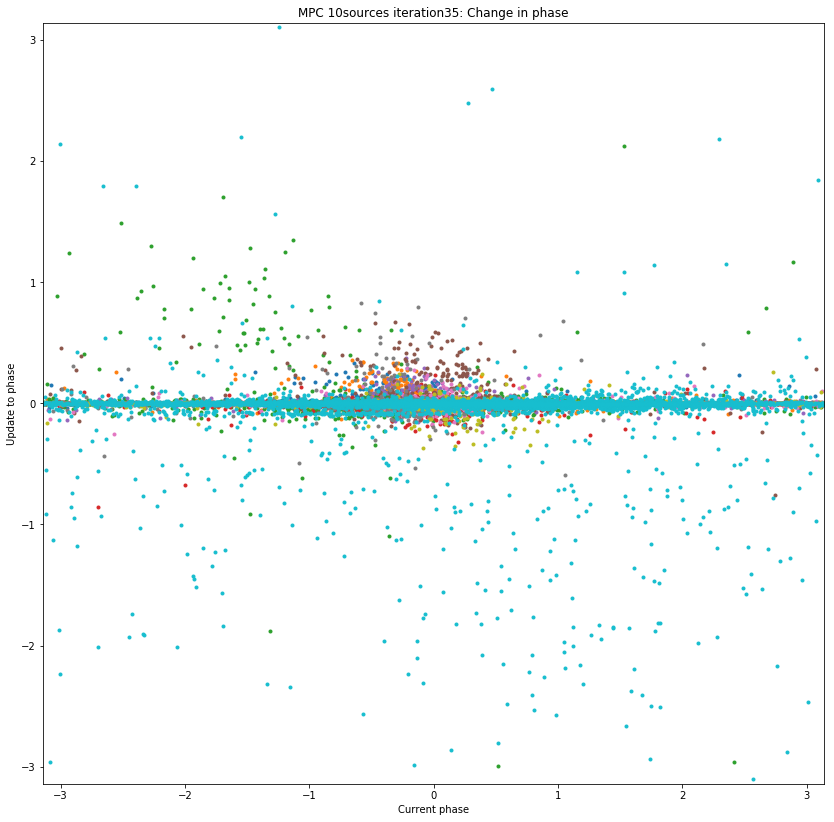

Iteration 36
arlexecute.compute: Execution using Dask took 37.834 seconds
arlexecute.compute: Execution using Dask took 33.918 seconds
arlexecute.compute: Execution using Dask took 35.910 seconds
0 0.06400657661927614
1 0.05626712834595094
2 0.05987464553213051
3 0.02725366310129415
4 0.027369095494582354
5 0.05400238024209654
6 0.046132377153687516
7 0.061631293099164694
8 0.05016625417599693
9 0.05269820781115363
Peak residual : 0.06400657661927614
arlexecute.compute: Execution using Dask took 7.317 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026379889991816154'
		min: '-0.0027207780954024863'
		rms: '2.060773250830708e-06'
		sum: '-0.009023382429957405'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.922 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002681814894516818'
		min: '-0.00271768524908052'
		rms: '2.40

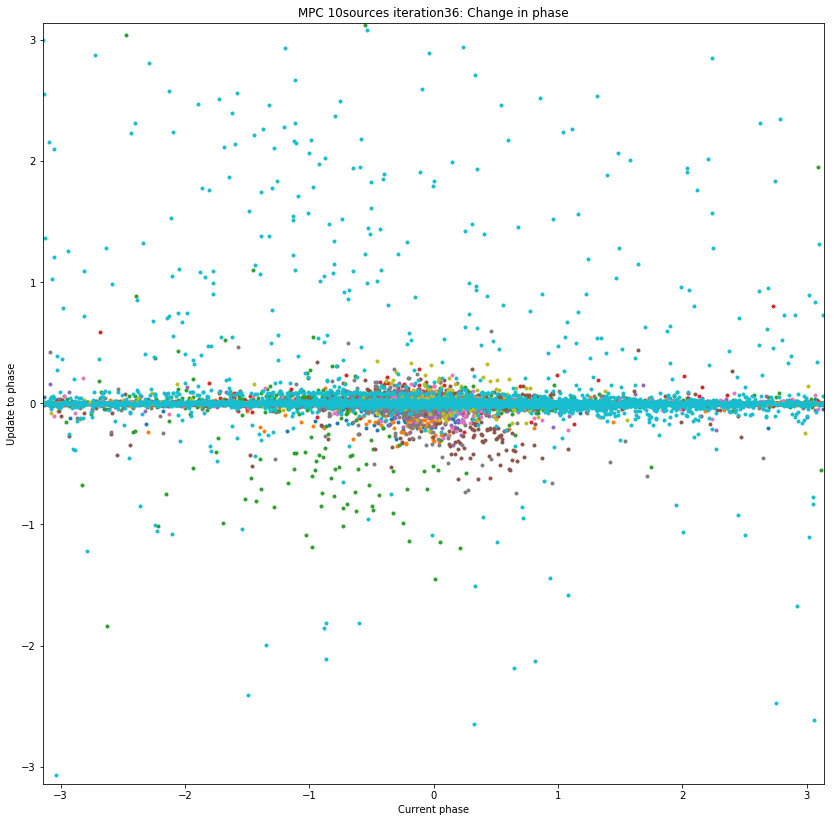

Iteration 37
arlexecute.compute: Execution using Dask took 37.774 seconds
arlexecute.compute: Execution using Dask took 33.581 seconds
arlexecute.compute: Execution using Dask took 36.478 seconds
0 0.06041214976943288
1 0.05818985373296765
2 0.058023028150512294
3 0.02690297968512285
4 0.026920732246020346
5 0.053012507514760734
6 0.047592771677273035
7 0.06415413897961074
8 0.05408216042071411
9 0.05312393979666803
Peak residual : 0.06415413897961074
arlexecute.compute: Execution using Dask took 7.284 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027352540283108614'
		min: '-0.0026409106317274575'
		rms: '1.691882860414081e-06'
		sum: '-0.010762043326325984'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.168 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002668080213267065'
		min: '-0.0026712486910449042'
		rms: '1

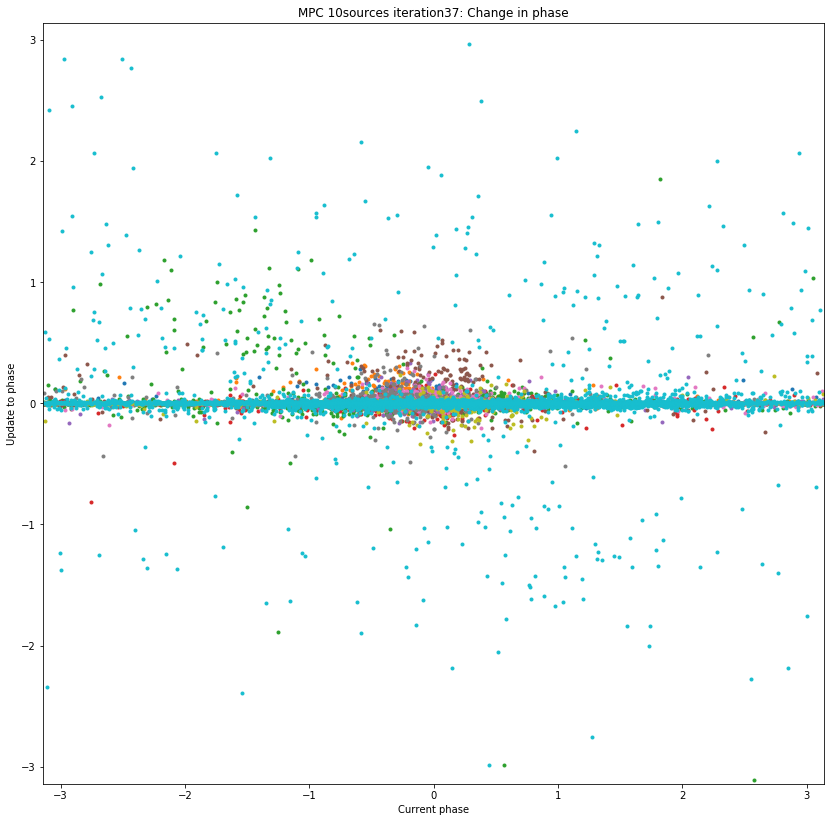

Iteration 38
arlexecute.compute: Execution using Dask took 37.591 seconds
arlexecute.compute: Execution using Dask took 33.470 seconds
arlexecute.compute: Execution using Dask took 36.632 seconds
0 0.06322030823079847
1 0.056198158236845604
2 0.06155258487677755
3 0.027388318530370014
4 0.02692435614107612
5 0.05340004079637561
6 0.04454106334528717
7 0.063951169852226
8 0.049916212928326556
9 0.052461159971403
Peak residual : 0.063951169852226
arlexecute.compute: Execution using Dask took 7.209 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026444578825142906'
		min: '-0.0026951729035102167'
		rms: '2.0290550716476676e-06'
		sum: '1.72571992960004e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.083 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002013993250622504'
		min: '-0.002594439798769168'
		rms: '9.8706309

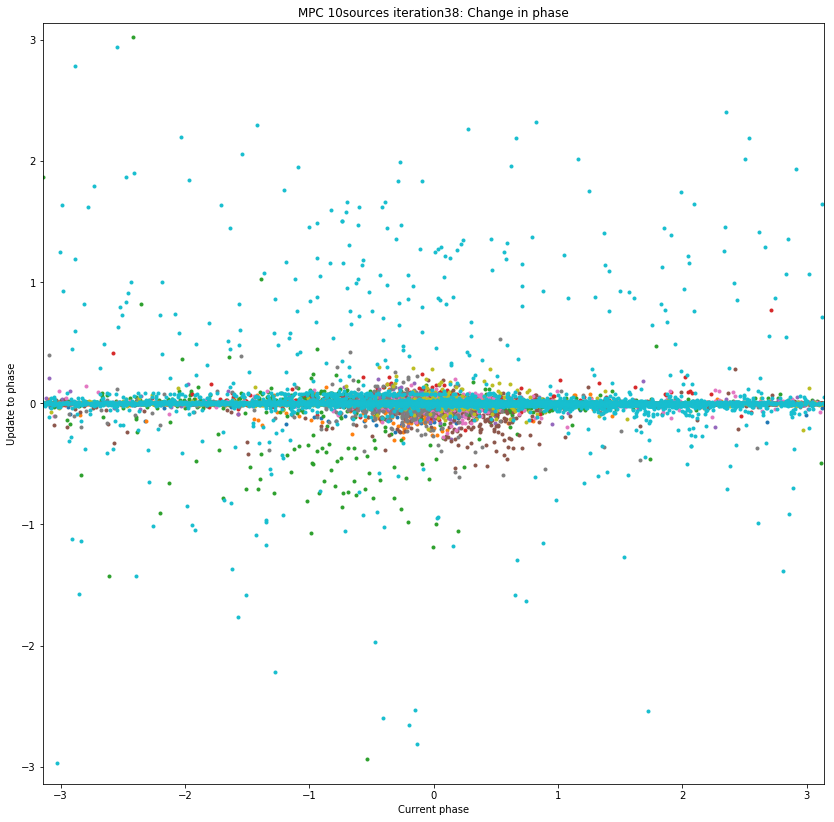

Iteration 39
arlexecute.compute: Execution using Dask took 37.662 seconds
arlexecute.compute: Execution using Dask took 33.496 seconds
arlexecute.compute: Execution using Dask took 36.495 seconds
0 0.06246103967304735
1 0.05699266763559508
2 0.059071001579829086
3 0.026867389148073604
4 0.02666754576232725
5 0.05406993071099123
6 0.0453937967909281
7 0.0631438072302149
8 0.05133744141897994
9 0.05590366548791029
Peak residual : 0.0631438072302149
arlexecute.compute: Execution using Dask took 7.204 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002689468057464547'
		min: '-0.0024480901853123817'
		rms: '1.8680530586530708e-06'
		sum: '0.023998439615225093'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.267 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002716288426235185'
		min: '-0.002636257852213794'
		rms: '1.974344

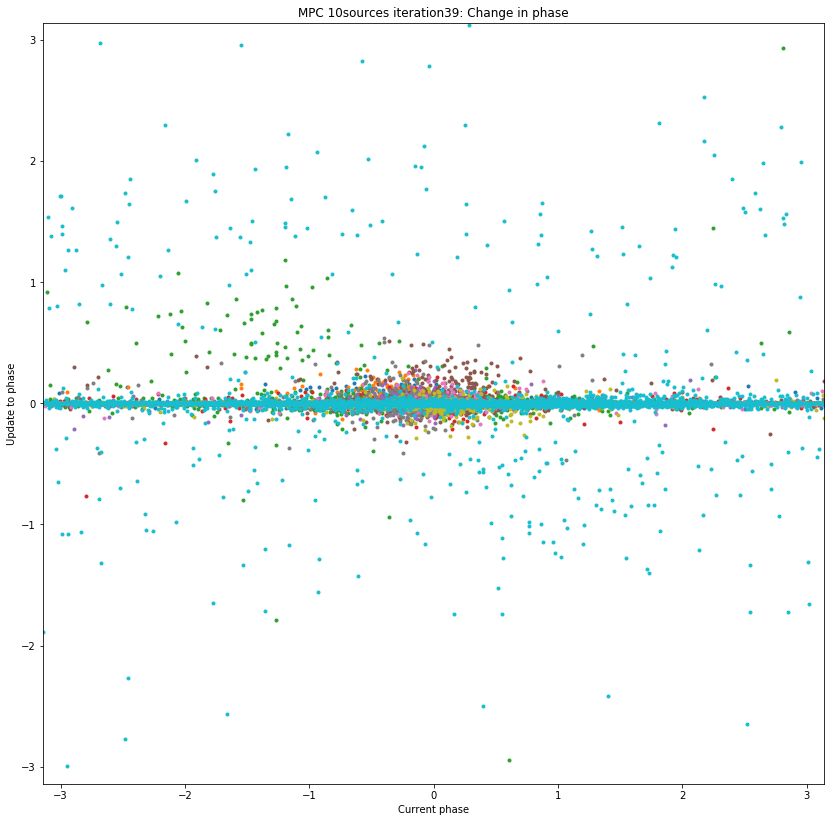

Iteration 40
arlexecute.compute: Execution using Dask took 37.496 seconds
arlexecute.compute: Execution using Dask took 33.589 seconds
arlexecute.compute: Execution using Dask took 36.299 seconds
0 0.062407265800974346
1 0.055044890375841975
2 0.05974749055837612
3 0.0265782181991819
4 0.02637599137091581
5 0.0560385654984934
6 0.043857832411516015
7 0.0616702961359436
8 0.051404920461257234
9 0.05440814361104132
Peak residual : 0.062407265800974346
arlexecute.compute: Execution using Dask took 7.593 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00262431466524734'
		min: '-0.0026170576458880842'
		rms: '2.2984119137200837e-06'
		sum: '-0.0044400069122233375'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.274 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002635169040440534'
		min: '-0.0026178822662788685'
		rms: '2.3

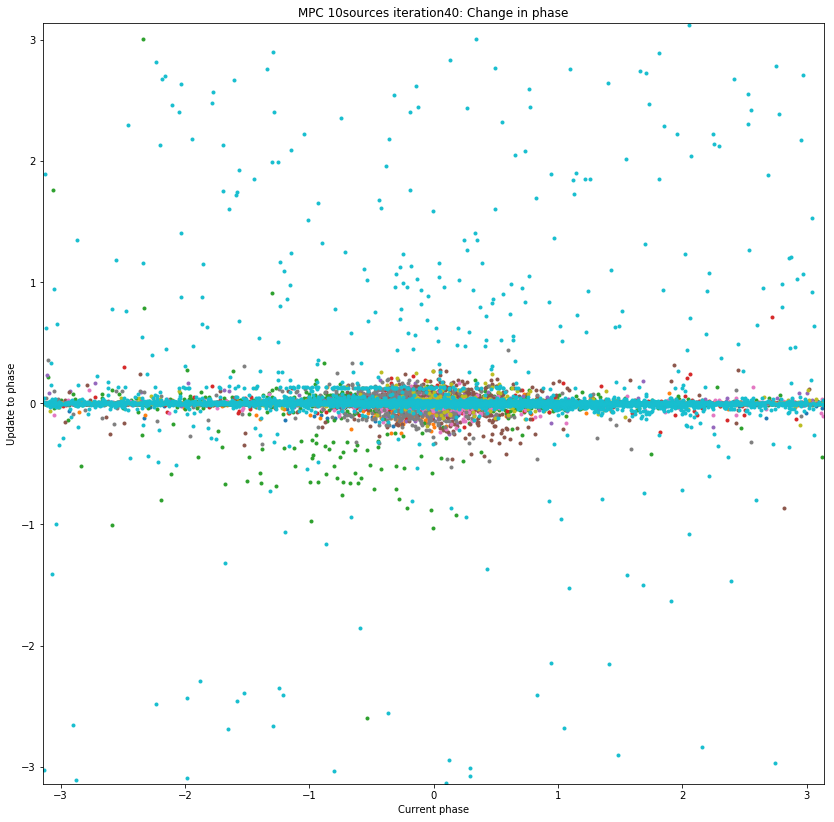

Iteration 41
arlexecute.compute: Execution using Dask took 37.783 seconds
arlexecute.compute: Execution using Dask took 33.686 seconds
arlexecute.compute: Execution using Dask took 36.427 seconds
0 0.061129766939300376
1 0.0584528439494221
2 0.05743110124480777
3 0.02668412559924204
4 0.02712719062267374
5 0.05273353838237644
6 0.047107835505900586
7 0.06327985839773681
8 0.052330356777737654
9 0.05142732966456865
Peak residual : 0.06327985839773681
arlexecute.compute: Execution using Dask took 7.865 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026560982998837966'
		min: '-0.00263942181246298'
		rms: '1.7947823902963303e-06'
		sum: '0.007893288410511824'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.158 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026350540150145672'
		min: '-0.0026299514345280075'
		rms: '2.09

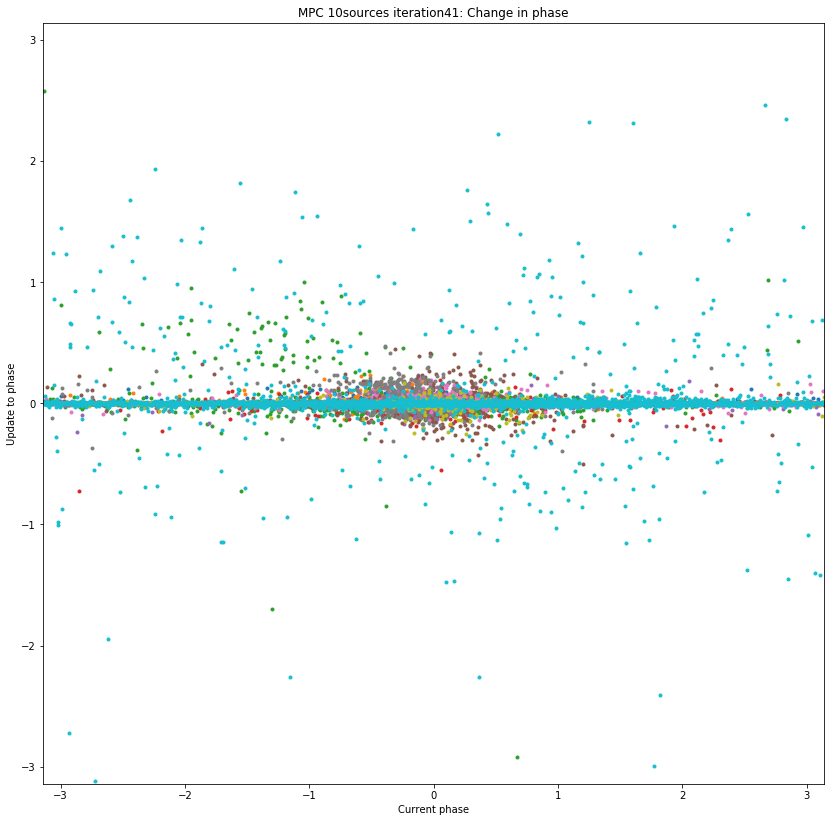

Iteration 42
arlexecute.compute: Execution using Dask took 37.805 seconds
arlexecute.compute: Execution using Dask took 33.727 seconds
arlexecute.compute: Execution using Dask took 36.514 seconds
0 0.0610779824453057
1 0.05673282234775945
2 0.05917547608503372
3 0.026292816741076752
4 0.026637244585798872
5 0.05263784780211207
6 0.046921233986385716
7 0.06446353631432335
8 0.05156303971659216
9 0.05025761762734802
Peak residual : 0.06446353631432335
arlexecute.compute: Execution using Dask took 7.156 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026291812069622455'
		min: '-0.0027878488449464196'
		rms: '1.295902266836058e-06'
		sum: '0.0026358656858785053'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.072 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00250305976039855'
		min: '-0.002505922434493279'
		rms: '1.119

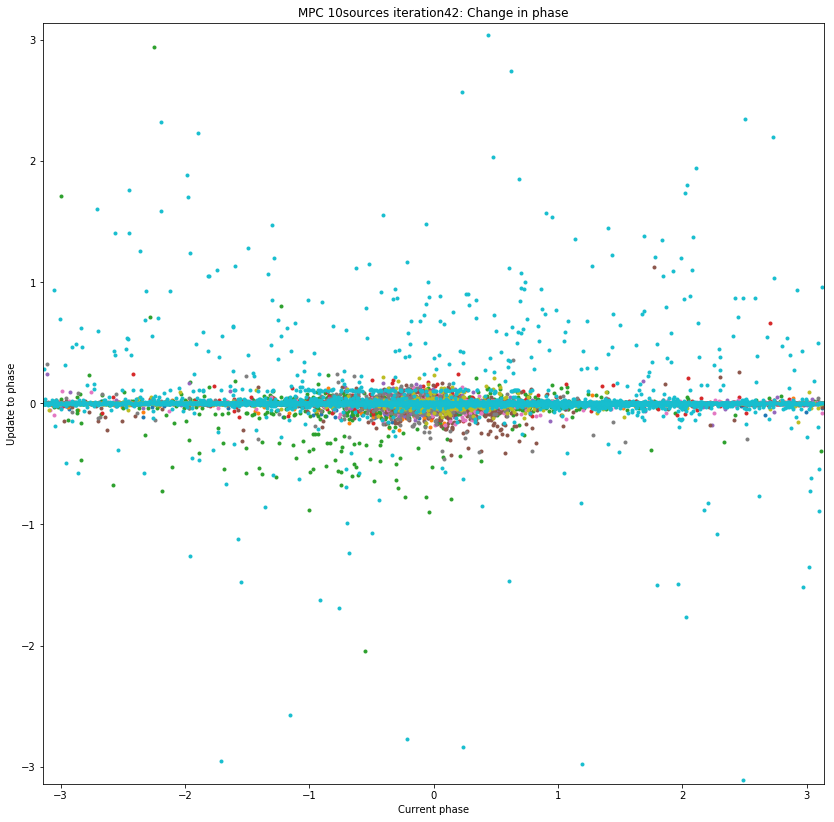

Iteration 43
arlexecute.compute: Execution using Dask took 37.782 seconds
arlexecute.compute: Execution using Dask took 33.811 seconds
arlexecute.compute: Execution using Dask took 36.709 seconds
0 0.0624781130389592
1 0.05821129024533802
2 0.05769775219740414
3 0.026452785766413467
4 0.02714127003631006
5 0.05317933382917392
6 0.04838317917045689
7 0.06096999628795405
8 0.051787939268797226
9 0.052417954522184715
Peak residual : 0.0624781130389592
arlexecute.compute: Execution using Dask took 7.075 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025687792953307973'
		min: '-0.002748161148163184'
		rms: '2.0893647180686567e-06'
		sum: '-0.005200709301207832'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.848 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025787369679990835'
		min: '-0.002631126087205226'
		rms: '1.77

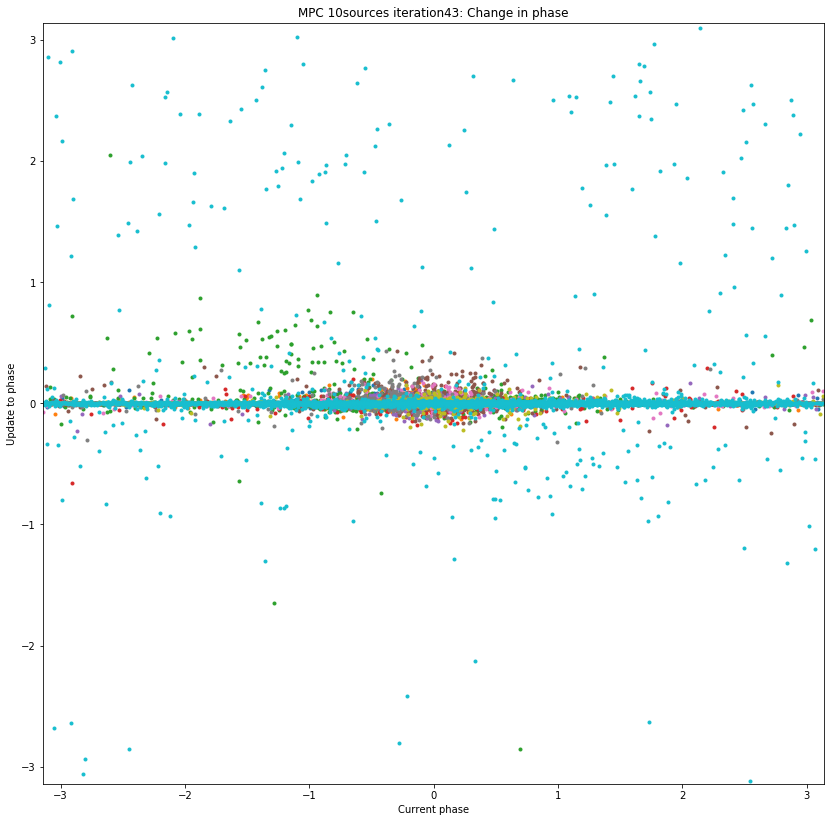

Iteration 44
arlexecute.compute: Execution using Dask took 37.871 seconds
arlexecute.compute: Execution using Dask took 33.819 seconds
arlexecute.compute: Execution using Dask took 36.653 seconds
0 0.06424770161925944
1 0.05548591297663046
2 0.057816405945512794
3 0.026421160174873642
4 0.02678418366225187
5 0.053623448573481794
6 0.04597976915774958
7 0.06214784116506694
8 0.05028825415194212
9 0.05123601321788418
Peak residual : 0.06424770161925944
arlexecute.compute: Execution using Dask took 7.547 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002619791661823814'
		min: '-0.0025836589754758034'
		rms: '1.0301937295839825e-06'
		sum: '-6.702545230275435e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.238 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001995871399155913'
		min: '-0.0026580462747933745'
		rms: '1

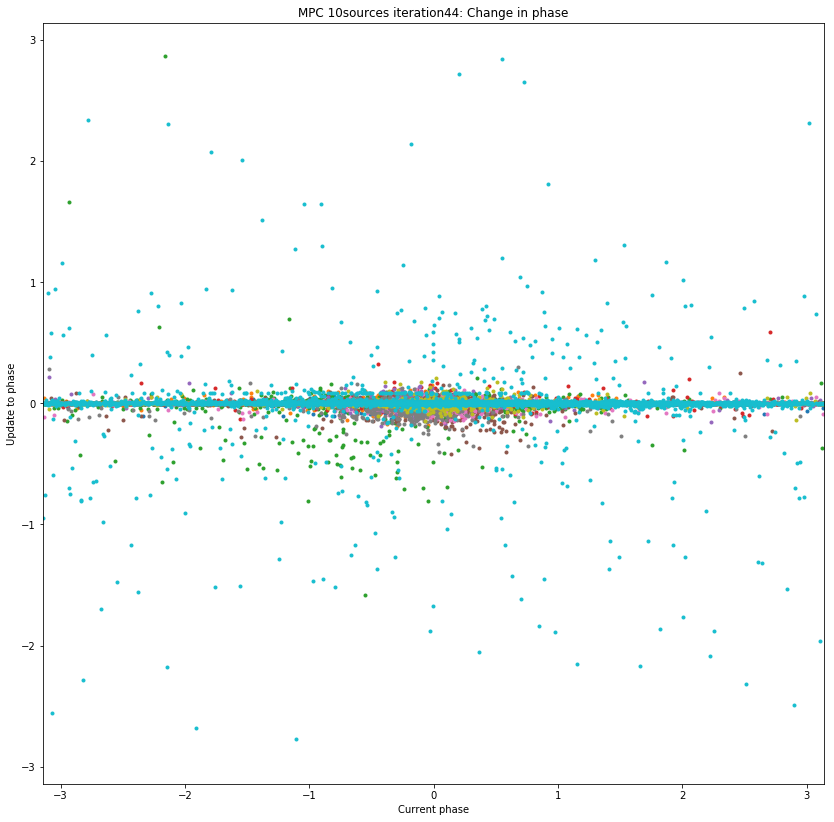

Iteration 45
arlexecute.compute: Execution using Dask took 37.716 seconds
arlexecute.compute: Execution using Dask took 34.164 seconds
arlexecute.compute: Execution using Dask took 36.643 seconds
0 0.06321799871972507
1 0.057463239888877214
2 0.056628374273012407
3 0.02675419904567147
4 0.026294455351239948
5 0.05450750844019905
6 0.04774211708250138
7 0.06275126069235223
8 0.051596355830623886
9 0.050015780634082505
Peak residual : 0.06321799871972507
arlexecute.compute: Execution using Dask took 7.116 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025941379757991982'
		min: '-0.0026598539677861275'
		rms: '1.1721371944725927e-06'
		sum: '0.00268912863410456'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.967 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002621978537631946'
		min: '-0.002012923524387124'
		rms: '8.

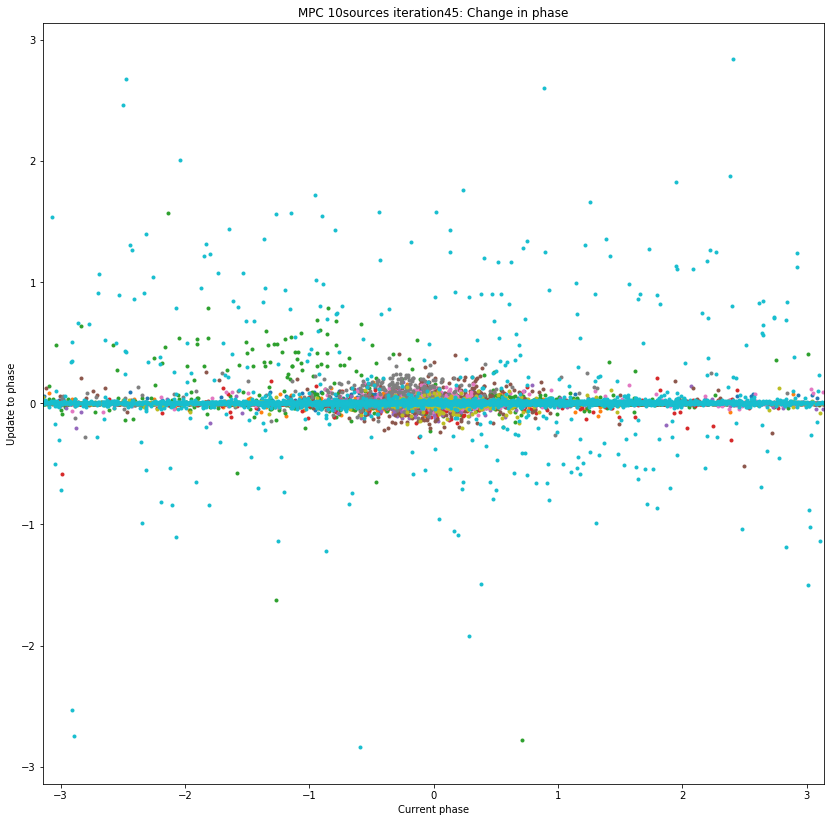

Iteration 46
arlexecute.compute: Execution using Dask took 37.936 seconds
arlexecute.compute: Execution using Dask took 33.820 seconds
arlexecute.compute: Execution using Dask took 36.882 seconds
0 0.06214163279258353
1 0.055044332642732806
2 0.058171241188669884
3 0.026280166528954638
4 0.026135169404141432
5 0.05468793010640189
6 0.04780015572628591
7 0.06300841652014272
8 0.05025327235955908
9 0.05084516040789131
Peak residual : 0.06300841652014272
arlexecute.compute: Execution using Dask took 7.314 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025580856096761562'
		min: '-0.001996590285472706'
		rms: '1.5391751666839735e-06'
		sum: '0.009410478218218712'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.874 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019449440371485406'
		min: '-0.0020027411656876565'
		rms: '8

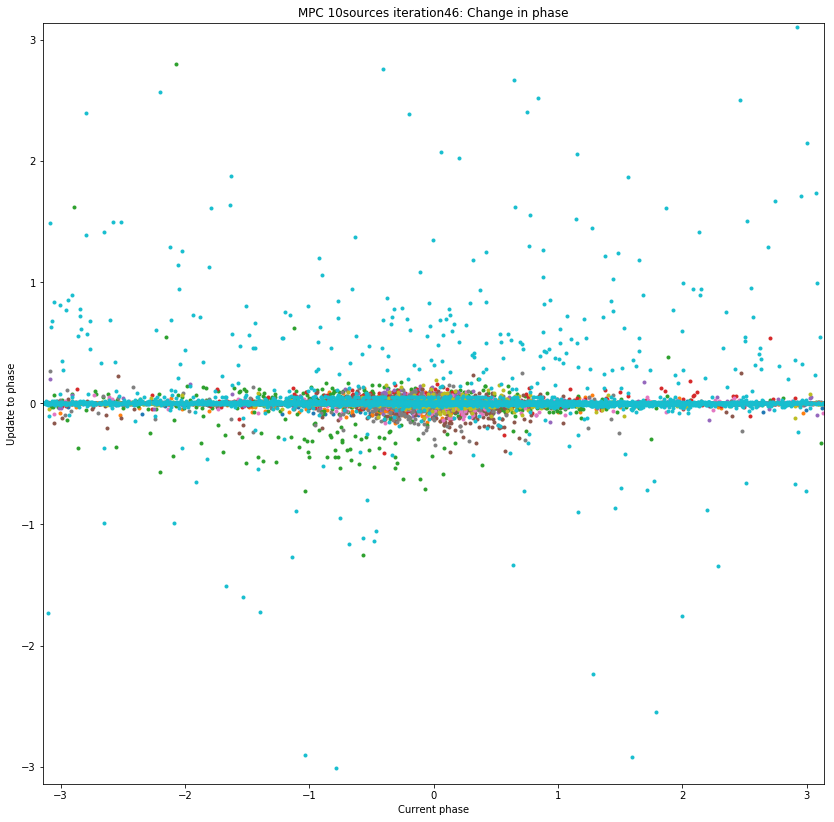

Iteration 47
arlexecute.compute: Execution using Dask took 37.808 seconds
arlexecute.compute: Execution using Dask took 34.163 seconds
arlexecute.compute: Execution using Dask took 36.417 seconds
0 0.06140164638530189
1 0.054760543176167714
2 0.05825931920103883
3 0.026767048086260837
4 0.02650500743034906
5 0.05452978716657457
6 0.04791046148584387
7 0.06385073092078816
8 0.050228110251651165
9 0.050973851369716584
Peak residual : 0.06385073092078816
arlexecute.compute: Execution using Dask took 7.508 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002606846825559823'
		min: '-0.002619495044460526'
		rms: '1.4787492740670392e-06'
		sum: '0.004843997008323728'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.976 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025901070832532215'
		min: '-0.0019075286489385968'
		rms: '9.

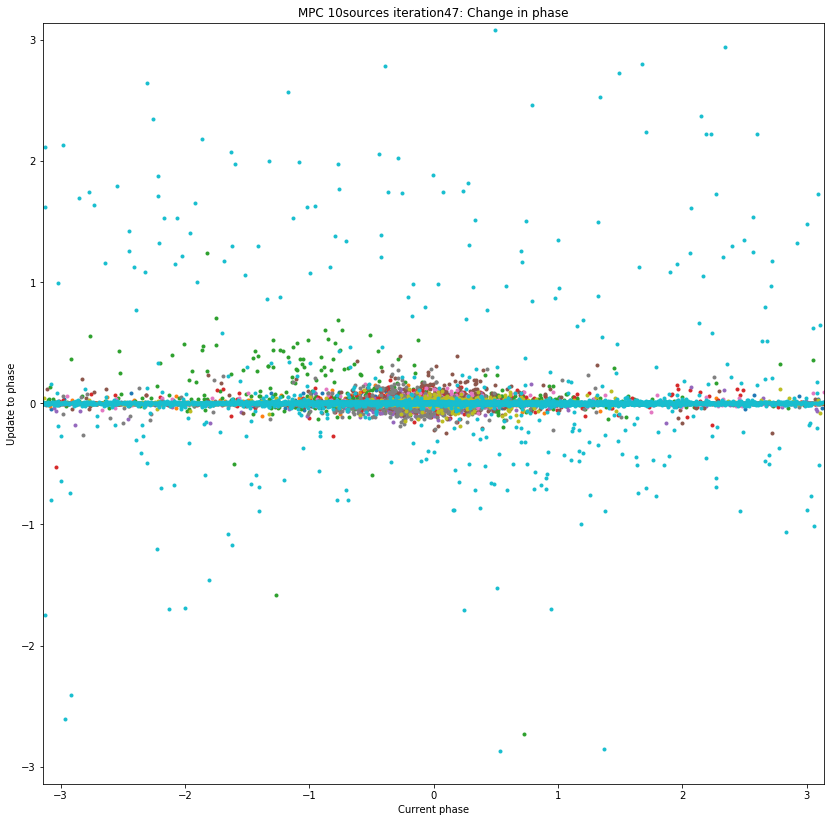

Iteration 48
arlexecute.compute: Execution using Dask took 38.443 seconds
arlexecute.compute: Execution using Dask took 33.614 seconds
arlexecute.compute: Execution using Dask took 36.744 seconds
0 0.06099206073797501
1 0.05539374885520117
2 0.05884875574448542
3 0.02646165907053523
4 0.0264029393214169
5 0.05541266425960408
6 0.04671444456911861
7 0.06266119359464001
8 0.05015927701170672
9 0.04813915434735001
Peak residual : 0.06266119359464001
arlexecute.compute: Execution using Dask took 7.223 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025773166279525503'
		min: '-0.002496600342203023'
		rms: '1.3373277008479088e-06'
		sum: '-0.002735020747710692'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.207 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002595019654591626'
		min: '-0.002610957406543476'
		rms: '1.10861

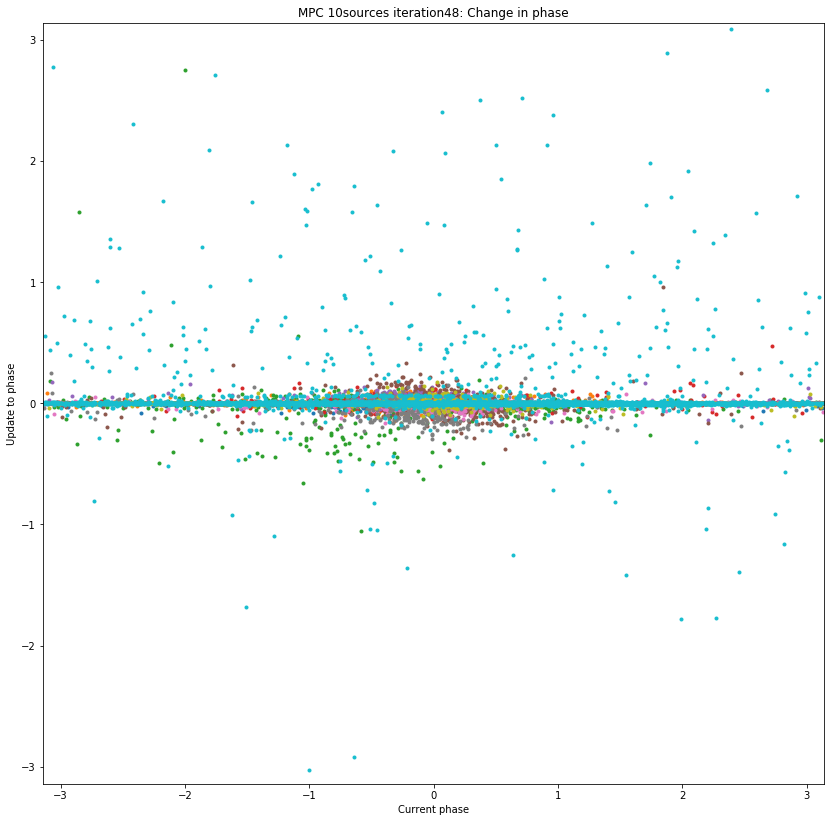

Iteration 49
arlexecute.compute: Execution using Dask took 38.066 seconds
arlexecute.compute: Execution using Dask took 33.701 seconds
arlexecute.compute: Execution using Dask took 36.484 seconds
0 0.062119326320689935
1 0.05673360708148119
2 0.05832547388641894
3 0.02584997532552347
4 0.026525745186543534
5 0.054060115304656625
6 0.049010184995022514
7 0.06247105276949943
8 0.05188335773288664
9 0.05000592660062206
Peak residual : 0.06247105276949943
arlexecute.compute: Execution using Dask took 7.502 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0020057233171026285'
		min: '-0.0020312517850795114'
		rms: '1.3171485712410422e-06'
		sum: '-0.0049577161003907895'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.040 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00265176745000157'
		min: '-0.001987356323314353'
		rms: '1

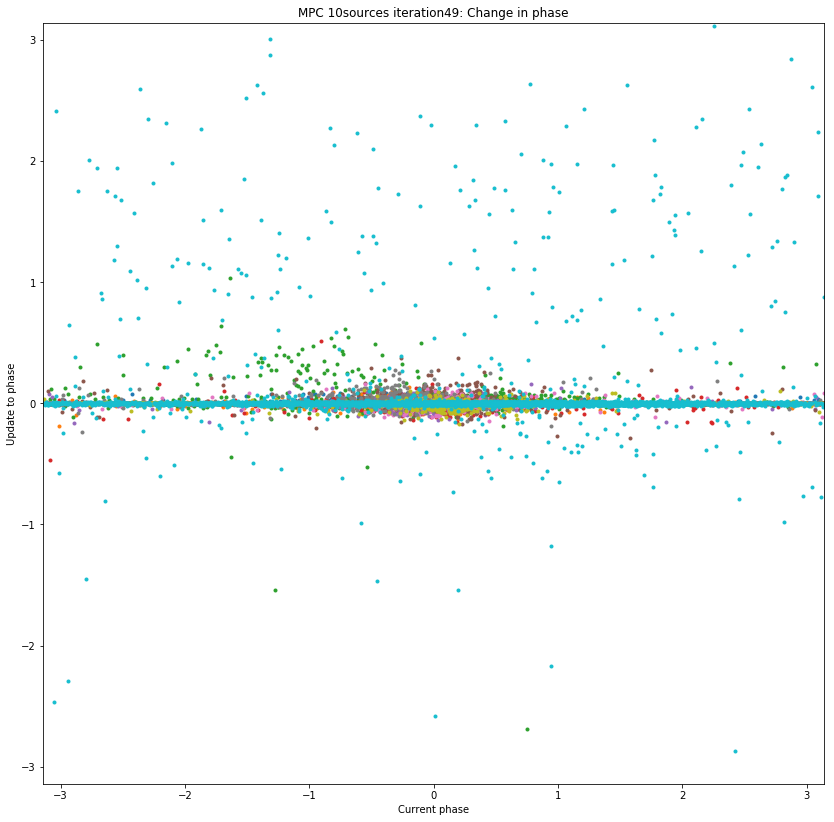

Iteration 50
arlexecute.compute: Execution using Dask took 37.890 seconds
arlexecute.compute: Execution using Dask took 33.996 seconds
arlexecute.compute: Execution using Dask took 36.310 seconds
0 0.06283899936464278
1 0.05540589779089855
2 0.057738990353928404
3 0.02595164814801023
4 0.026878427931910875
5 0.05441018536626887
6 0.04588285716823781
7 0.06163322215722573
8 0.04999384220047375
9 0.05075734682169112
Peak residual : 0.06283899936464278
arlexecute.compute: Execution using Dask took 7.040 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025851662226541137'
		min: '-0.0026192344455283705'
		rms: '1.6038475014662491e-06'
		sum: '-0.007165741847569558'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.744 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0027131897395385705'
		min: '-0.0026099124716294957'
		rms: '1

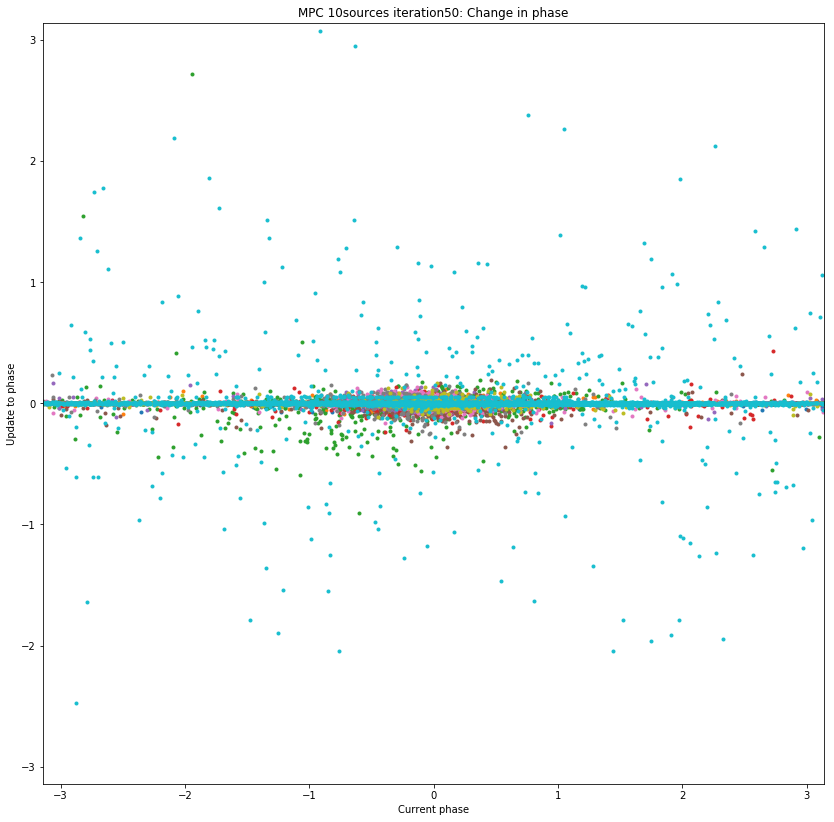

Iteration 51
arlexecute.compute: Execution using Dask took 37.896 seconds
arlexecute.compute: Execution using Dask took 33.517 seconds
arlexecute.compute: Execution using Dask took 36.231 seconds
0 0.06157081472850129
1 0.05603819892986862
2 0.05861962413397387
3 0.026223902308273494
4 0.026662306865735702
5 0.055325136578226505
6 0.04659441471807112
7 0.06201036002287392
8 0.050932170746573635
9 0.052847217887959874
Peak residual : 0.06201036002287392
arlexecute.compute: Execution using Dask took 7.697 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002594575643196584'
		min: '-0.0026439376374437907'
		rms: '1.7468816040216145e-06'
		sum: '-0.011875543930498052'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.166 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019373192250971428'
		min: '-0.0025790287512094828'
		rms: 

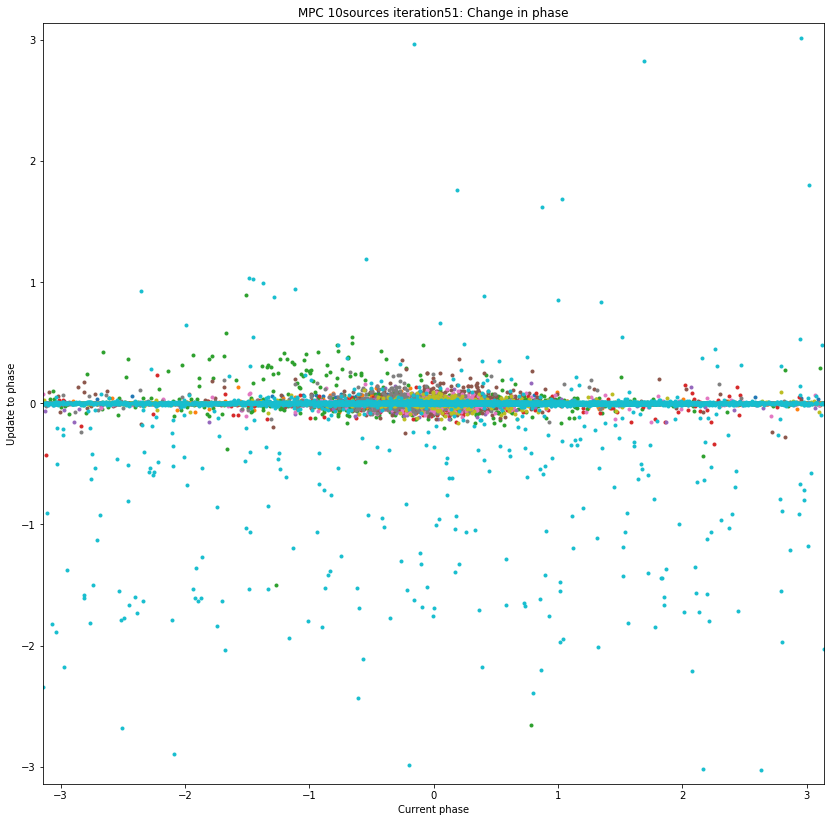

Iteration 52
arlexecute.compute: Execution using Dask took 37.488 seconds
arlexecute.compute: Execution using Dask took 33.822 seconds
arlexecute.compute: Execution using Dask took 36.515 seconds
0 0.06150544775384616
1 0.056416506982949165
2 0.05922522843126789
3 0.02647982353595147
4 0.026282148549607406
5 0.05402572777237596
6 0.04627261859861706
7 0.06390588993000665
8 0.05014369166732904
9 0.052520342273040324
Peak residual : 0.06390588993000665
arlexecute.compute: Execution using Dask took 7.437 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025388105772229472'
		min: '-0.0024705558303149307'
		rms: '1.7358611784397087e-06'
		sum: '-0.002241088066211331'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.024 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025760657374795364'
		min: '-0.002656541896035522'
		rms: '1

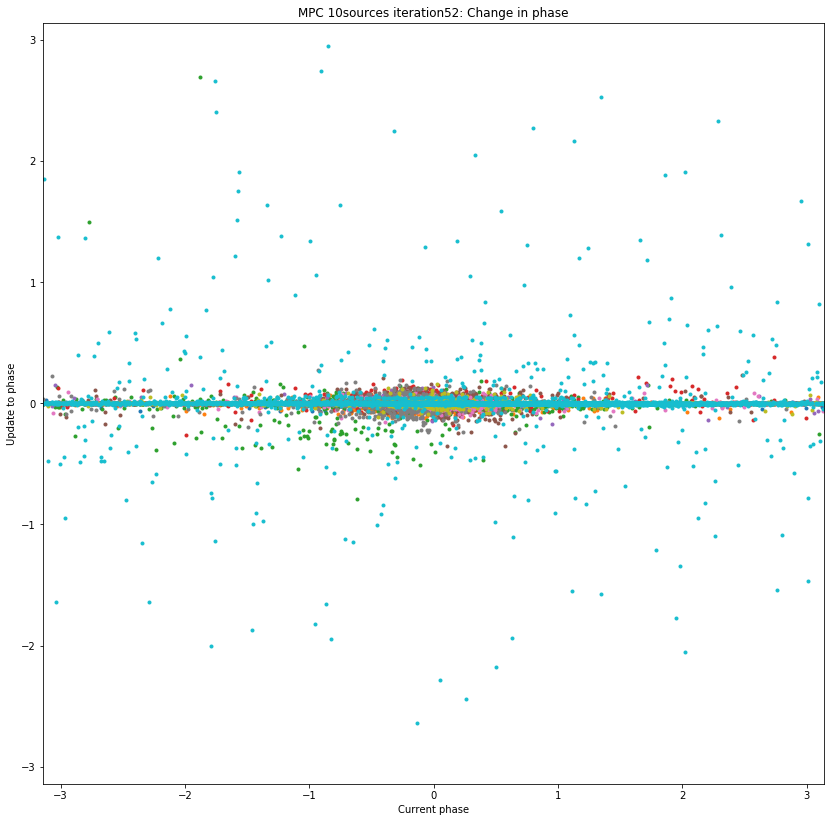

Iteration 53
arlexecute.compute: Execution using Dask took 38.015 seconds
arlexecute.compute: Execution using Dask took 33.929 seconds
arlexecute.compute: Execution using Dask took 36.292 seconds
0 0.061863336716418624
1 0.05627508636862438
2 0.05779531693364298
3 0.026078908811953086
4 0.02675653435194269
5 0.05357788913919259
6 0.047655731236899875
7 0.06298341202557552
8 0.0507355405724976
9 0.0498909515560503
Peak residual : 0.06298341202557552
arlexecute.compute: Execution using Dask took 7.551 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026169402447196307'
		min: '-0.002671599373398113'
		rms: '1.538948885624322e-06'
		sum: '0.00020894208951282453'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.184 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026154250089805314'
		min: '-0.0025961421396730132'
		rms: '1.7

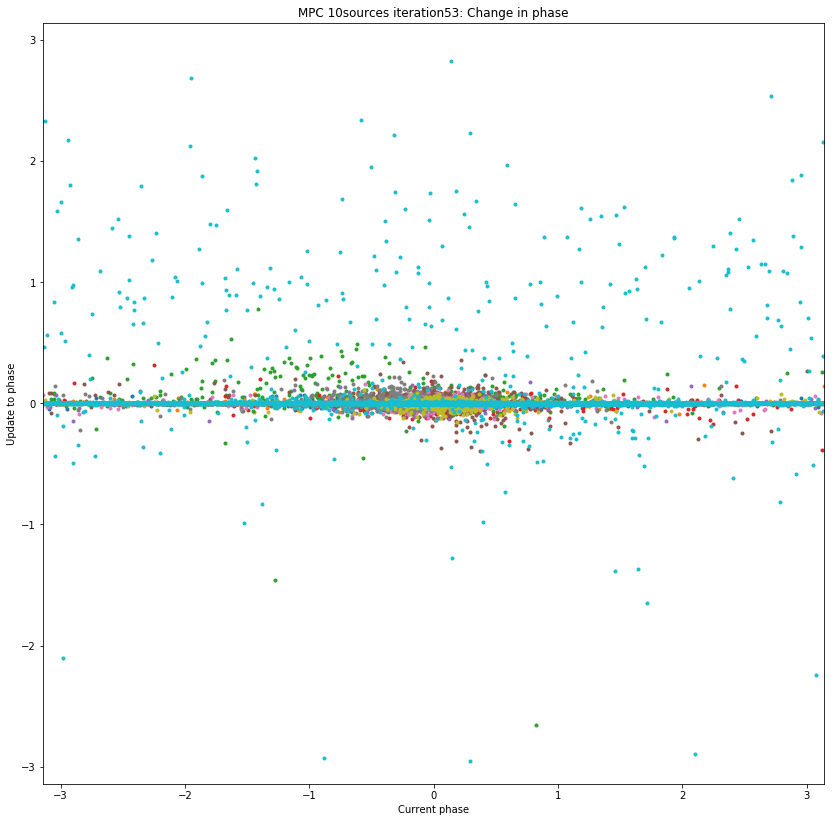

Iteration 54
arlexecute.compute: Execution using Dask took 37.546 seconds
arlexecute.compute: Execution using Dask took 33.780 seconds
arlexecute.compute: Execution using Dask took 36.677 seconds
0 0.06232198028380653
1 0.054978873467435636
2 0.0585686608422088
3 0.02607460904890102
4 0.026486409683356096
5 0.053417326849770234
6 0.04537854947584387
7 0.060978314554434684
8 0.04977033503127022
9 0.04929966425106442
Peak residual : 0.06232198028380653
arlexecute.compute: Execution using Dask took 7.800 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025520259181877666'
		min: '-0.0026298351248228726'
		rms: '1.4694641059662215e-06'
		sum: '0.007533197448878181'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.227 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001918101729278711'
		min: '-0.002561849904803456'
		rms: '1.2

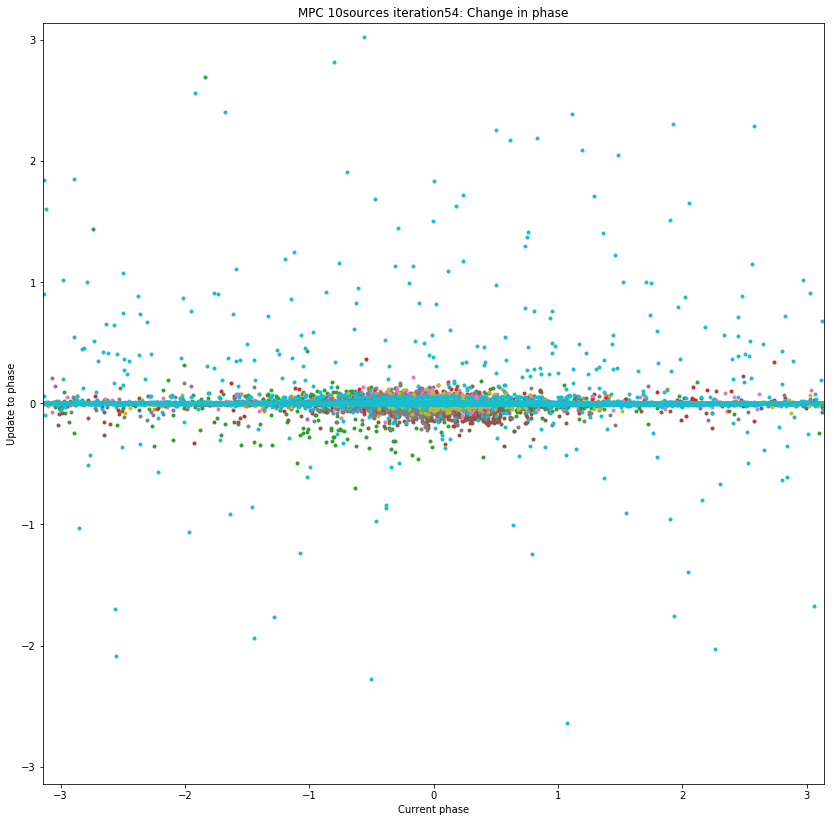

Iteration 55
arlexecute.compute: Execution using Dask took 37.722 seconds
arlexecute.compute: Execution using Dask took 33.674 seconds
arlexecute.compute: Execution using Dask took 36.329 seconds
0 0.06318467901047826
1 0.055690853265032786
2 0.05849140974377783
3 0.025816015846701956
4 0.02564010324627691
5 0.05335970975209526
6 0.04635997697537231
7 0.06031906412043725
8 0.051373747551143656
9 0.047956350172100266
Peak residual : 0.06318467901047826
arlexecute.compute: Execution using Dask took 7.195 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002723651283087355'
		min: '-0.0025654555127592833'
		rms: '1.839306843586703e-06'
		sum: '0.00022252218224271458'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.045 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0020210503755306725'
		rms: '6.892405085585674e

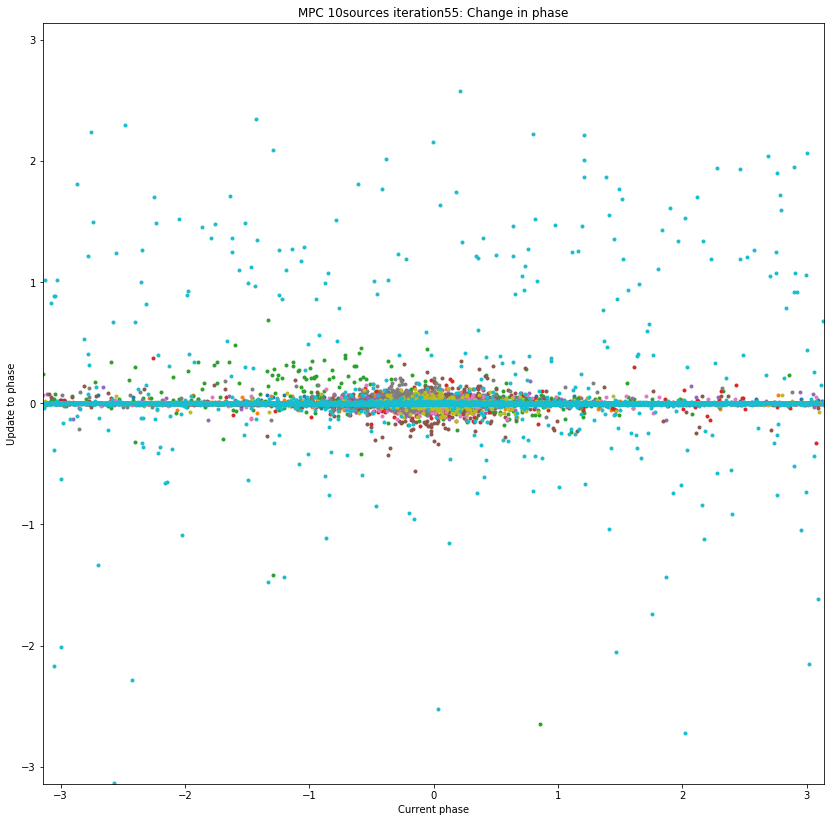

Iteration 56
arlexecute.compute: Execution using Dask took 37.465 seconds
arlexecute.compute: Execution using Dask took 33.626 seconds
arlexecute.compute: Execution using Dask took 36.193 seconds
0 0.06324170245534126
1 0.05555859186318015
2 0.055526552517582206
3 0.025829787361987988
4 0.026344013958597985
5 0.053868476600055074
6 0.04580100715210822
7 0.062230811214616114
8 0.05098673326649994
9 0.0506771391663079
Peak residual : 0.06324170245534126
arlexecute.compute: Execution using Dask took 7.313 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002544387601728463'
		min: '-0.0025263634637968995'
		rms: '1.1531776966989953e-06'
		sum: '-0.00495257675808649'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.180 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0019257597766637413'
		rms: '4.926239052216956e-

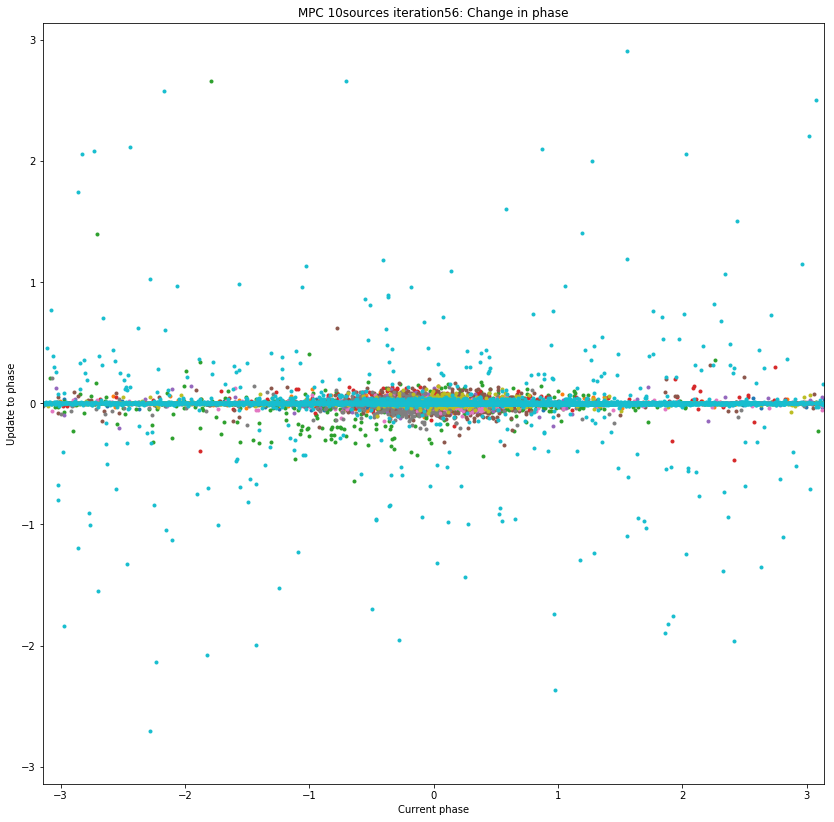

Iteration 57
arlexecute.compute: Execution using Dask took 37.898 seconds
arlexecute.compute: Execution using Dask took 33.763 seconds
arlexecute.compute: Execution using Dask took 36.167 seconds
0 0.06286013417818381
1 0.05507543054779922
2 0.054878981002426774
3 0.026104513371025352
4 0.026211815631506576
5 0.053812579130806885
6 0.04697791892684227
7 0.06121589101698399
8 0.049972152130272424
9 0.05159990037667571
Peak residual : 0.06286013417818381
arlexecute.compute: Execution using Dask took 7.303 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002586476391859386'
		min: '-0.0025576550562703138'
		rms: '1.9050744221015685e-06'
		sum: '-0.0026647687736151373'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.303 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026077087937047463'
		min: '-0.0025806901366364488'
		rms:

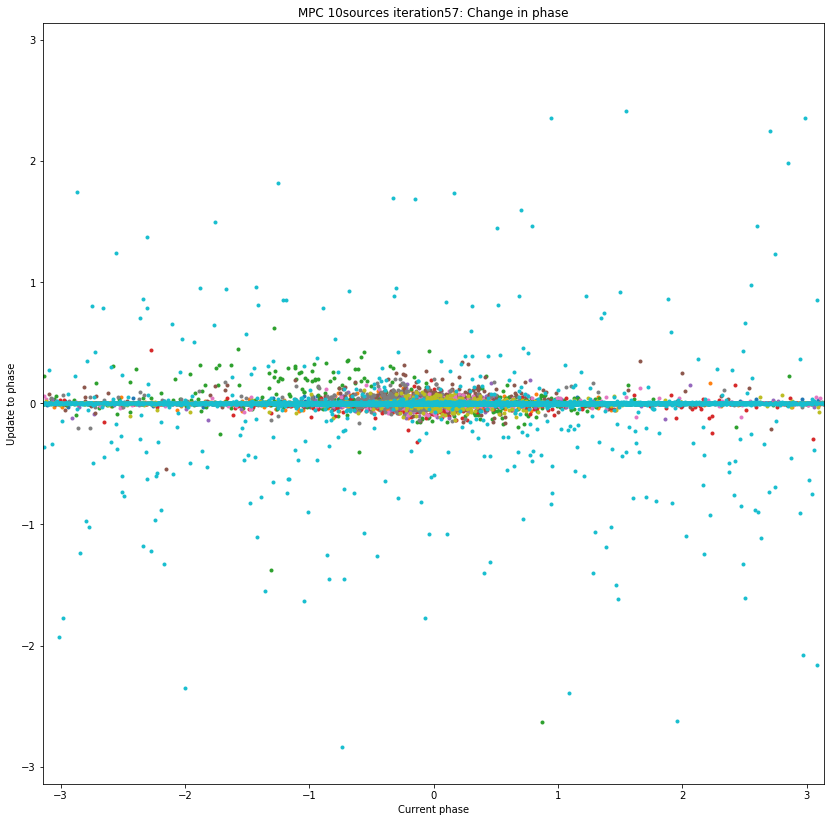

Iteration 58
arlexecute.compute: Execution using Dask took 37.336 seconds
arlexecute.compute: Execution using Dask took 33.530 seconds
arlexecute.compute: Execution using Dask took 36.478 seconds
0 0.06176741699973543
1 0.056727929901145016
2 0.05725571611073117
3 0.025678400585018236
4 0.026231919882786635
5 0.05329495860139229
6 0.04476952383438684
7 0.06093485290327276
8 0.04971793843762318
9 0.051911930169768944
Peak residual : 0.06176741699973543
arlexecute.compute: Execution using Dask took 7.363 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002506656538668319'
		min: '-0.0025108766602747836'
		rms: '1.4184622288501376e-06'
		sum: '0.004097024152268352'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.254 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0001828336426751951'
		min: '-0.00018406492820150614'
		rms: '

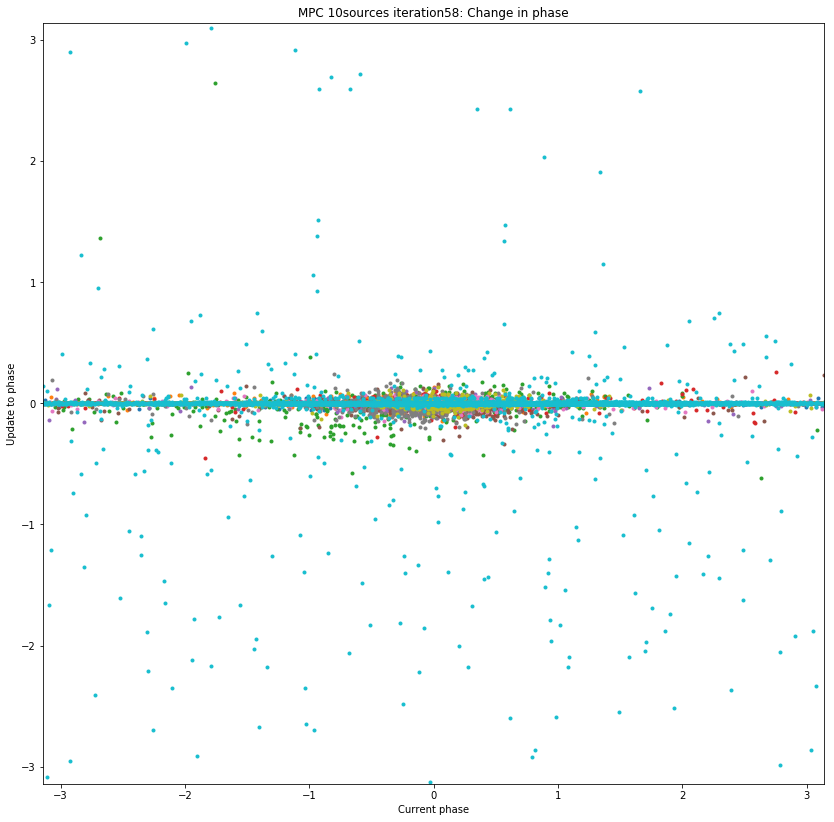

Iteration 59
arlexecute.compute: Execution using Dask took 37.835 seconds
arlexecute.compute: Execution using Dask took 33.459 seconds
arlexecute.compute: Execution using Dask took 36.551 seconds
0 0.06208875970804959
1 0.0592932845289792
2 0.05859042082636904
3 0.026169296490710647
4 0.02513652533331983
5 0.0529673615838714
6 0.04619717491010849
7 0.06298188695695066
8 0.05100499262406886
9 0.05162028364035062
Peak residual : 0.06298188695695066
arlexecute.compute: Execution using Dask took 7.258 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019311697585429875'
		min: '0.0'
		rms: '6.74074666908396e-07'
		sum: '0.005143855200900035'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.002 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0004224575074446859'
		min: '-0.00018337357856652932'
		rms: '1.6299660072119185e-07'
	

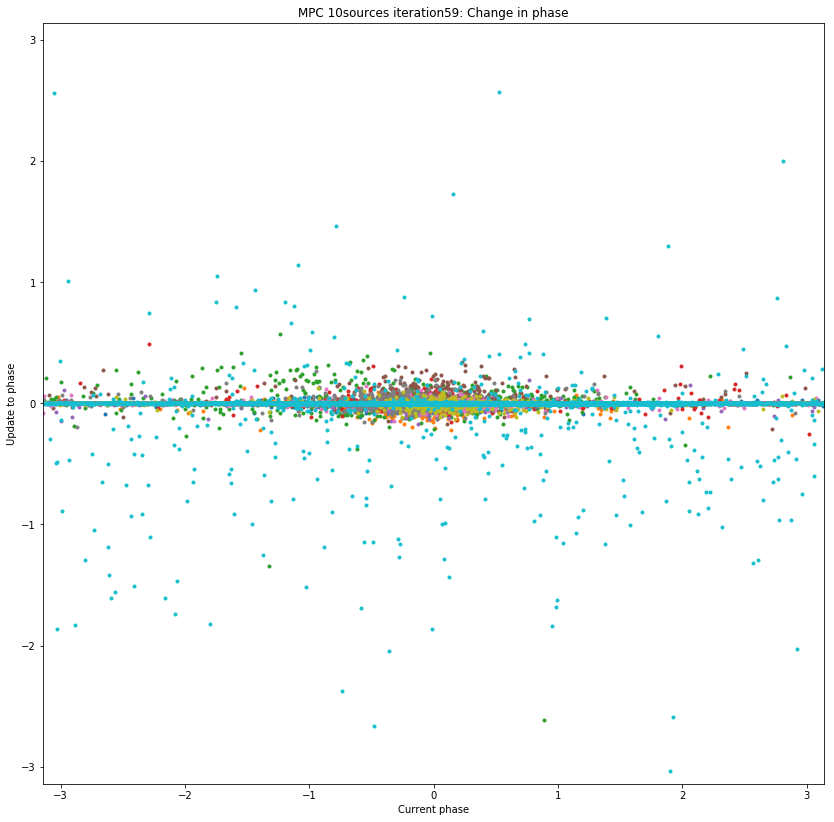

Iteration 60
arlexecute.compute: Execution using Dask took 38.223 seconds
arlexecute.compute: Execution using Dask took 33.699 seconds
arlexecute.compute: Execution using Dask took 36.479 seconds
0 0.0638085967501648
1 0.057068034460067134
2 0.05882464065983235
3 0.025895180502269133
4 0.025593346662267116
5 0.052733599615503196
6 0.046587637218655234
7 0.06365806834099141
8 0.049796215300694606
9 0.05016527052726247
Peak residual : 0.0638085967501648
arlexecute.compute: Execution using Dask took 7.299 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026306957301329673'
		min: '-0.002627002585410935'
		rms: '1.1122581935284115e-06'
		sum: '-0.004858992465493378'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.180 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019524722458728837'
		min: '-3.3608579843871744e-05'
		rms: 

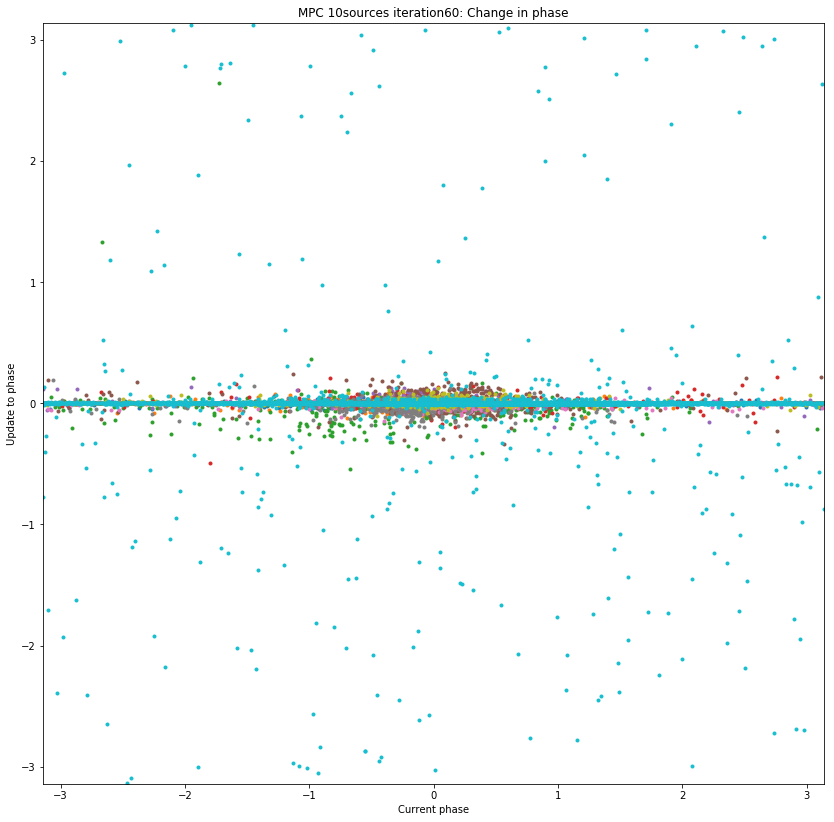

Iteration 61
arlexecute.compute: Execution using Dask took 37.979 seconds
arlexecute.compute: Execution using Dask took 33.795 seconds
arlexecute.compute: Execution using Dask took 36.260 seconds
0 0.06324828947047884
1 0.05727902133315782
2 0.05631453903084929
3 0.025724538355590167
4 0.025947713564301388
5 0.05276700636177715
6 0.04830531189231638
7 0.06080229028198468
8 0.04951837140500247
9 0.04902383371931185
Peak residual : 0.06324828947047884
arlexecute.compute: Execution using Dask took 7.536 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019033527449900036'
		min: '-0.002529576531857922'
		rms: '1.0254658982561797e-06'
		sum: '-0.007665385909911113'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.863 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0019516543619429714'
		rms: '8.267179267778418e-0

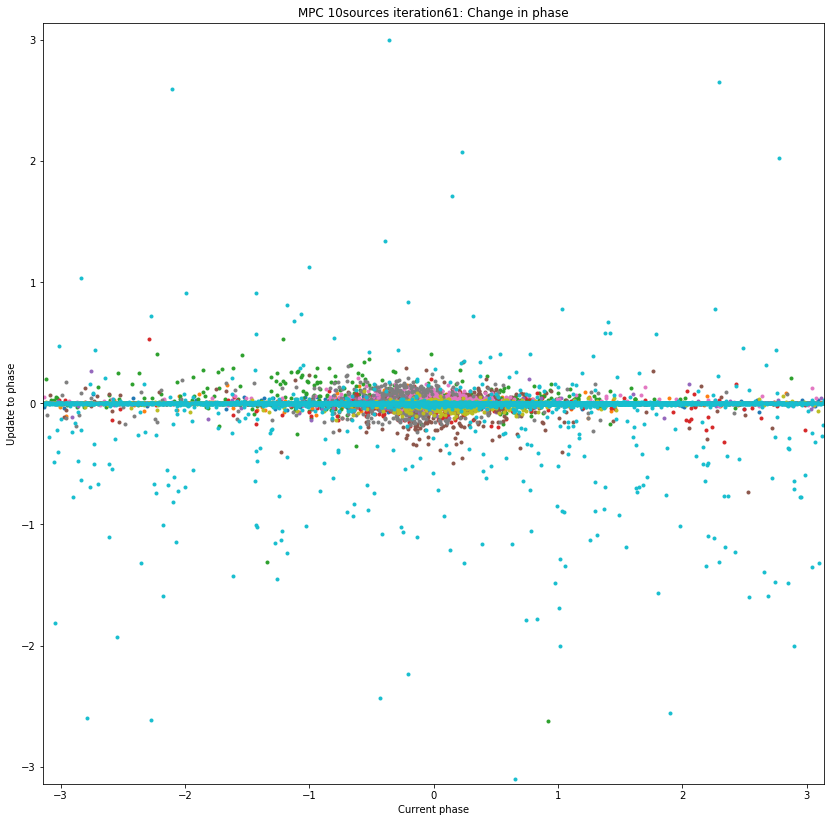

Iteration 62
arlexecute.compute: Execution using Dask took 37.931 seconds
arlexecute.compute: Execution using Dask took 33.669 seconds
arlexecute.compute: Execution using Dask took 36.369 seconds
0 0.06226692777000077
1 0.057377381944644826
2 0.05622906699874913
3 0.02624043240229043
4 0.02585944985234287
5 0.05257676398227225
6 0.0456044251480951
7 0.06222462807232003
8 0.049761400137472434
9 0.05270164246440528
Peak residual : 0.06226692777000077
arlexecute.compute: Execution using Dask took 7.455 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025612731157778554'
		min: '-0.00200361627153391'
		rms: '1.484421793042455e-06'
		sum: '0.004920833820071613'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.134 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026011447638713842'
		min: '-0.002600877895537309'
		rms: '1.86830

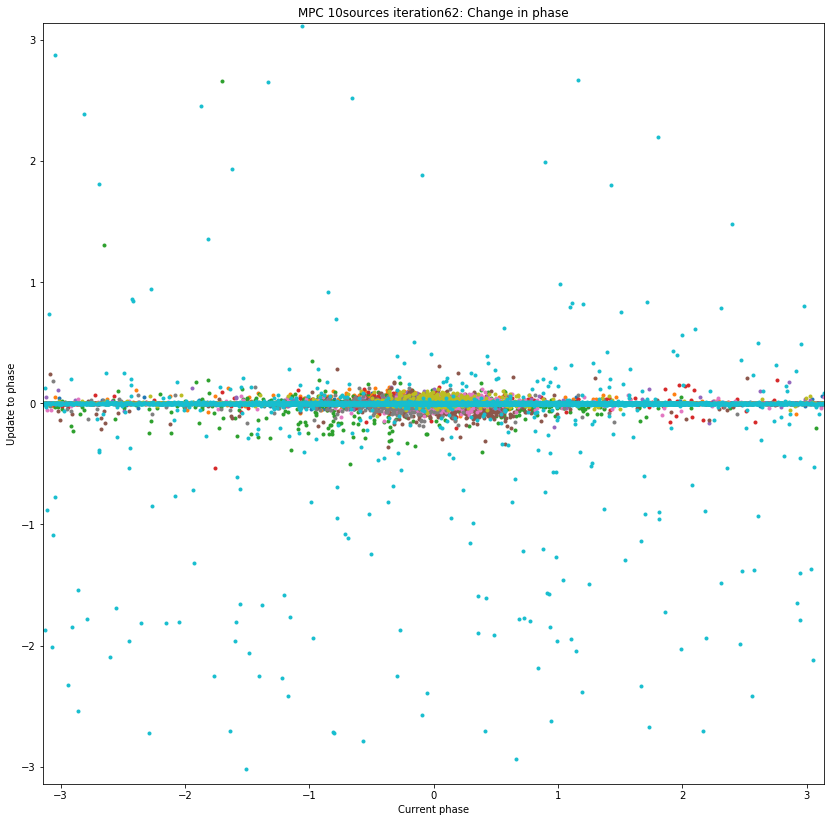

Iteration 63
arlexecute.compute: Execution using Dask took 38.042 seconds
arlexecute.compute: Execution using Dask took 33.787 seconds
arlexecute.compute: Execution using Dask took 36.934 seconds
0 0.062347987474732504
1 0.055487387763173655
2 0.05676917976877044
3 0.02646990626676465
4 0.02570578606351198
5 0.05343517391551039
6 0.04674501933692839
7 0.062212896694908905
8 0.050577750259338534
9 0.052580702597218545
Peak residual : 0.062347987474732504
arlexecute.compute: Execution using Dask took 7.111 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026260441027114003'
		min: '0.0'
		rms: '9.010672826427049e-07'
		sum: '0.005219437424551727'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.830 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0025798346204626223'
		rms: '7.922175607165288e-07'
		sum: '-0.00

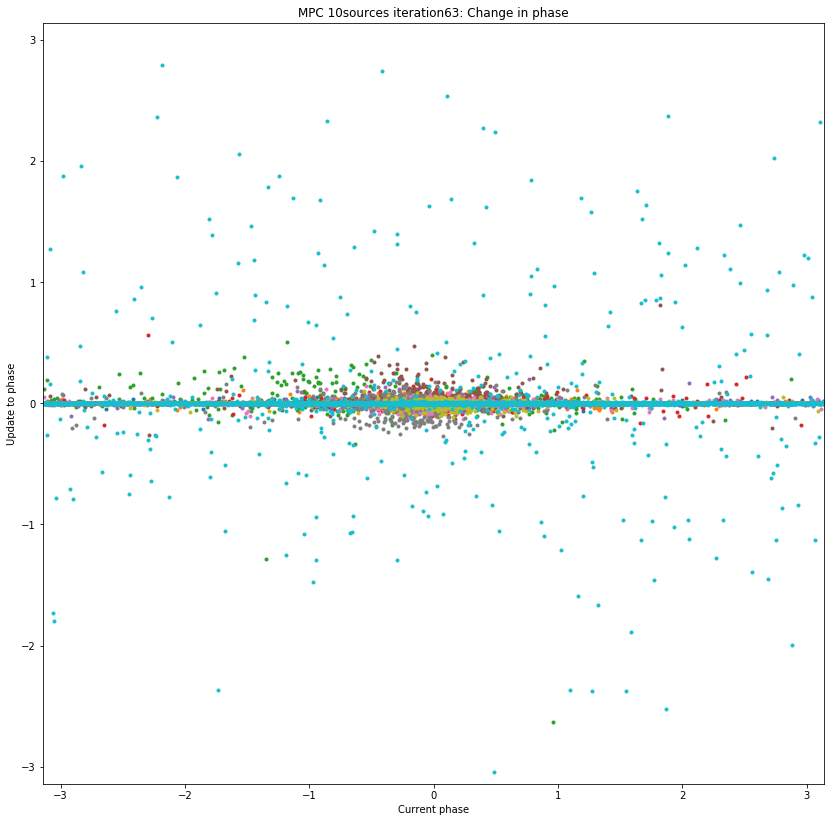

Iteration 64
arlexecute.compute: Execution using Dask took 38.007 seconds
arlexecute.compute: Execution using Dask took 33.885 seconds
arlexecute.compute: Execution using Dask took 36.845 seconds
0 0.06278107466770995
1 0.057297953879613624
2 0.05723261011024127
3 0.025347502034260925
4 0.02604170080942443
5 0.053872497992368686
6 0.04391913366732749
7 0.06136904842649979
8 0.04936675285717224
9 0.05009608525659916
Peak residual : 0.06278107466770995
arlexecute.compute: Execution using Dask took 7.481 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00018377215242630472'
		min: '-0.0026396569048135667'
		rms: '6.676812516569631e-07'
		sum: '-0.0026130563925377743'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.161 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019091811539175127'
		min: '-0.002553481309322272'
		rms: '

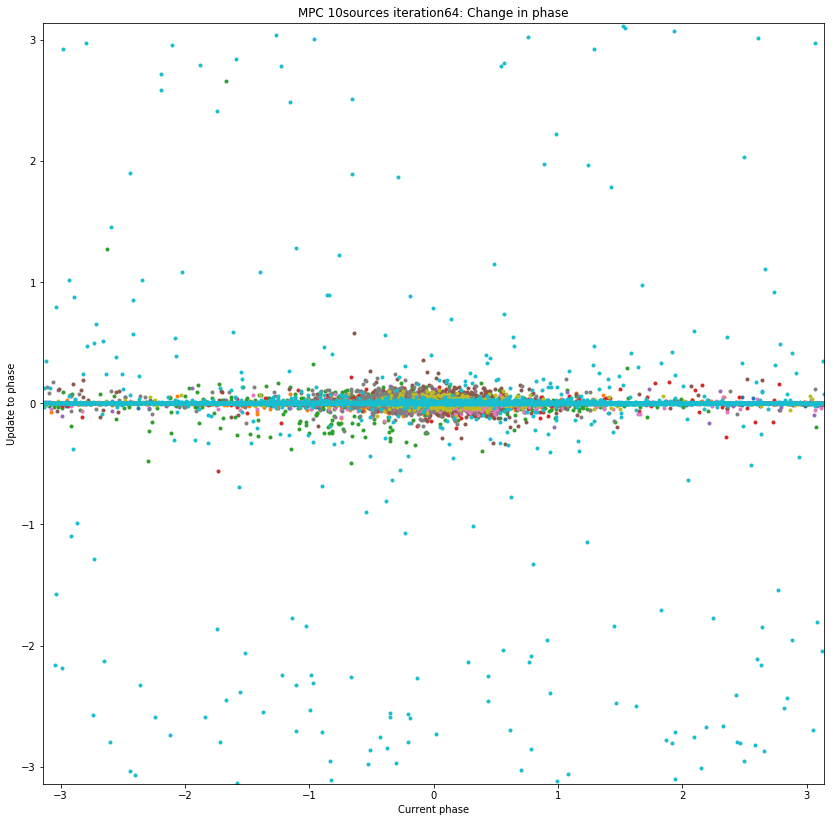

Iteration 65
arlexecute.compute: Execution using Dask took 38.209 seconds
arlexecute.compute: Execution using Dask took 33.579 seconds
arlexecute.compute: Execution using Dask took 36.864 seconds
0 0.06260438578005706
1 0.05631306903591009
2 0.0579351153653232
3 0.025854327094333482
4 0.02533698266026006
5 0.054431171804636615
6 0.04611808740333335
7 0.060454526193647606
8 0.05024667241581417
9 0.050710473536742726
Peak residual : 0.06260438578005706
arlexecute.compute: Execution using Dask took 7.151 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '0.0'
		rms: '0.0'
		sum: '0.0'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.208 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026097536898184582'
		min: '-0.002514569997907382'
		rms: '1.3959860634634878e-06'
		sum: '0.007755347045707243'
		medianabs: '0.0'
		

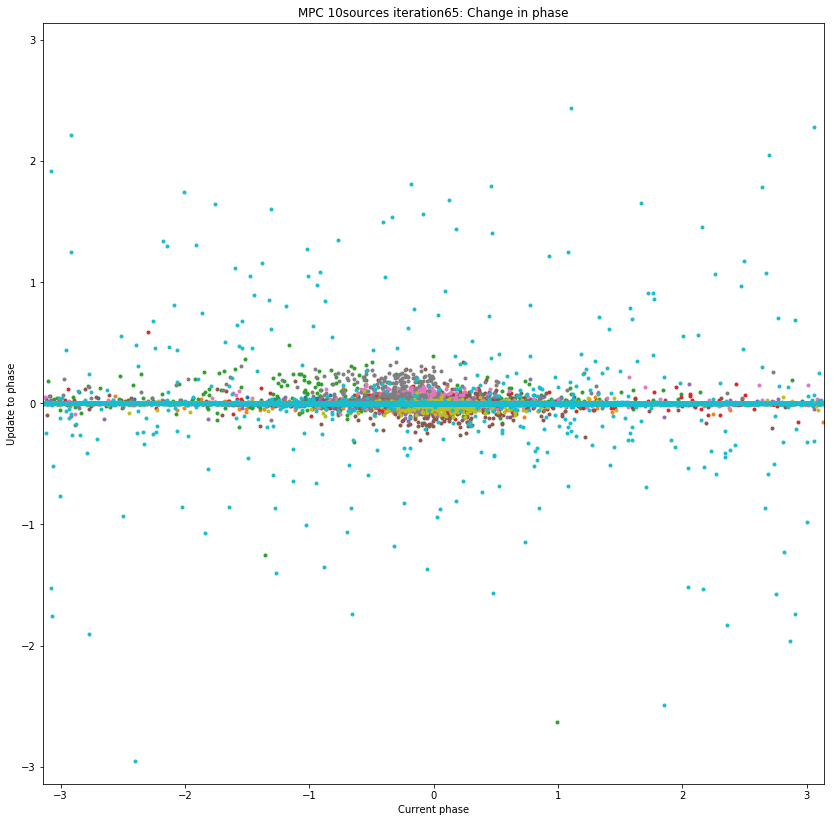

Iteration 66
arlexecute.compute: Execution using Dask took 37.893 seconds
arlexecute.compute: Execution using Dask took 33.823 seconds
arlexecute.compute: Execution using Dask took 36.547 seconds
0 0.06270905465194515
1 0.055386685082082804
2 0.0593406296344486
3 0.026156018296700563
4 0.02600289761650176
5 0.0541015185971103
6 0.04449115718372551
7 0.06133889398036433
8 0.04889639485044885
9 0.051488319976104105
Peak residual : 0.06270905465194515
arlexecute.compute: Execution using Dask took 7.374 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025363071564642025'
		min: '-0.0026251734124229775'
		rms: '1.223043205146255e-06'
		sum: '-4.52341912194152e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.774 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019011139953654169'
		min: '-0.002142490025030199'
		rms: '8.56

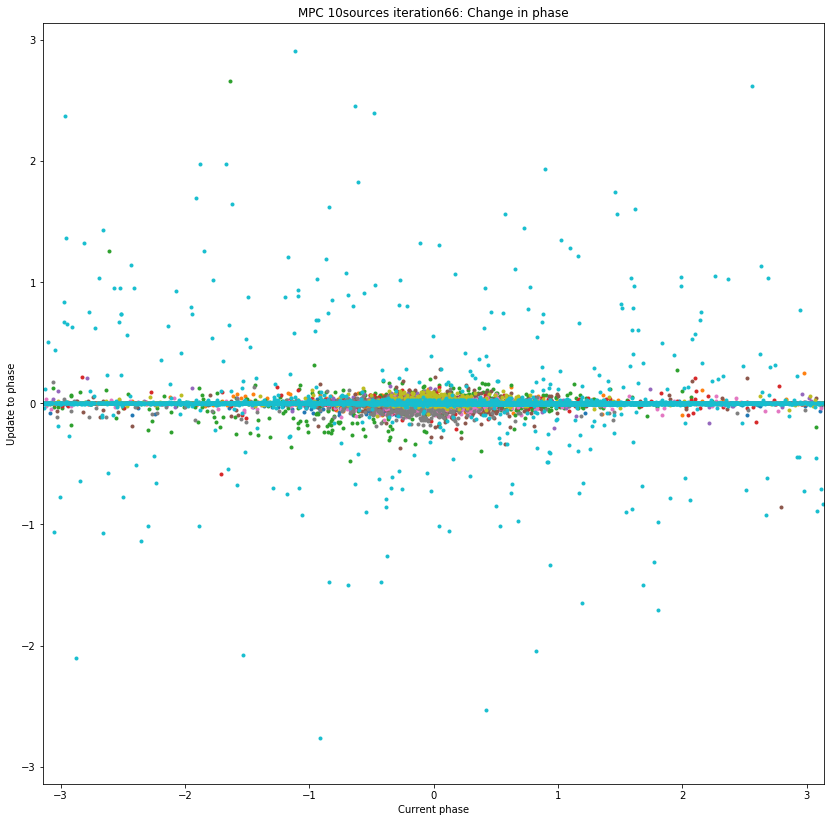

Iteration 67
arlexecute.compute: Execution using Dask took 38.260 seconds
arlexecute.compute: Execution using Dask took 34.167 seconds
arlexecute.compute: Execution using Dask took 36.530 seconds
0 0.0626257787373583
1 0.055123546318347774
2 0.06047747696931034
3 0.02613587915144648
4 0.025648606742825368
5 0.05533056497175876
6 0.04545686449998169
7 0.06097006654946529
8 0.05000878962409219
9 0.05214518231301225
Peak residual : 0.0626257787373583
arlexecute.compute: Execution using Dask took 7.702 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002611174853404803'
		min: '-0.0019071204667131325'
		rms: '7.931632525127274e-07'
		sum: '6.471679199171248e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.298 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025478061768978103'
		min: '-0.0026300902622828325'
		rms: '1.282

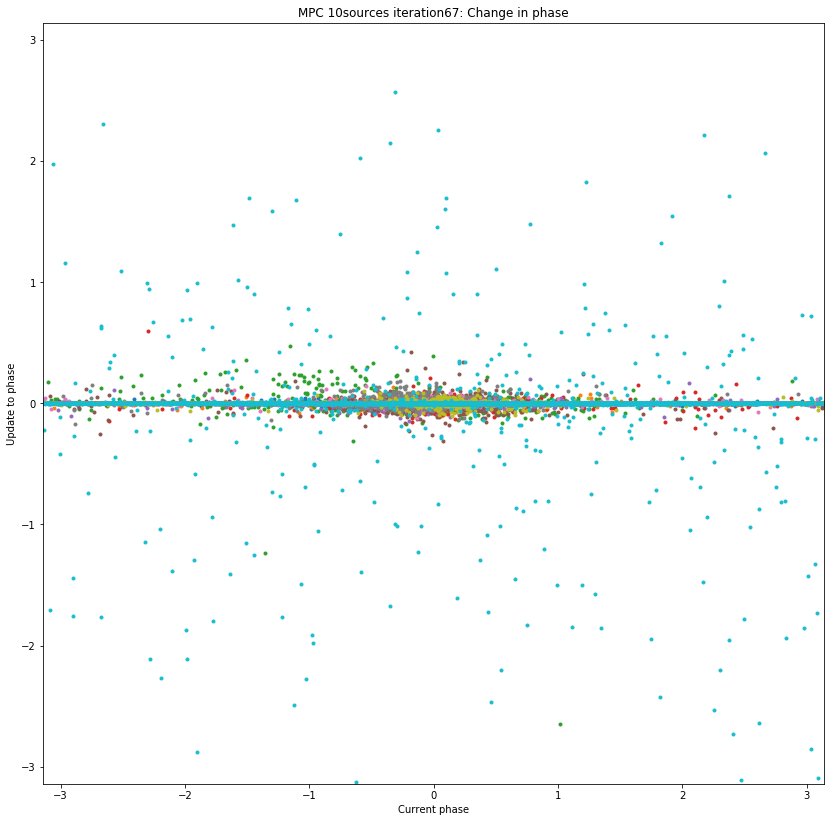

Iteration 68
arlexecute.compute: Execution using Dask took 37.809 seconds
arlexecute.compute: Execution using Dask took 33.678 seconds
arlexecute.compute: Execution using Dask took 36.444 seconds
0 0.06218641948569294
1 0.05540104568444629
2 0.0593950598121581
3 0.025608777860194512
4 0.025840355569859565
5 0.05387709490485622
6 0.04454658008162895
7 0.06320560722488562
8 0.0486027621354581
9 0.0522357084346509
Peak residual : 0.06320560722488562
arlexecute.compute: Execution using Dask took 7.341 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00254392819704208'
		min: '-0.0002813678788005966'
		rms: '7.955558741316933e-07'
		sum: '0.002085954396942519'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.893 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025689618264756633'
		min: '-0.0001864067658276534'
		rms: '7.955591

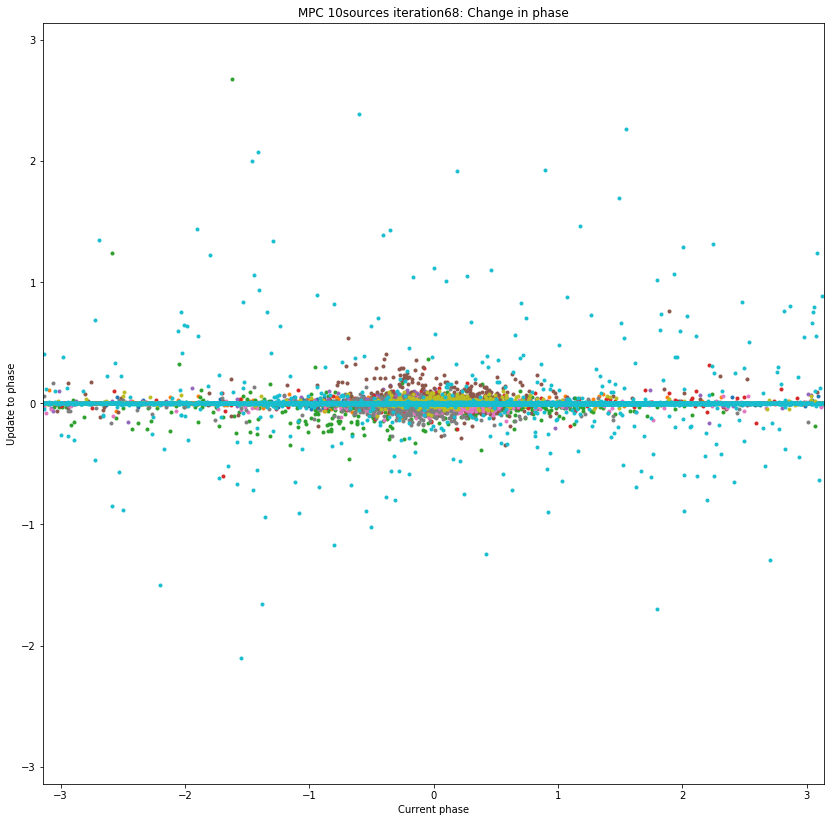

Iteration 69
arlexecute.compute: Execution using Dask took 38.264 seconds
arlexecute.compute: Execution using Dask took 33.695 seconds
arlexecute.compute: Execution using Dask took 36.488 seconds
0 0.06269099702051605
1 0.05610102329199694
2 0.05704972283249171
3 0.025776487013421827
4 0.025441135877245252
5 0.0543895949791959
6 0.045180791974884775
7 0.06113227642029534
8 0.04863781892048541
9 0.05148026578499216
Peak residual : 0.06269099702051605
arlexecute.compute: Execution using Dask took 7.718 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0019364122205863896'
		rms: '7.076919015397228e-07'
		sum: '-0.013074247577049102'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.924 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025664670634503338'
		min: '-0.002565168210330397'
		rms: '1.183453967392207e-06

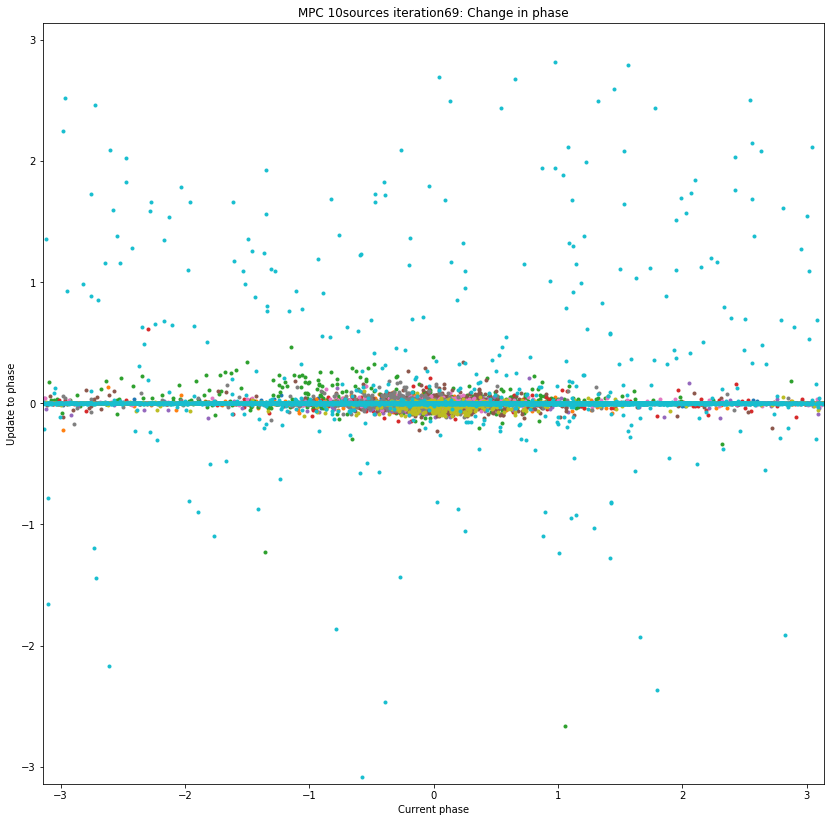

Iteration 70
arlexecute.compute: Execution using Dask took 37.760 seconds
arlexecute.compute: Execution using Dask took 33.863 seconds
arlexecute.compute: Execution using Dask took 36.718 seconds
0 0.06447662439206527
1 0.05571674436181495
2 0.05632526285507358
3 0.0265149175355346
4 0.02582479961125532
5 0.052941245294641386
6 0.04378123516075327
7 0.062278858903848634
8 0.049091980556346525
9 0.05143299957449906
Peak residual : 0.06447662439206527
arlexecute.compute: Execution using Dask took 7.410 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019412688122592448'
		min: '0.0'
		rms: '4.803711553531753e-07'
		sum: '0.0025920542003658054'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.058 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '0.0'
		rms: '0.0'
		sum: '0.0'
		medianabs: '0.0'
		median: '0.0'

arle

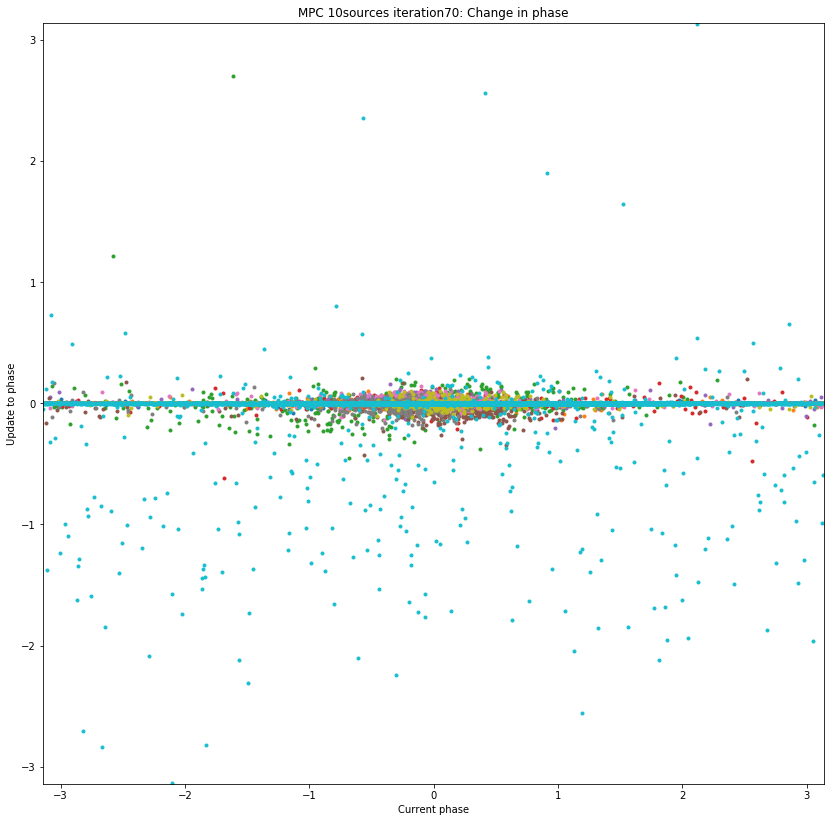

Iteration 71
arlexecute.compute: Execution using Dask took 38.378 seconds
arlexecute.compute: Execution using Dask took 33.853 seconds
arlexecute.compute: Execution using Dask took 36.343 seconds
0 0.06335566183922256
1 0.05588912958966022
2 0.05674929655908391
3 0.026151748004025616
4 0.025666174929021388
5 0.052838740612429186
6 0.04491621007038611
7 0.06253679692684849
8 0.04903060911527475
9 0.05056283339901306
Peak residual : 0.06335566183922256
arlexecute.compute: Execution using Dask took 7.248 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019802706272171117'
		min: '-0.00040841669282994103'
		rms: '5.155891044297328e-07'
		sum: '-0.0005612972055402777'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.180 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-2.3529400897288942e-05'
		rms: '5.74448246974092

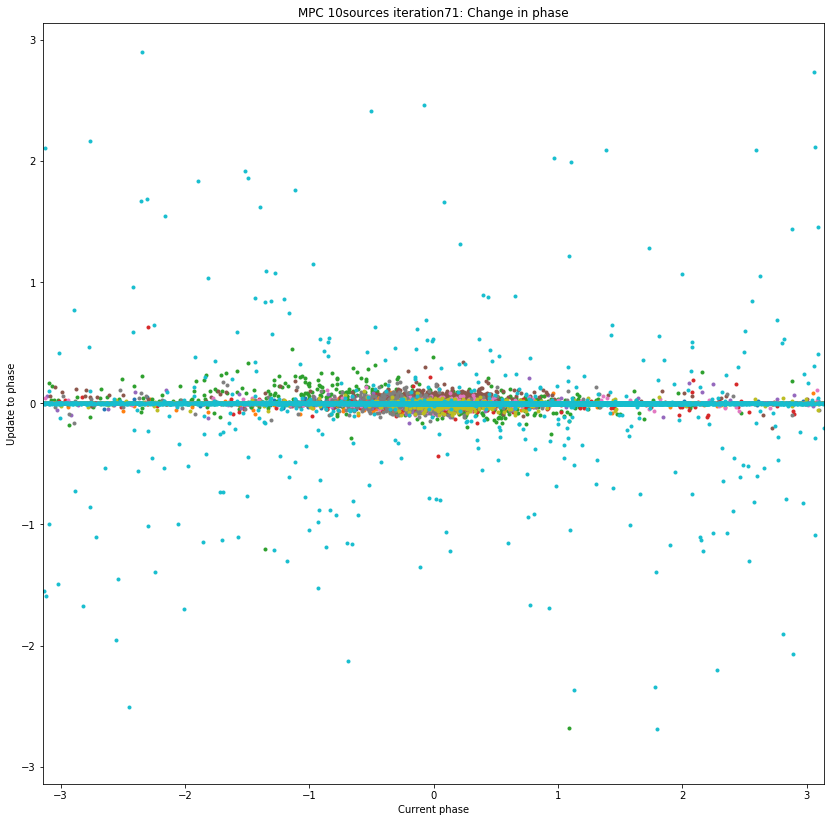

Iteration 72
arlexecute.compute: Execution using Dask took 37.873 seconds
arlexecute.compute: Execution using Dask took 33.776 seconds
arlexecute.compute: Execution using Dask took 36.688 seconds
0 0.061440021410951194
1 0.05589666635218674
2 0.05721852071560177
3 0.025651783297071157
4 0.025819525374902903
5 0.05338906106069503
6 0.044127510441443536
7 0.06318218436768194
8 0.05052165616138753
9 0.05016853814879025
Peak residual : 0.06318218436768194
arlexecute.compute: Execution using Dask took 7.029 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019005476794378097'
		min: '-0.002414969243957516'
		rms: '9.53246101789307e-07'
		sum: '-0.004959137755457447'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.803 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.002123667056722076'
		rms: '5.185074182835462e-07

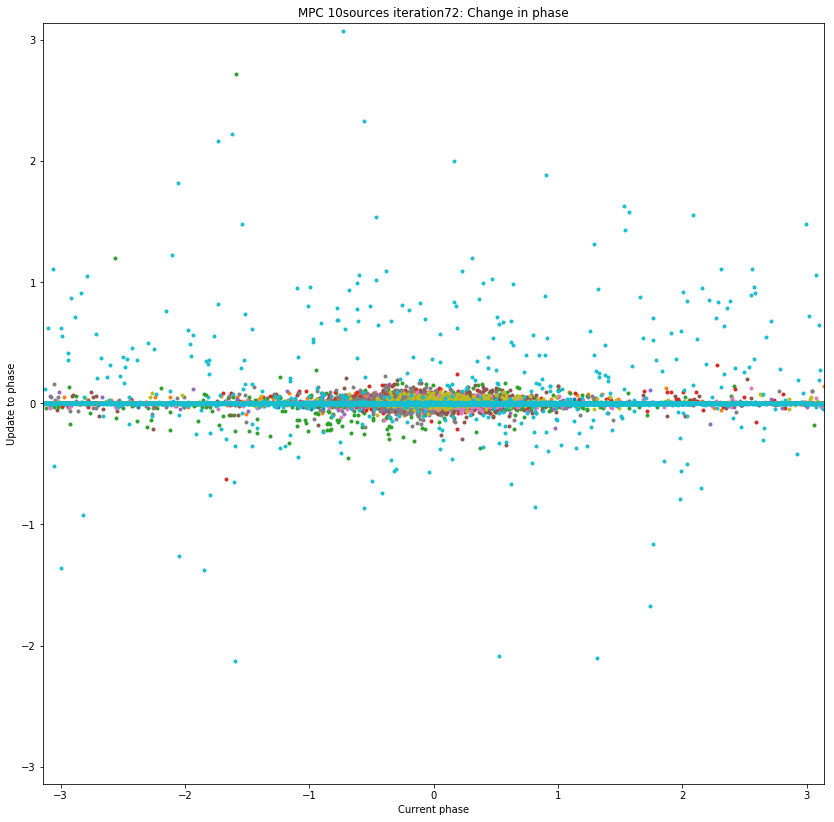

Iteration 73
arlexecute.compute: Execution using Dask took 38.189 seconds
arlexecute.compute: Execution using Dask took 33.648 seconds
arlexecute.compute: Execution using Dask took 36.277 seconds
0 0.061175522274882564
1 0.0563358487818336
2 0.05769607468905759
3 0.025960672676666924
4 0.02597221688675523
5 0.0539997889924378
6 0.04550686739411764
7 0.06157166142269281
8 0.051208708562791125
9 0.04861872315677429
Peak residual : 0.06157166142269281
arlexecute.compute: Execution using Dask took 7.353 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001913044851830271'
		min: '-0.0026075904368418248'
		rms: '1.0672800181367023e-06'
		sum: '0.002339437494503926'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.315 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002589297234960483'
		min: '-0.00018350846252122936'
		rms: '6.78

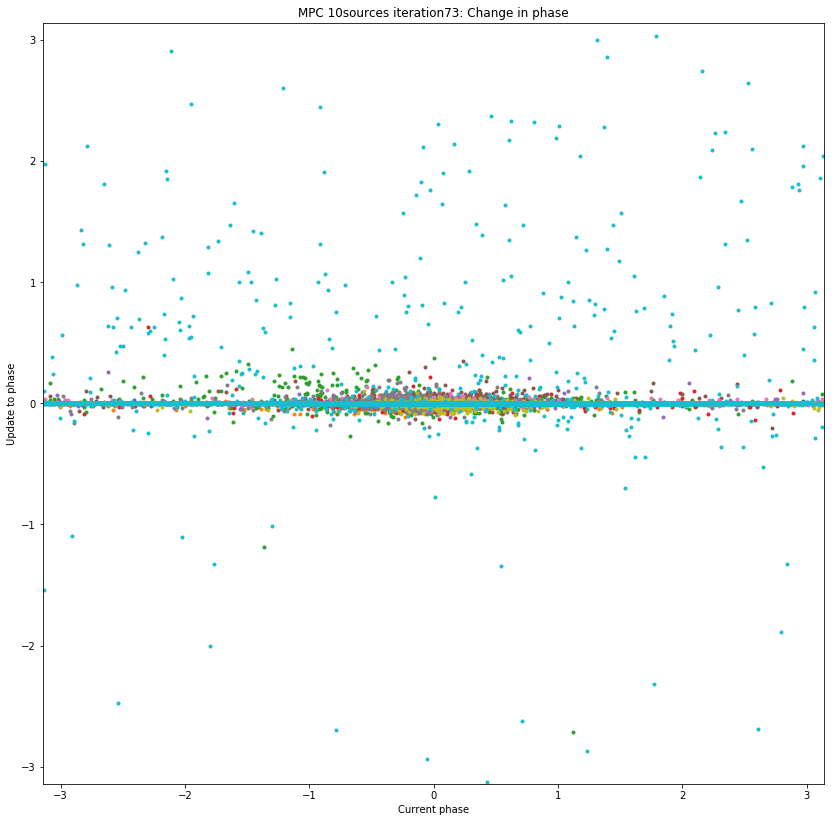

Iteration 74
arlexecute.compute: Execution using Dask took 37.698 seconds
arlexecute.compute: Execution using Dask took 33.737 seconds
arlexecute.compute: Execution using Dask took 36.274 seconds
0 0.06135211519324897
1 0.05420014773824913
2 0.05714565938659791
3 0.02532559444748278
4 0.025998029194951307
5 0.053684284527858006
6 0.04555671792784967
7 0.06245572465192645
8 0.04875658847997943
9 0.0510331153562241
Peak residual : 0.06245572465192645
arlexecute.compute: Execution using Dask took 7.521 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0023726129803279448'
		min: '-0.002472566573057073'
		rms: '1.0862700337446598e-06'
		sum: '0.0010189360677734128'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.981 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001900595014055638'
		min: '-0.0025886455073064352'
		rms: '1.04

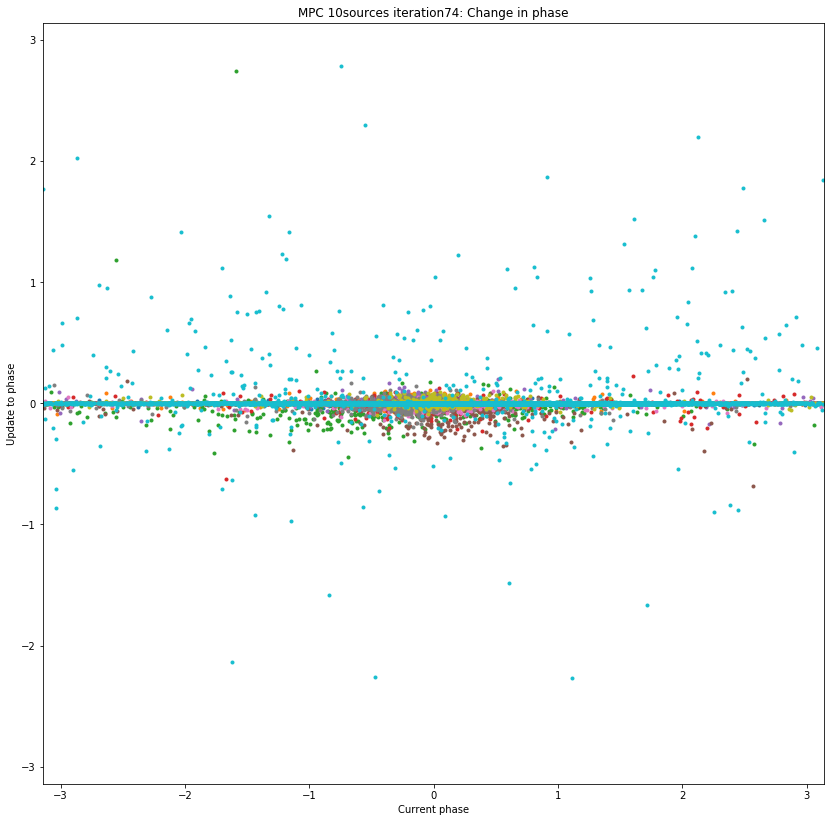

Iteration 75
arlexecute.compute: Execution using Dask took 37.963 seconds
arlexecute.compute: Execution using Dask took 33.706 seconds
arlexecute.compute: Execution using Dask took 36.218 seconds
0 0.062336034599427236
1 0.05599159287063091
2 0.058101801398546406
3 0.025350242785856257
4 0.025109456689567603
5 0.05328664095239432
6 0.04769806749856951
7 0.061577125461488524
8 0.05093601930596052
9 0.05125317549277664
Peak residual : 0.062336034599427236
arlexecute.compute: Execution using Dask took 7.289 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002571610262831982'
		min: '-4.914192810590947e-05'
		rms: '8.059326582298116e-07'
		sum: '0.010409254100268682'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.145 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00257774327307261'
		min: '-0.00018459779348983611'
		rms: '6

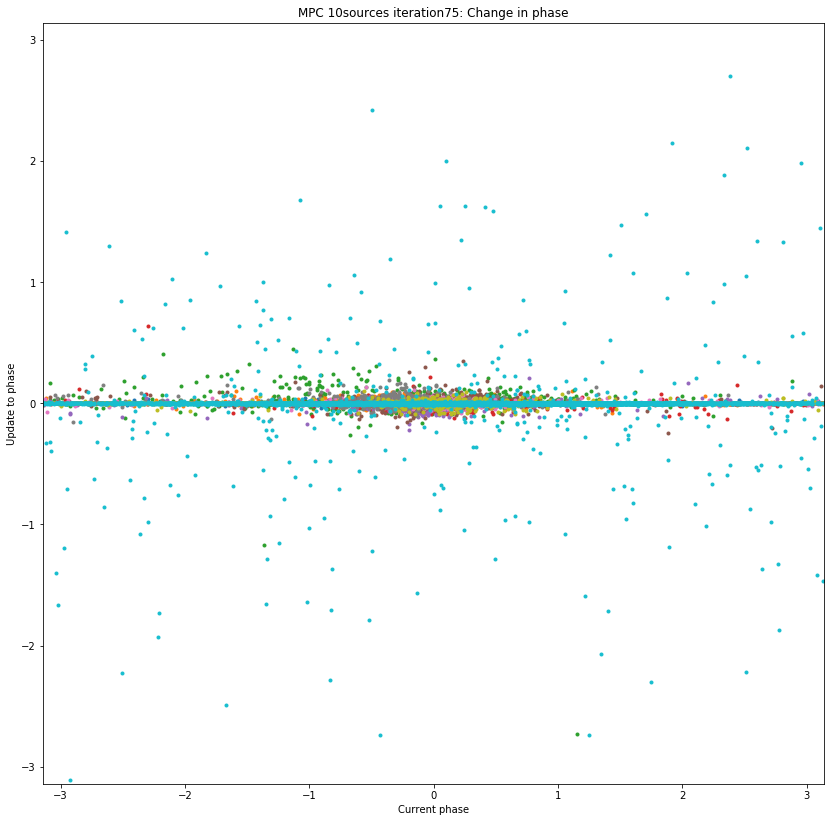

Iteration 76
arlexecute.compute: Execution using Dask took 37.375 seconds
arlexecute.compute: Execution using Dask took 33.823 seconds
arlexecute.compute: Execution using Dask took 36.410 seconds
0 0.06123729893257185
1 0.05594930138237931
2 0.05577483857918014
3 0.026161589230566655
4 0.025338670668888147
5 0.05197981216048463
6 0.045913215415403476
7 0.06301070917658969
8 0.050536013295594116
9 0.053259557591918326
Peak residual : 0.06301070917658969
arlexecute.compute: Execution using Dask took 7.126 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0019868956051506243'
		rms: '6.903783283373302e-07'
		sum: '-0.005319092245678314'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.247 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002625060100033398'
		min: '-0.0025466837795316347'
		rms: '1.3410387682664266

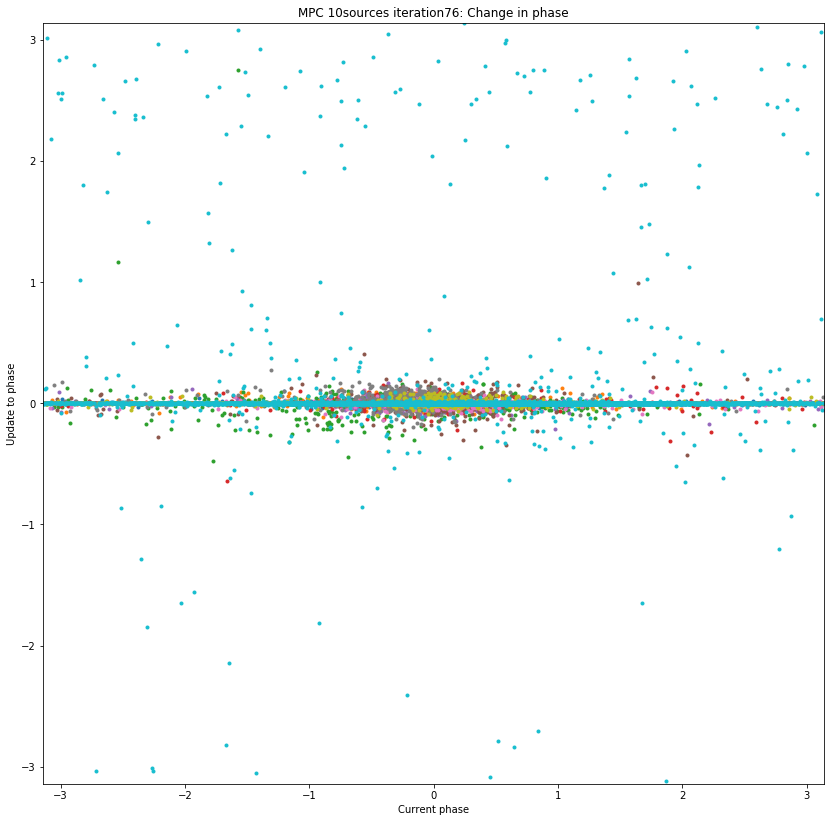

Iteration 77
arlexecute.compute: Execution using Dask took 37.723 seconds
arlexecute.compute: Execution using Dask took 33.879 seconds
arlexecute.compute: Execution using Dask took 36.204 seconds
0 0.06129185842701784
1 0.05573873069656196
2 0.05790314490259401
3 0.025789821851716445
4 0.025790867813206338
5 0.05292739874062895
6 0.0480107328213775
7 0.06067638073791855
8 0.050869156766666056
9 0.05119621100298945
Peak residual : 0.06129185842701784
arlexecute.compute: Execution using Dask took 7.252 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001941268582407564'
		min: '-0.0018961011381138947'
		rms: '8.487662693118509e-07'
		sum: '6.246414955988384e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.823 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001644724651775948'
		min: '-0.002572912773026837'
		rms: '1.015

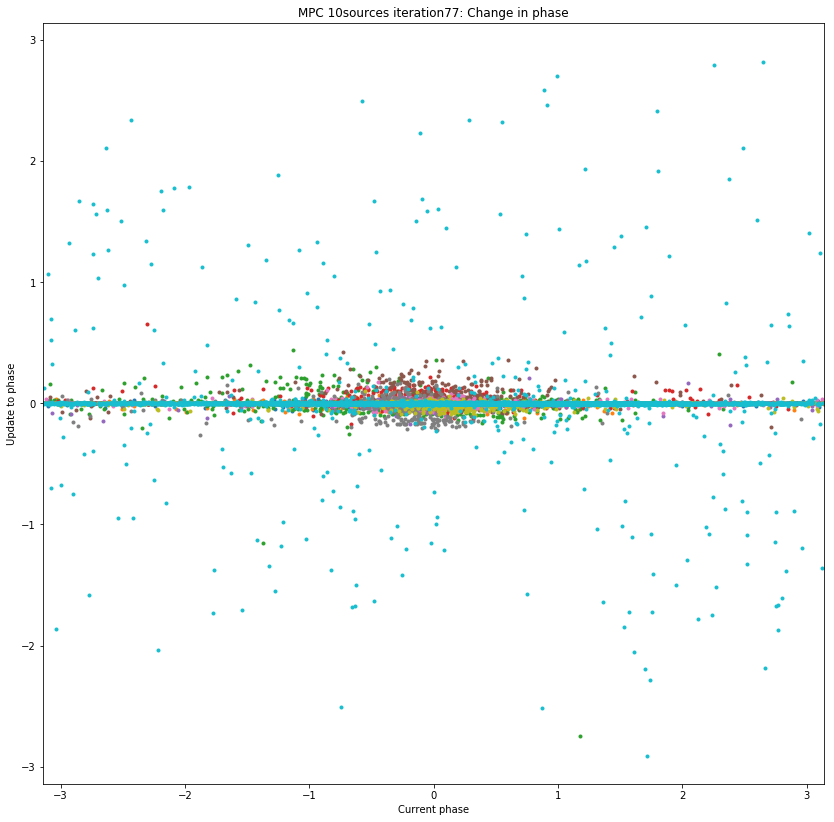

Iteration 78
arlexecute.compute: Execution using Dask took 38.312 seconds
arlexecute.compute: Execution using Dask took 33.878 seconds
arlexecute.compute: Execution using Dask took 36.424 seconds
0 0.06030041740048287
1 0.0563185358373746
2 0.05821618999839749
3 0.02515124393979573
4 0.025664129955096936
5 0.05455598146721559
6 0.04644529884231892
7 0.05965179028214999
8 0.05072658438916408
9 0.05253818857572434
Peak residual : 0.06030041740048287
arlexecute.compute: Execution using Dask took 7.317 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025567737731561568'
		min: '-0.0025547211801450922'
		rms: '1.9877964985448845e-06'
		sum: '-0.015160509062058151'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.986 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002640612877313636'
		min: '-0.002542169990803418'
		rms: '1.429

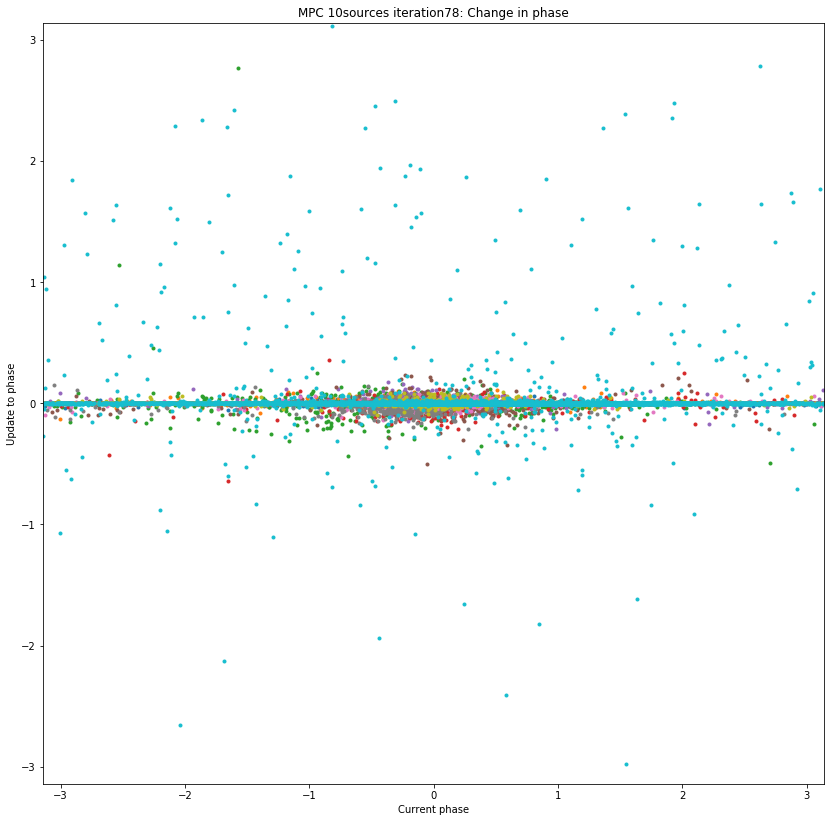

Iteration 79
arlexecute.compute: Execution using Dask took 38.162 seconds
arlexecute.compute: Execution using Dask took 33.633 seconds
arlexecute.compute: Execution using Dask took 36.192 seconds
0 0.05998335467328594
1 0.05461373556088882
2 0.057784235735006635
3 0.025106245655865694
4 0.025516823778724263
5 0.05407042624842558
6 0.047642623888613796
7 0.05940146780813915
8 0.051562924424519124
9 0.05058397107841832
Peak residual : 0.05998335467328594
arlexecute.compute: Execution using Dask took 7.366 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019457236814381818'
		min: '-0.0025300966330300823'
		rms: '1.3237597618759076e-06'
		sum: '-0.00260043441689091'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.768 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.001922688296288787'
		min: '-0.002586336796803516'
		rms: '9

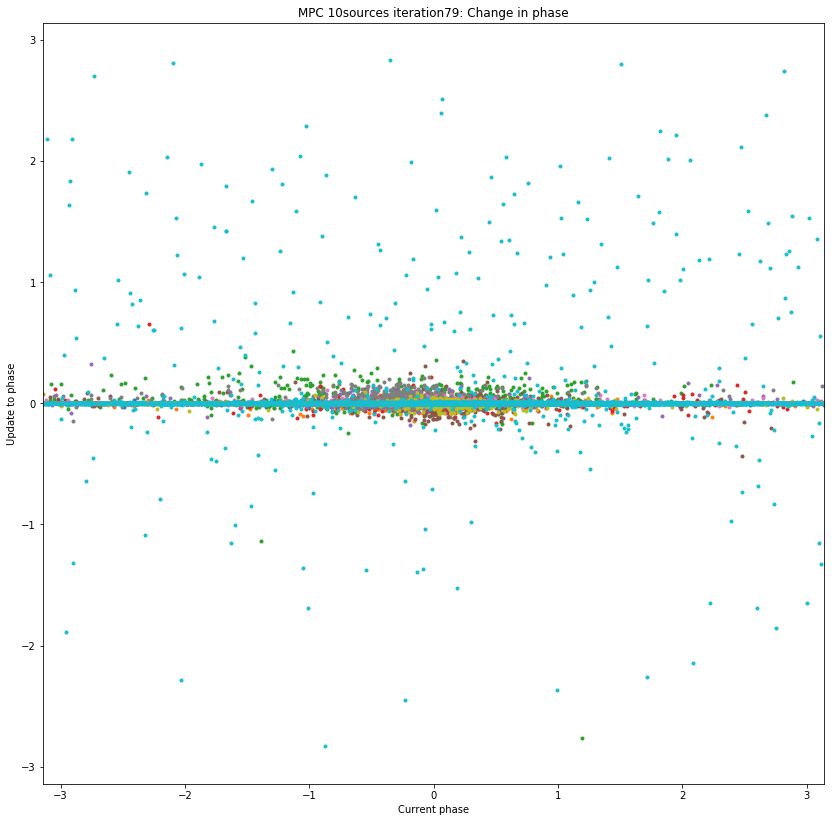

Iteration 80
arlexecute.compute: Execution using Dask took 38.417 seconds
arlexecute.compute: Execution using Dask took 33.673 seconds
arlexecute.compute: Execution using Dask took 36.443 seconds
0 0.058122810201028836
1 0.05387425292524551
2 0.054755657347016276
3 0.024787518824569522
4 0.025311367721200823
5 0.052995262473396185
6 0.0466772404107515
7 0.06239936085013856
8 0.05011666257702283
9 0.05041876919767676
Peak residual : 0.06239936085013856
arlexecute.compute: Execution using Dask took 7.151 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0023337885182727835'
		min: '-0.0026405837115297936'
		rms: '9.997409493645318e-07'
		sum: '-0.0035968140590880954'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.456 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025262109475463353'
		min: '-0.002547704525399491'
		rms: '

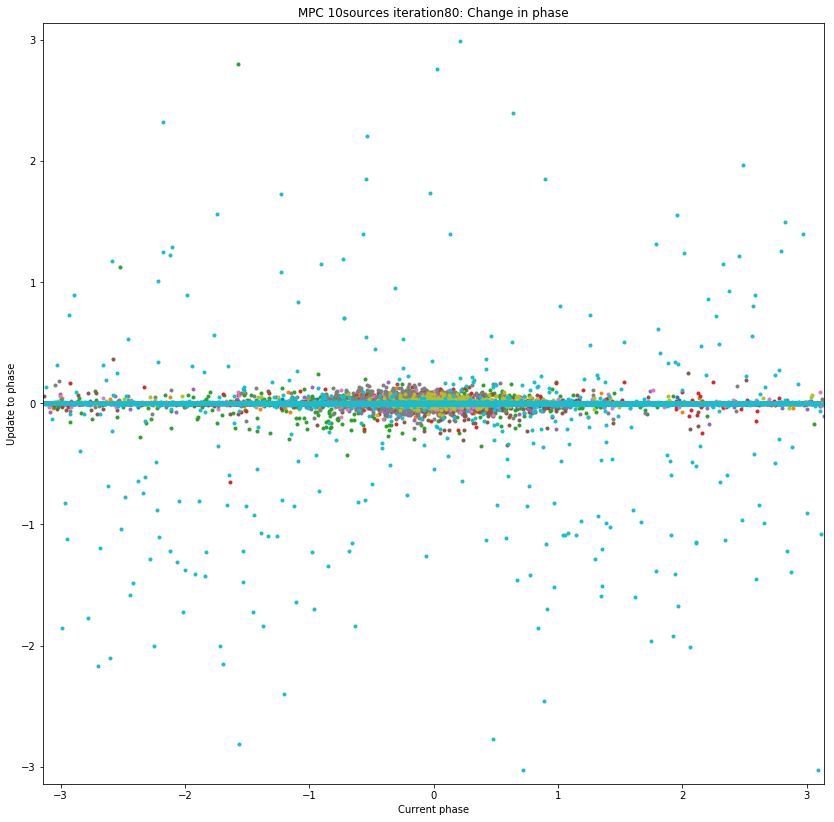

Iteration 81
arlexecute.compute: Execution using Dask took 37.674 seconds
arlexecute.compute: Execution using Dask took 33.673 seconds
arlexecute.compute: Execution using Dask took 36.489 seconds
0 0.05888816612907566
1 0.05630207374981042
2 0.05738425575372482
3 0.026401614373594604
4 0.025987393044131224
5 0.05225212791954886
6 0.04585376324183045
7 0.06329371043312877
8 0.04923037373705656
9 0.04904136299460812
Peak residual : 0.06329371043312877
arlexecute.compute: Execution using Dask took 7.455 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0024633728605078947'
		rms: '7.578225456029707e-07'
		sum: '-0.0049513744159824175'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.105 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025845286066633836'
		min: '-0.002690559479367801'
		rms: '1.0203475261011802e-

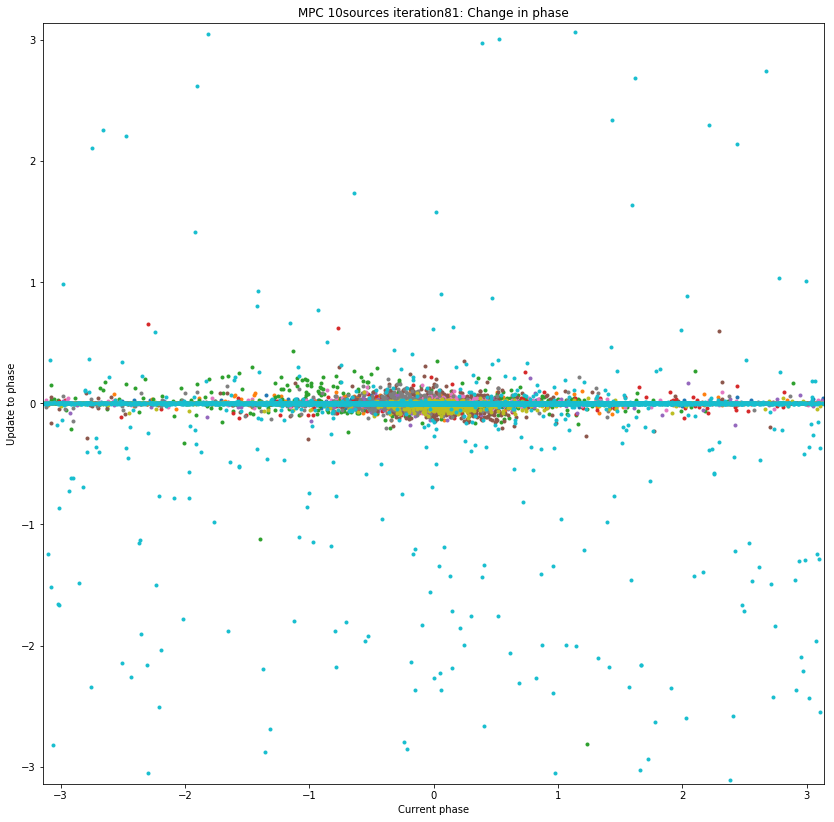

Iteration 82
arlexecute.compute: Execution using Dask took 37.878 seconds
arlexecute.compute: Execution using Dask took 33.529 seconds
arlexecute.compute: Execution using Dask took 36.852 seconds
0 0.06143024512557385
1 0.05520634960362414
2 0.05736867499788161
3 0.025475128534776497
4 0.025655114915466546
5 0.05297569674408241
6 0.04408130944070177
7 0.06308926674123637
8 0.05046931267445732
9 0.051238311034385274
Peak residual : 0.06308926674123637
arlexecute.compute: Execution using Dask took 7.093 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019159568372009524'
		min: '-0.002591410466443026'
		rms: '1.1670540946290568e-06'
		sum: '-0.0018496508862244074'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.333 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0024940498587594884'
		min: '-0.002614057481058678'
		rms: '1

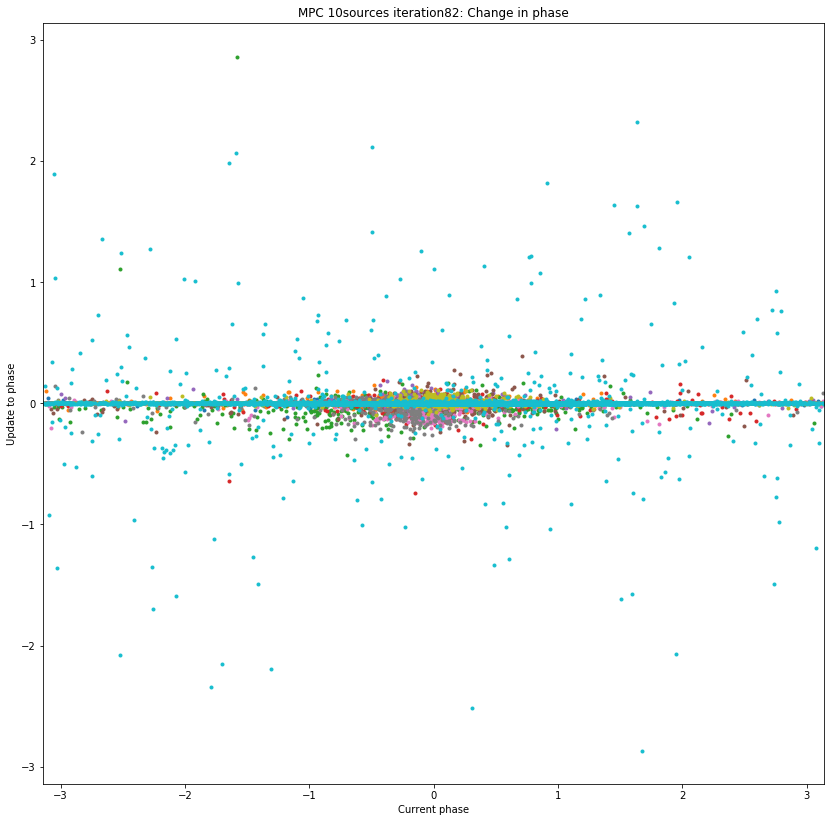

Iteration 83
arlexecute.compute: Execution using Dask took 37.752 seconds
arlexecute.compute: Execution using Dask took 33.855 seconds
arlexecute.compute: Execution using Dask took 36.361 seconds
0 0.06121115123988629
1 0.05585215265865657
2 0.056783230404043164
3 0.02575598129696295
4 0.02636233612550303
5 0.05318753602372305
6 0.04457361555074326
7 0.06239383057321031
8 0.04924994681049326
9 0.05303609359865546
Peak residual : 0.06239383057321031
arlexecute.compute: Execution using Dask took 7.231 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0003840560787424616'
		rms: '2.663956280854315e-07'
		sum: '-0.01114946767258417'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.048 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00018186395664702558'
		min: '0.0'
		rms: '1.227941966009841e-07'
		sum: '0.0026244

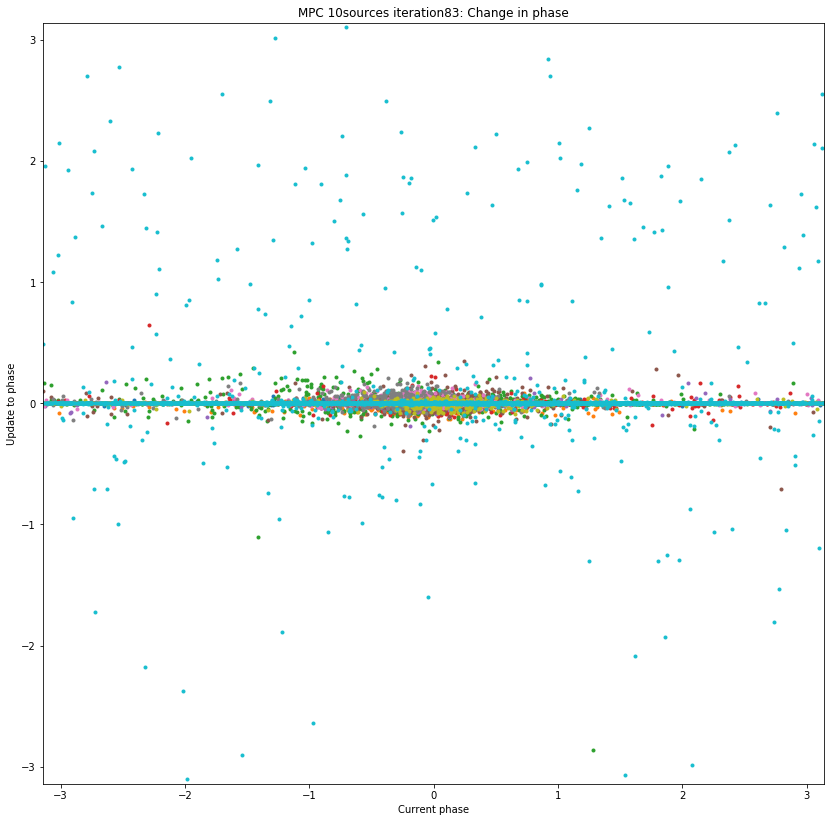

Iteration 84
arlexecute.compute: Execution using Dask took 38.462 seconds
arlexecute.compute: Execution using Dask took 33.905 seconds
arlexecute.compute: Execution using Dask took 36.833 seconds
0 0.0613505449927219
1 0.05623721067739341
2 0.056296367924370136
3 0.026054267605617923
4 0.025799074852745064
5 0.052423936152539194
6 0.04288308564396341
7 0.061500180747962235
8 0.04849356863936612
9 0.05386596370265537
Peak residual : 0.061500180747962235
arlexecute.compute: Execution using Dask took 7.447 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025719112663965403'
		min: '0.0'
		rms: '8.062626270697891e-07'
		sum: '0.01526958908678727'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.513 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00198188735742693'
		min: '-0.0025925512645145494'
		rms: '1.058415178601643e-06'

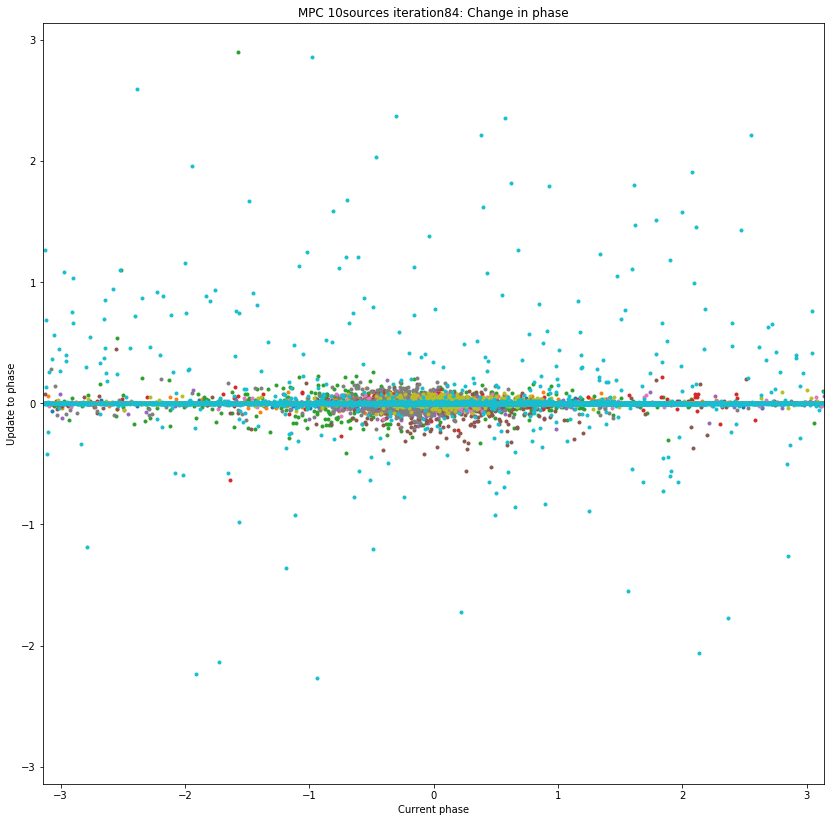

Iteration 85
arlexecute.compute: Execution using Dask took 38.037 seconds
arlexecute.compute: Execution using Dask took 33.651 seconds
arlexecute.compute: Execution using Dask took 36.879 seconds
0 0.060864647346866724
1 0.0552195890512913
2 0.05847960279693271
3 0.025286594216637127
4 0.025917736605134477
5 0.05342014696883427
6 0.044012947236116526
7 0.06200846030905148
8 0.050354931003731396
9 0.051605295732775815
Peak residual : 0.06200846030905148
arlexecute.compute: Execution using Dask took 7.511 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0001824836087226615'
		min: '-0.00018158771127760204'
		rms: '2.447906338163497e-07'
		sum: '-7.330123043155169e-06'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.113 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0001860984459401711'
		min: '-0.002586310243955524'
		rms:

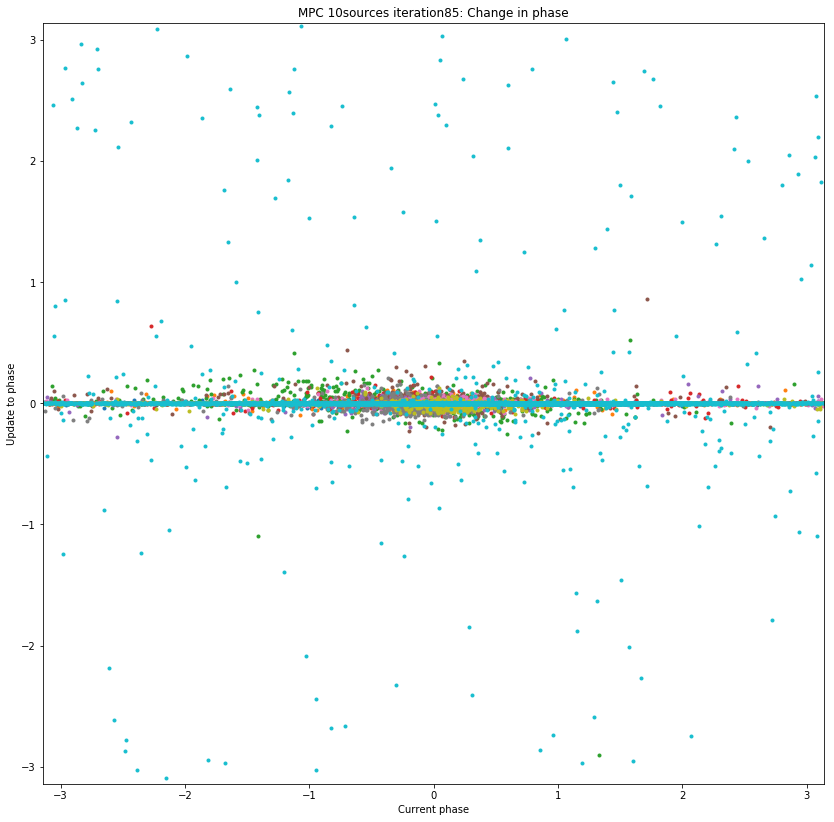

Iteration 86
arlexecute.compute: Execution using Dask took 38.088 seconds
arlexecute.compute: Execution using Dask took 33.755 seconds
arlexecute.compute: Execution using Dask took 36.811 seconds
0 0.060911793249263324
1 0.055093831929472085
2 0.059203527305746864
3 0.02513877032799862
4 0.0258964495544177
5 0.05418175076716599
6 0.041782565474282156
7 0.062207171420782456
8 0.04882559953914071
9 0.052516924648214794
Peak residual : 0.062207171420782456
arlexecute.compute: Execution using Dask took 7.278 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019783636049891494'
		min: '-0.0025622926310771166'
		rms: '8.040389079649799e-07'
		sum: '-0.002581050182965435'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.297 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019033539889391042'
		min: '-0.0025575899296015865'
		rms:

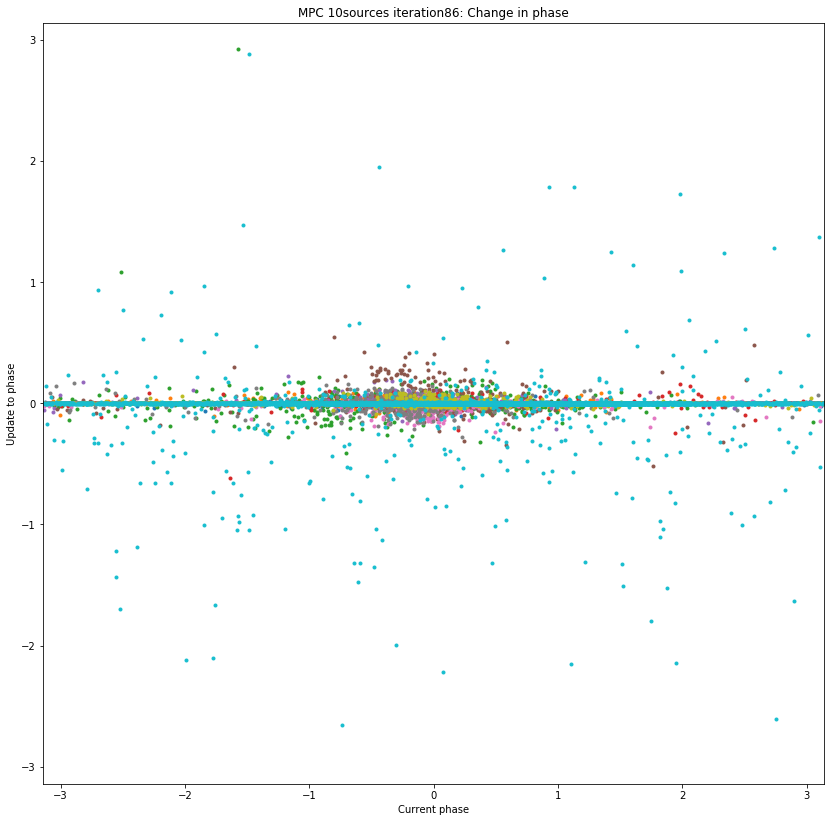

Iteration 87
arlexecute.compute: Execution using Dask took 37.832 seconds
arlexecute.compute: Execution using Dask took 34.106 seconds
arlexecute.compute: Execution using Dask took 36.316 seconds
0 0.061021350726982185
1 0.0561318415244533
2 0.05646800219823373
3 0.02520799176838058
4 0.025467524590016673
5 0.0528622808992484
6 0.04475247084455875
7 0.0621239866548787
8 0.05134556105177493
9 0.051737693902782
Peak residual : 0.0621239866548787
arlexecute.compute: Execution using Dask took 7.525 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0026373493903296494'
		rms: '6.439083142876011e-07'
		sum: '-0.0026602179192621077'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.946 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0026101940593272546'
		min: '-0.002327430258259443'
		rms: '1.221070611593349e-06'
		s

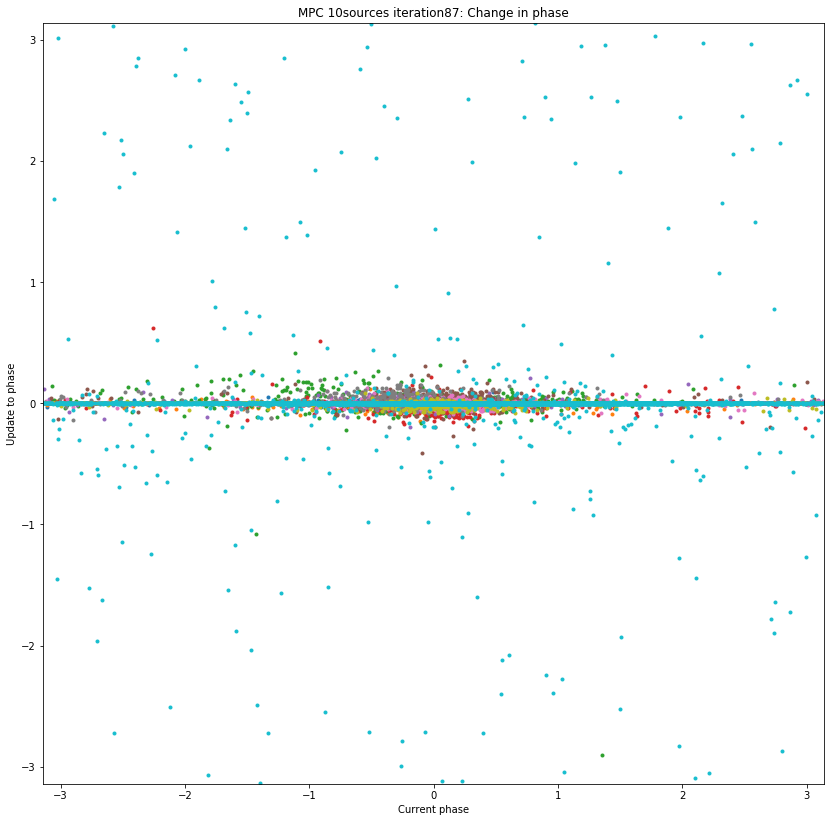

Iteration 88
arlexecute.compute: Execution using Dask took 38.116 seconds
arlexecute.compute: Execution using Dask took 33.730 seconds
arlexecute.compute: Execution using Dask took 36.468 seconds
0 0.061620364041103624
1 0.05443790220119629
2 0.05699481868783094
3 0.025129994596571302
4 0.025437738210583833
5 0.05175189830186826
6 0.0445337009187267
7 0.06323713546871326
8 0.0486783568954396
9 0.051577378909220935
Peak residual : 0.06323713546871326
arlexecute.compute: Execution using Dask took 7.354 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.002470568091318327'
		rms: '6.031660199437765e-07'
		sum: '-0.002470568091318327'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.429 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.002415170333044553'
		rms: '5.896600027873313e-07'
		sum: '-0.002442

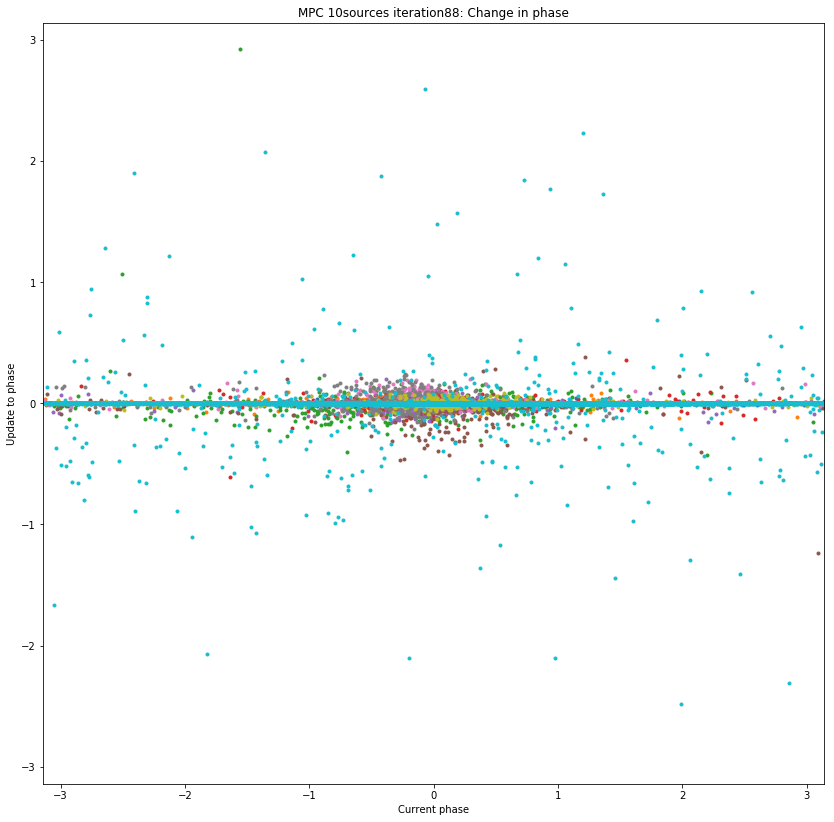

Iteration 89
arlexecute.compute: Execution using Dask took 37.939 seconds
arlexecute.compute: Execution using Dask took 33.908 seconds
arlexecute.compute: Execution using Dask took 36.612 seconds
0 0.061404286345786846
1 0.05553402289951652
2 0.0564838630876989
3 0.025171454425024904
4 0.025504690409013885
5 0.05064967832122863
6 0.04555691825330839
7 0.06236453290509335
8 0.048449098838389534
9 0.051364744948013234
Peak residual : 0.06236453290509335
arlexecute.compute: Execution using Dask took 7.360 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019205221831175507'
		min: '-0.001962349605684096'
		rms: '8.337658074363571e-07'
		sum: '0.004504094046086745'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.126 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002546326858784201'
		min: '-0.001911760308705814'
		rms: '7.90

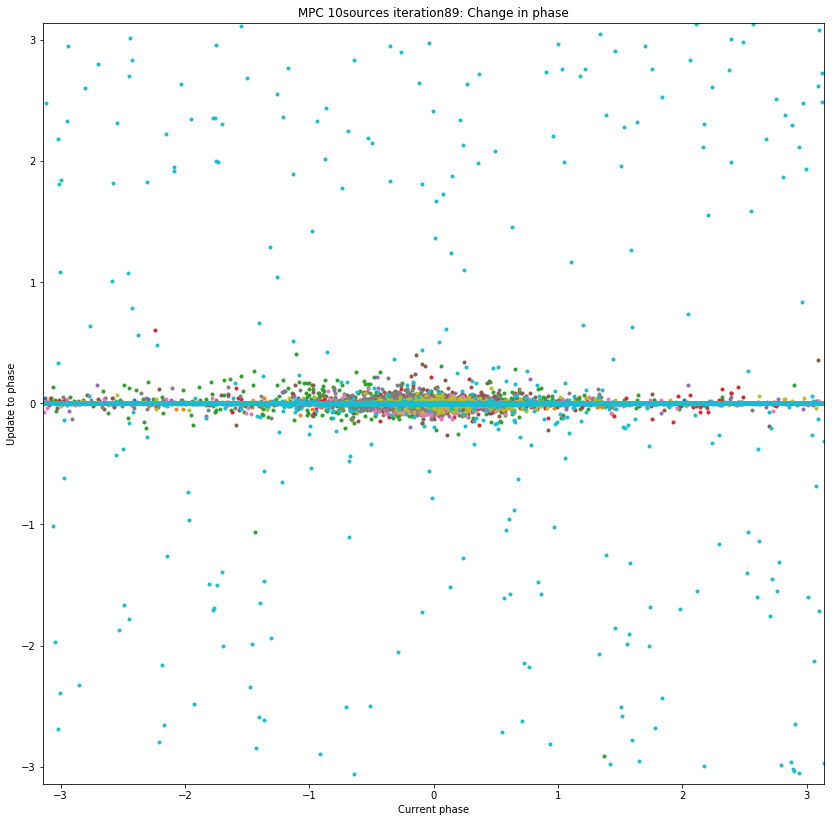

Iteration 90
arlexecute.compute: Execution using Dask took 37.984 seconds
arlexecute.compute: Execution using Dask took 33.706 seconds
arlexecute.compute: Execution using Dask took 36.993 seconds
0 0.05990849674979878
1 0.05619619014895705
2 0.05281874117168574
3 0.02516059092344643
4 0.025494505089659256
5 0.05124187466574294
6 0.04239280115968064
7 0.06111408784881893
8 0.04800709337044223
9 0.04811098913149674
Peak residual : 0.06111408784881893
arlexecute.compute: Execution using Dask took 6.896 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025393482868243354'
		min: '-0.002566591744249477'
		rms: '1.054849173977038e-06'
		sum: '0.0076226003975894034'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.108 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00017867065551622558'
		min: '-0.0025978381680227237'
		rms: '8.0

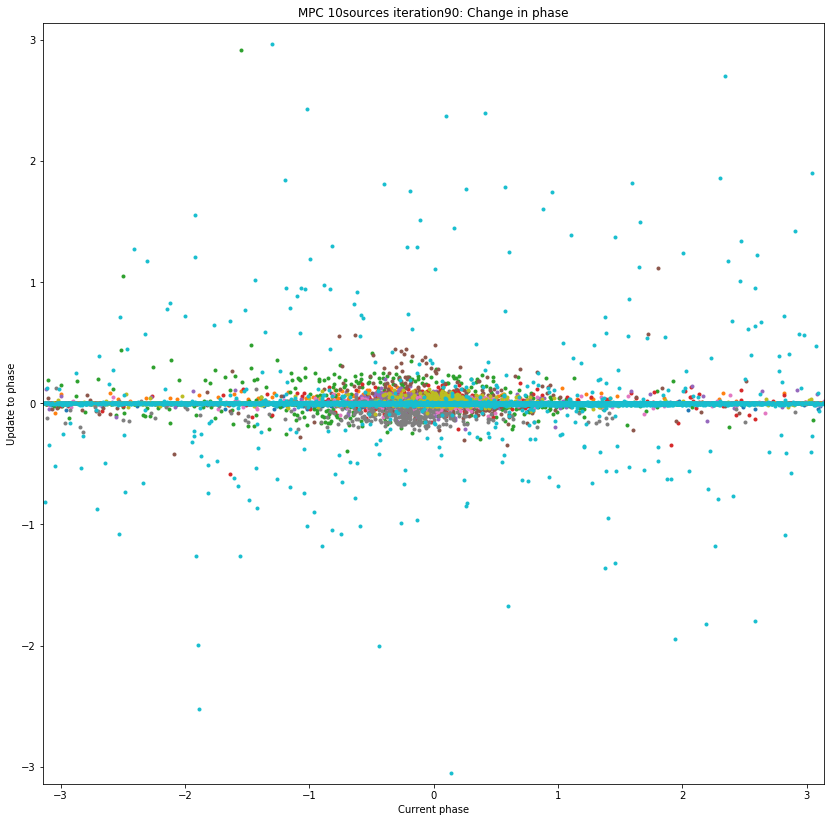

Iteration 91
arlexecute.compute: Execution using Dask took 38.055 seconds
arlexecute.compute: Execution using Dask took 33.879 seconds
arlexecute.compute: Execution using Dask took 36.541 seconds
0 0.0614091522129091
1 0.05454910090691089
2 0.05510503017599745
3 0.025616691558933678
4 0.026249555638551338
5 0.05425051628420802
6 0.044283060020698956
7 0.06098037793877133
8 0.04938192998507297
9 0.05137751458685712
Peak residual : 0.0614091522129091
arlexecute.compute: Execution using Dask took 7.580 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002609599497394038'
		min: '-0.001909947383850488'
		rms: '1.44438473669386e-06'
		sum: '0.010125916730809984'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.328 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0024888107382484456'
		min: '-0.0025553328742954746'
		rms: '1.21890

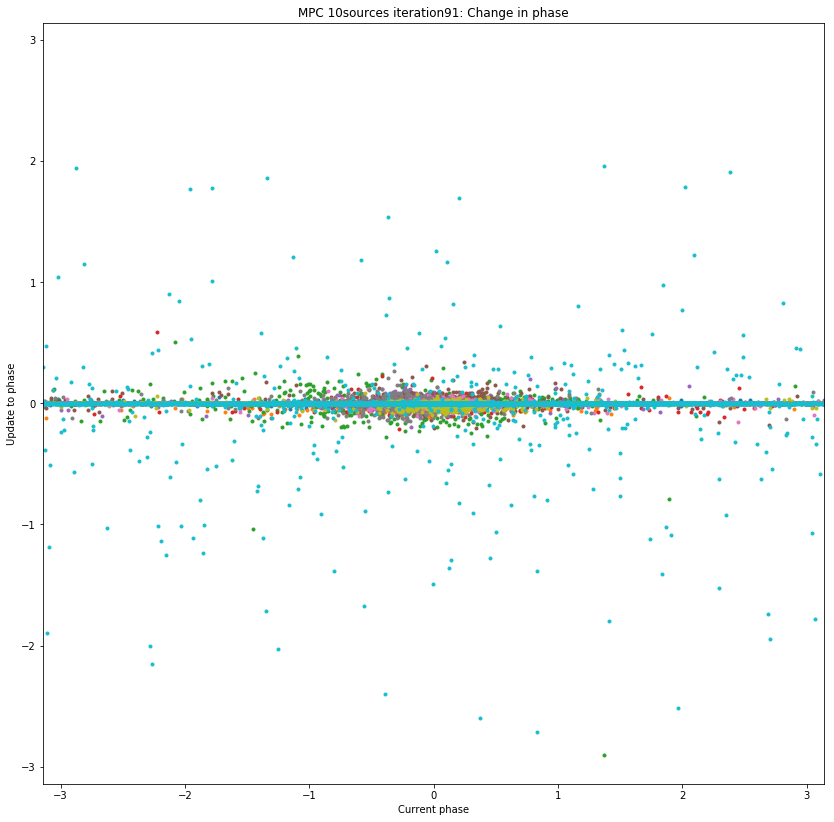

Iteration 92
arlexecute.compute: Execution using Dask took 37.468 seconds
arlexecute.compute: Execution using Dask took 33.818 seconds
arlexecute.compute: Execution using Dask took 36.396 seconds
0 0.06140870917172134
1 0.054273787039762565
2 0.05586759870354289
3 0.0257513069881219
4 0.025320029367906234
5 0.053891293059700925
6 0.0435848706510792
7 0.06151336396230005
8 0.04909415655654139
9 0.05054621641861614
Peak residual : 0.06151336396230005
arlexecute.compute: Execution using Dask took 7.282 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00018217089664056507'
		min: '-0.0025680602974723276'
		rms: '1.1016134019594147e-06'
		sum: '-0.007754598564513384'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.130 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0019653852742782672'
		min: '-0.0025226895606677863'
		rms: '1

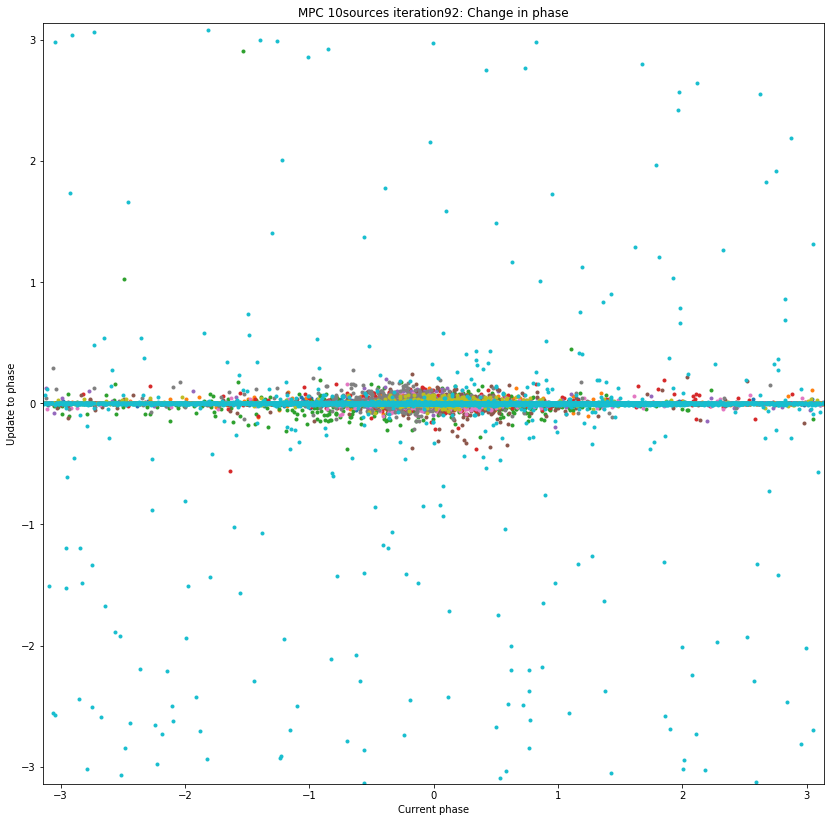

Iteration 93
arlexecute.compute: Execution using Dask took 38.411 seconds
arlexecute.compute: Execution using Dask took 34.051 seconds
arlexecute.compute: Execution using Dask took 36.616 seconds
0 0.06184222483721204
1 0.05377335639712115
2 0.05521781355612765
3 0.025085504297325634
4 0.0252839612654462
5 0.05133336282555131
6 0.04698316381407221
7 0.06210514166422234
8 0.04910312787833757
9 0.04929029651833933
Peak residual : 0.06210514166422234
arlexecute.compute: Execution using Dask took 7.184 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025315562583402146'
		min: '-0.002631478507717951'
		rms: '1.029312500134853e-06'
		sum: '1.2577656561608627e-05'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.088 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025622044454937814'
		min: '-0.0001816216135923558'
		rms: '6.49

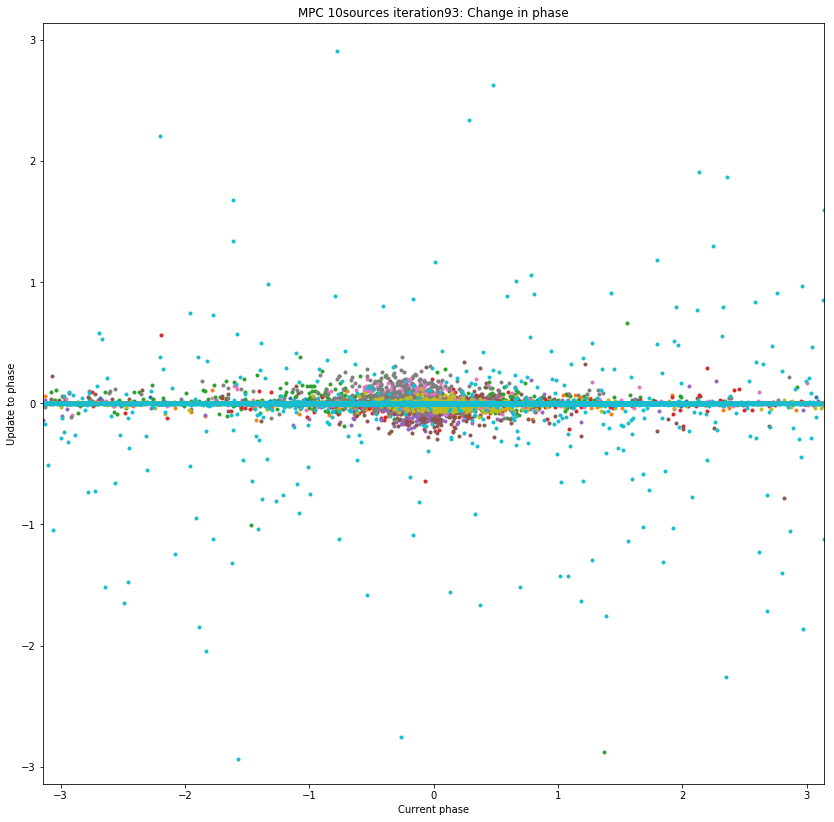

Iteration 94
arlexecute.compute: Execution using Dask took 37.831 seconds
arlexecute.compute: Execution using Dask took 33.944 seconds
arlexecute.compute: Execution using Dask took 36.439 seconds
0 0.06134132951488346
1 0.05420527559658341
2 0.053990210108161865
3 0.02466593689609813
4 0.02646773049936517
5 0.0506010401044679
6 0.04385237125824966
7 0.06351274459720829
8 0.04895658958685052
9 0.051337107372741435
Peak residual : 0.06351274459720829
arlexecute.compute: Execution using Dask took 7.477 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025219421426058665'
		min: '-0.0009451441209441274'
		rms: '8.02050911583429e-07'
		sum: '0.0037295124242168794'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.206 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0018802432416180333'
		min: '0.0'
		rms: '4.6527024625194146e-07'

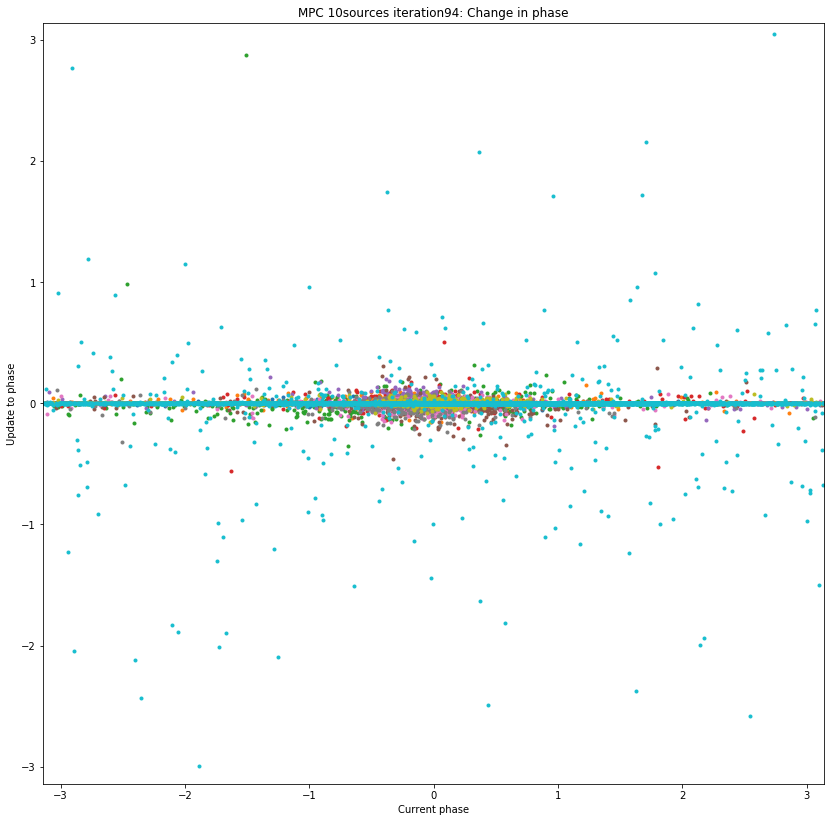

Iteration 95
arlexecute.compute: Execution using Dask took 38.136 seconds
arlexecute.compute: Execution using Dask took 33.413 seconds
arlexecute.compute: Execution using Dask took 36.492 seconds
0 0.06154968642811981
1 0.05478001236203388
2 0.055654620528176366
3 0.025260951502060133
4 0.025150581200736863
5 0.05132050643704006
6 0.044109465503376154
7 0.06032448253354507
8 0.05024903306876944
9 0.05186329915001127
Peak residual : 0.06154968642811981
arlexecute.compute: Execution using Dask took 7.331 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002572978212342155'
		min: '-0.0003416319258378502'
		rms: '9.039521197170076e-07'
		sum: '0.009986261190772951'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.873 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.0018970236580512622'
		rms: '5.003085927285422e-0

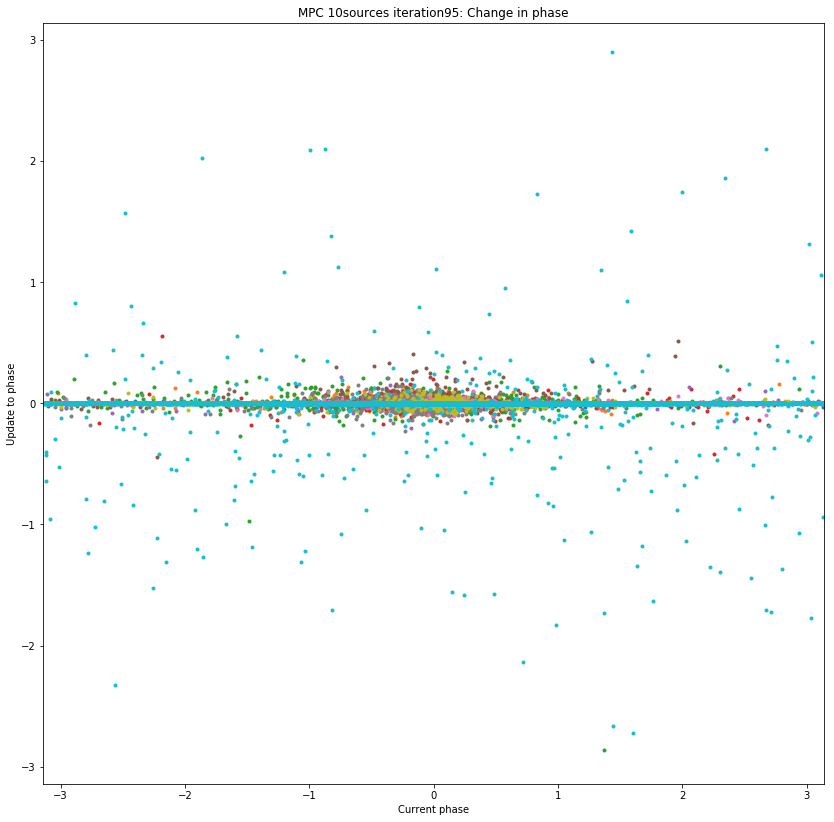

Iteration 96
arlexecute.compute: Execution using Dask took 37.820 seconds
arlexecute.compute: Execution using Dask took 33.904 seconds
arlexecute.compute: Execution using Dask took 36.584 seconds
0 0.06110624674077948
1 0.05469968593472729
2 0.05629540937099903
3 0.024789218121171307
4 0.024965302369068444
5 0.05246040662491775
6 0.041949805977132805
7 0.061070995326154474
8 0.04960545807264426
9 0.05206432717123231
Peak residual : 0.06110624674077948
arlexecute.compute: Execution using Dask took 7.317 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.00018120669867487043'
		min: '-0.0019495439979064213'
		rms: '5.260504148630645e-07'
		sum: '0.005161770782065741'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.448 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0001848935477456724'
		min: '-0.0025723750153772863'
		rms: '

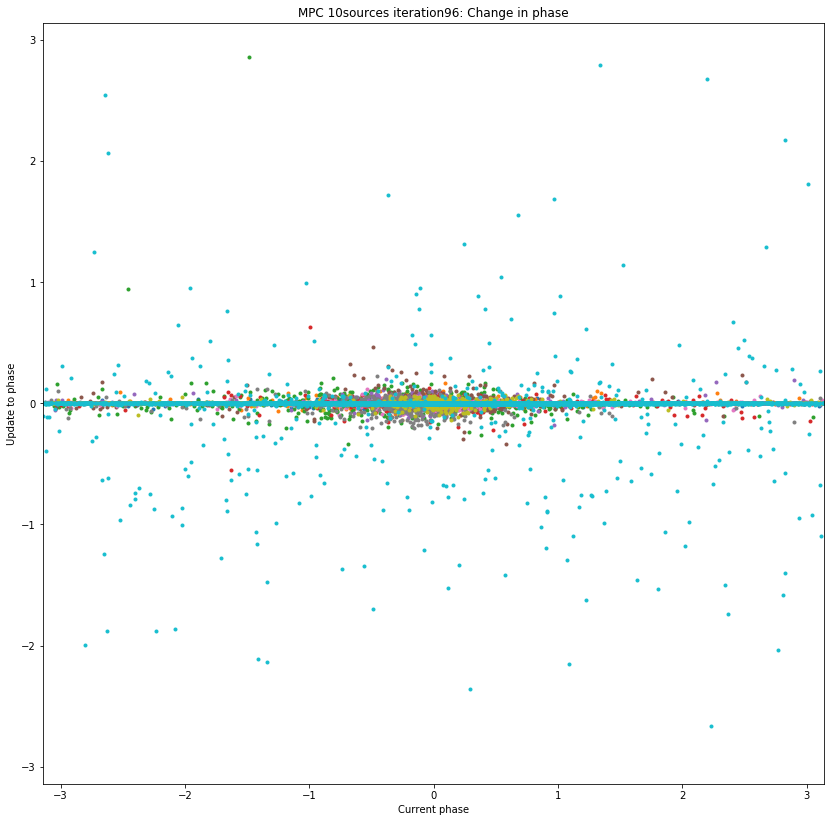

Iteration 97
arlexecute.compute: Execution using Dask took 37.367 seconds
arlexecute.compute: Execution using Dask took 33.739 seconds
arlexecute.compute: Execution using Dask took 36.752 seconds
0 0.05937800973425513
1 0.05559152543799308
2 0.05850169841867014
3 0.025473714834869526
4 0.02474428311767951
5 0.0536027044737784
6 0.04293338433684353
7 0.05994993650065642
8 0.04947554141721769
9 0.050471509094601776
Peak residual : 0.05994993650065642
arlexecute.compute: Execution using Dask took 7.160 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.002568221047350066'
		min: '-0.002501897176897207'
		rms: '1.422206996135723e-06'
		sum: '0.002547370368926668'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.838 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025076993770976005'
		min: '-0.0025023742815759495'
		rms: '1.3634

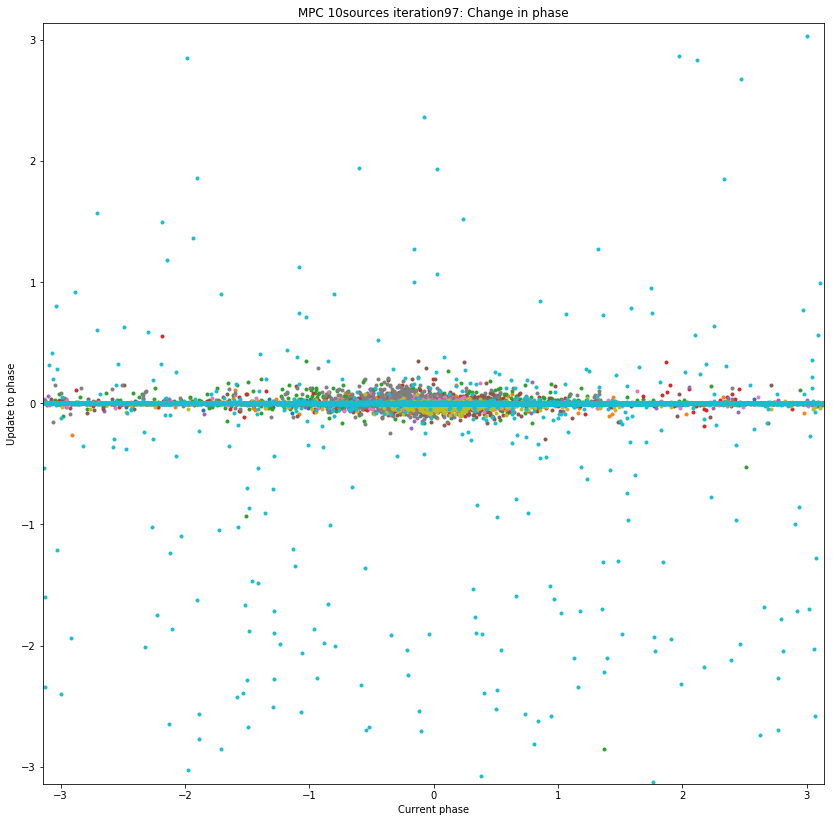

Iteration 98
arlexecute.compute: Execution using Dask took 37.920 seconds
arlexecute.compute: Execution using Dask took 34.737 seconds
arlexecute.compute: Execution using Dask took 36.924 seconds
0 0.05953652425220888
1 0.05534845013317249
2 0.05656141016271447
3 0.02507484793355187
4 0.025523938509730837
5 0.05196778809907331
6 0.043252792372786536
7 0.06290085423138592
8 0.04852220124675943
9 0.05121760470603421
Peak residual : 0.06290085423138592
arlexecute.compute: Execution using Dask took 7.173 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025274315657466094'
		min: '0.0'
		rms: '8.661413238952053e-07'
		sum: '0.0076332911202715015'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 6.876 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0023537927022041945'
		min: '0.0'
		rms: '5.74656404310494e-07'
		sum: '0.00235379

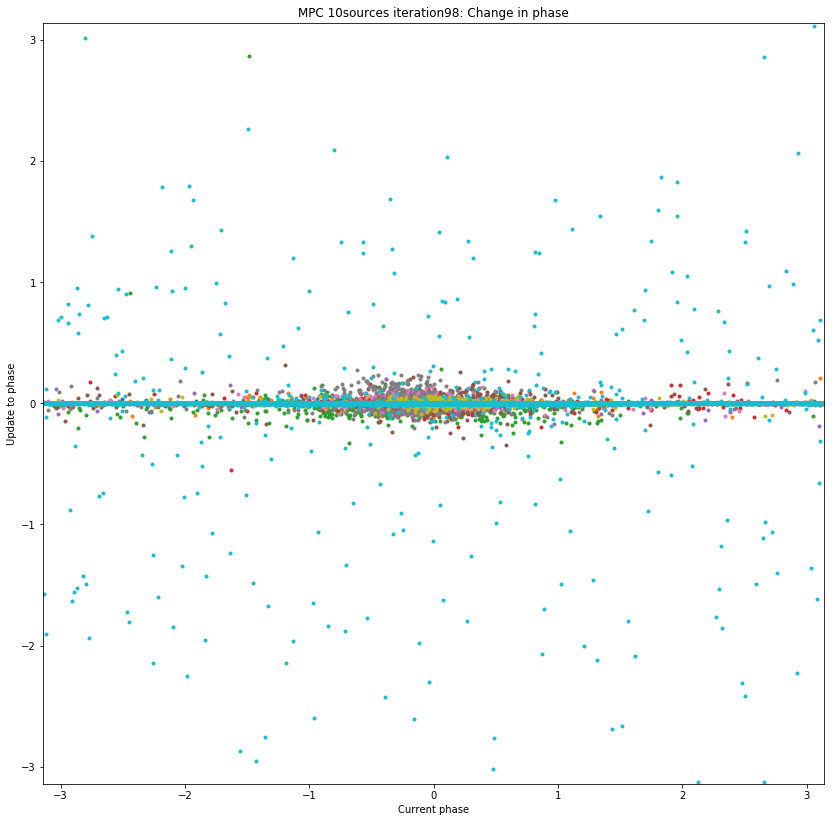

Iteration 99
arlexecute.compute: Execution using Dask took 37.889 seconds
arlexecute.compute: Execution using Dask took 33.708 seconds
arlexecute.compute: Execution using Dask took 36.757 seconds
0 0.05930186138313535
1 0.05561521839762559
2 0.05742487388121008
3 0.025602100892901644
4 0.026046783900317873
5 0.05132440426968375
6 0.045731961129773874
7 0.06311209759000355
8 0.05052114875661502
9 0.050305456879793195
Peak residual : 0.06311209759000355
arlexecute.compute: Execution using Dask took 6.814 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 0
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0'
		min: '-0.00018908315196281778'
		rms: '1.2766858350673886e-07'
		sum: '-0.0027285962894673535'
		medianabs: '0.0'
		median: '0.0'

arlexecute.compute: Execution using Dask took 7.057 seconds
Quality assessment:
	Origin: qa_image
	Context: skymodel 1
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '0.0025514683364601023'
		min: '-0.00018331375358190155'
		rms: '6.350948636197

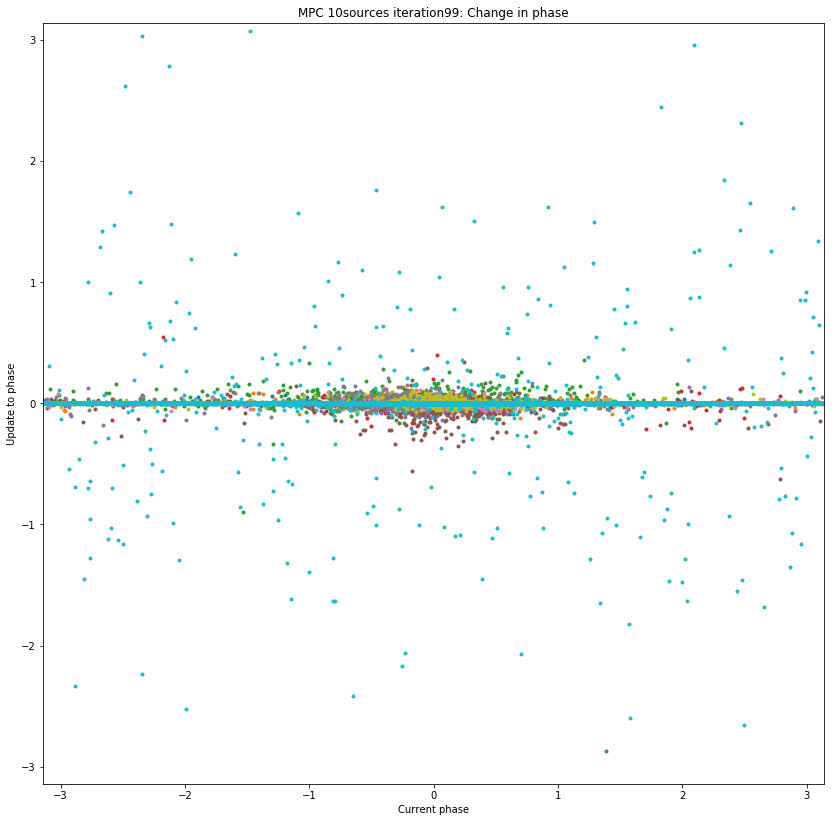

In [6]:
nsources=10

theta_list = import_skymodel_from_hdf5("mpc-skymodel_%dsources_iteration0.hdf5" % (nsources))
model = copy_image(theta_list[0].image)
model.data[...] = 0.0

psf_obs = invert_list_arlexecute_workflow([Vobs], [model], context='2d', dopsf=True)
psf_obs = arlexecute.compute(psf_obs, sync=True)

for iteration in range(1,100):

    print('Iteration %d' % iteration)

    future_Vobs = arlexecute.scatter(Vobs)
    Vdatamodel_list = predict_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    Vdatamodel_list = extract_datamodels_skymodel_list_arlexecute_workflow(future_Vobs, Vdatamodel_list)
    Vdatamodel_list = arlexecute.compute(Vdatamodel_list, sync=True)
    

    dirty_all_conv = convolve_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    dirty_all_conv = arlexecute.compute(dirty_all_conv, sync=True)    
    dirty_all_cal = invert_skymodel_list_arlexecute_workflow(Vdatamodel_list, theta_list, context='2d', docal=True)
    dirty_all_cal = arlexecute.compute(dirty_all_cal, sync=True)
    
    for i, d in enumerate(dirty_all_cal):
        d[0].data -= dirty_all_conv[i][0].data
        
    peak = 0.0
    combined_dirty_image=copy_image(model)
    combined_dirty_image.data[...]=0.0
    for i, d in enumerate(dirty_all_cal):
        peak = max(peak, numpy.max(numpy.abs(d[0].data)))
        print(i, numpy.max(numpy.abs(d[0].data)))
        combined_dirty_image.data+=d[0].data
    print("Peak residual :", peak)
    
    export_image_to_fits(combined_dirty_image, 'low-mpc-residual_image_%dsources_iteration%d.fits' % 
                         (nsources, iteration))
    
    for ism, sm in enumerate(theta_list):
        deconvolved_list, _ = deconvolve_list_arlexecute_workflow([dirty_all_cal[ism]], [psf_obs[0]], 
                                                          [model], mask=sm.mask, algorithm='msclean',
                                                              scales=[0,3,10],                                                          niter=100,
                                                          fractional_threshold=0.3, threshold=0.3 * peak,
                                                          gain=0.1, 
                                                          psf_support=128, deconvolve_facets=8,
                                                             deconvolve_overlap=16,
                                                             deconvolve_taper='tukey')

        deconvolved_list = arlexecute.compute(deconvolved_list, sync=True)
        print(qa_image(deconvolved_list[0], context='skymodel %d'%ism))
        sm.image.data += sm.mask.data * deconvolved_list[0].data
        
    combined_model = calculate_skymodel_equivalent_image(theta_list)
    print(qa_image(combined_model, context='Combined model'))
    
    Vpredicted_list = predict_skymodel_list_arlexecute_workflow(future_Vobs, theta_list, context='2d', docal=True)
    result = calibrate_list_arlexecute_workflow(Vdatamodel_list, Vpredicted_list,
                                            calibration_context='T',
                                            iteration=0, global_solution=False)
    Vcalibrated, gaintable_list = arlexecute.compute(result, sync=True)
    
    plt.clf()
    for i in range(len(theta_list)):
        plt.plot(numpy.angle(theta_list[i].gaintable.gain[:,:,0,0,0]).flatten(),
                 numpy.angle(gaintable_list[i]['T'].gain[:,:,0,0,0]).flatten(), 
                 '.')
    plt.xlabel('Current phase')
    plt.ylabel('Update to phase')
    plt.xlim([-numpy.pi, numpy.pi])
    plt.ylim([-numpy.pi, numpy.pi])
    plt.title("MPC %dsources iteration%d: Change in phase" % (nsources, iteration))
    plt.savefig("mpc-skymodel-phase_change_%dsources_iteration%d.jpg" % (nsources, iteration))
    plt.show()
    
    theta_list = update_skymodel_from_gaintables(theta_list, gaintable_list, calibration_context='T') 
    
    export_skymodel_to_hdf5(theta_list, "mpc-skymodel_%dsources_iteration%d.hdf5" % (nsources, iteration))

In [40]:
export_image_to_fits(combined_model, 'low-mpc_%dsources-deconvolved.fits' % nsources)

In [7]:
from workflows.arlexecute.imaging.imaging_arlexecute import restore_list_arlexecute_workflow
result=restore_list_arlexecute_workflow([combined_model], psf_obs, [(combined_dirty_image, 0.0)])

In [8]:
result=arlexecute.compute(result, sync=True)

arlexecute.compute: Execution using Dask took 38.504 seconds


In [9]:
print(qa_image(result[0], context='MPC restored image'))

Quality assessment:
	Origin: qa_image
	Context: MPC restored image
	Data:
		shape: '(1, 1, 4096, 4096)'
		max: '4.9823172230921875'
		min: '-0.12906816976322014'
		rms: '0.014054092016838646'
		sum: '4850.861885215579'
		medianabs: '0.005886337823669325'
		median: '4.4644376823096674e-05'



In [39]:
recovered_mpccal_components = find_skycomponents(result[0], fwhm=2, threshold=0.14, npixels=12)
print(len(recovered_mpccal_components))
print(recovered_mpccal_components[0])
from data_models.data_model_helpers import export_skycomponent_to_hdf5
export_skycomponent_to_hdf5(recovered_mpccal_components, 'low-mpc_%dsources-components.hdf5' % nsources)


53
Skycomponent:
	Name: Segment 0
	Flux: [[0.24242864]]
	Frequency: [1.e+08]
	Direction: <SkyCoord (ICRS): (ra, dec) in deg
    (2.60871123, -44.3915336)>
	Shape: Point
	Params: {}
	Polarisation frame: stokesI



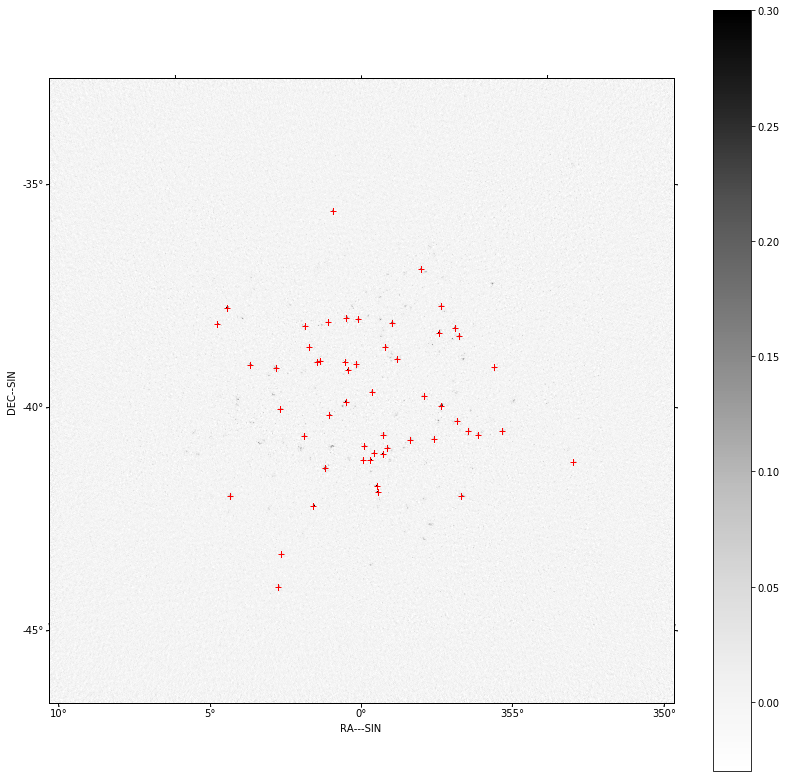

In [36]:
show_image(result[0], vmax=0.3, vmin=-0.03, components=recovered_mpccal_components)
export_image_to_fits(result[0], 'low-mpc_%dsources-restored.fits' % nsources)
plt.show()

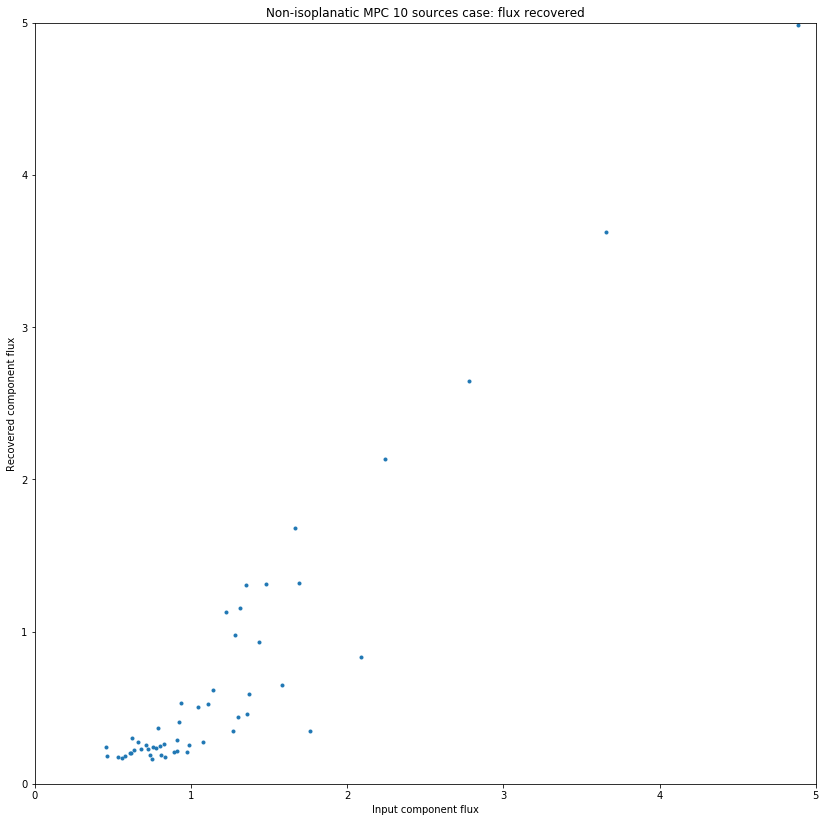

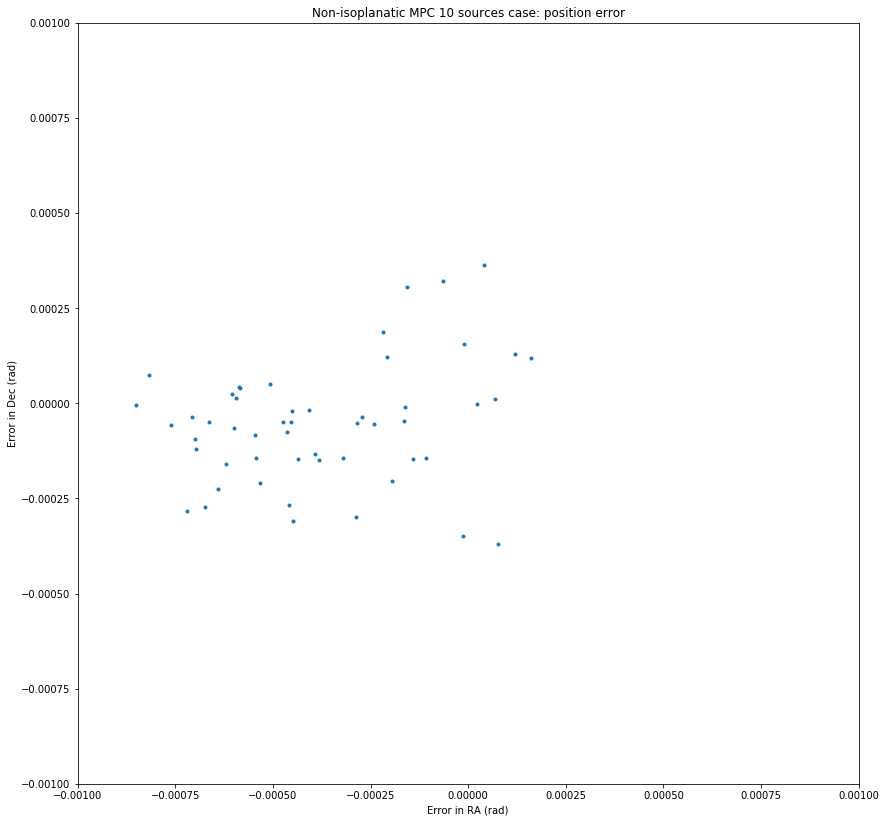

In [37]:
from data_models.data_model_helpers import import_skymodel_from_hdf5
gleam_skymodel_iso=import_skymodel_from_hdf5('low-sims-iso_skymodel.hdf5')
from processing_components.skycomponent.operations import filter_skycomponents_by_flux
bright_gleam=filter_skycomponents_by_flux(gleam_skymodel_iso.components, flux_min=0.4)
def max_flux(elem):
    return numpy.max(elem.flux)
sorted_bright_gleam=sorted(bright_gleam, key=max_flux, reverse=True)

from wrappers.serial.skycomponent.operations import find_skycomponent_matches
matches = find_skycomponent_matches(recovered_mpccal_components, sorted_bright_gleam, tol=1e-3)
x=list()
y=list()
dx=list()
dy=list()
for match in matches:
    y.append(recovered_mpccal_components[match[0]].flux[0,0])
    x.append(sorted_bright_gleam[match[1]].flux[0,0])
    dx.append(recovered_mpccal_components[match[0]].direction.ra.rad-sorted_bright_gleam[match[1]].direction.ra.rad)
    dy.append(recovered_mpccal_components[match[0]].direction.dec.rad-sorted_bright_gleam[match[1]].direction.dec.rad)
        
plt.clf()
plt.plot(x, y, '.')
plt.xlim([0.0, 5.0])
plt.ylim([0.0, 5.0])
plt.xlabel('Input component flux')
plt.ylabel('Recovered component flux')
plt.title('Non-isoplanatic MPC %d sources case: flux recovered' % nsources)
plt.savefig('mpccal_noniso_%dsources_flux_errors.jpg' % nsources)
plt.show()
    
plt.clf()
plt.plot(dx, dy, '.')
plt.xlim([-1e-3, 1e-3])
plt.ylim([-1e-3, 1e-3])
plt.xlabel('Error in RA (rad)')
plt.ylabel('Error in Dec (rad)')
plt.title('Non-isoplanatic MPC %d sources case: position error' % nsources)
plt.savefig('mpccal_noniso_%dsources_position_errors.jpg' % nsources)
plt.show()
    

In [38]:
oldscreen=import_image_from_fits('low_screen_5000.0r0_0.100rate.fits')
from processing_components.simulation.ionospheric_screen import grid_gaintable_to_screen
from processing_components.image.operations import create_empty_image_like
newscreen = create_empty_image_like(oldscreen)
gaintables = [th.gaintable for th in theta_list]
newscreen, weights = newgrid_gaintable_to_screen(blockvis, gaintables, newscreen)
print(qa_image(newscreen))
export_image_to_fits(newscreen, 'mpccal_%dsources_screen.fits' % nsources)
export_image_to_fits(weights, 'mpccal_%dsources_screen_weights.fits' % nsources)

Quality assessment:
	Origin: qa_image
	Context: 
	Data:
		shape: '(1, 61, 2000, 2000)'
		max: '3.140075286327407'
		min: '-3.140328021231467'
		rms: '0.01211029379474128'
		sum: '-1298.822932309543'
		medianabs: '0.0'
		median: '0.0'



In [17]:
gaintables[0].gain

array([[[[[ 1.        -1.79501424e-22j]]],


        [[[ 0.92823068-3.72004857e-01j]]],


        [[[ 0.97314641-2.30186920e-01j]]],


        ...,


        [[[-0.72928464-6.84210008e-01j]]],


        [[[ 0.61608634-7.87678226e-01j]]],


        [[[-0.55412968-8.32430263e-01j]]]],



       [[[[ 1.        -1.04971805e-21j]]],


        [[[ 0.94068009-3.39294297e-01j]]],


        [[[ 0.98464404-1.74573565e-01j]]],


        ...,


        [[[-0.78855573-6.14963138e-01j]]],


        [[[ 0.51683169-8.56086969e-01j]]],


        [[[-0.6401666 -7.68235871e-01j]]]],



       [[[[ 1.        -2.96931991e-22j]]],


        [[[ 0.99987365-1.58946537e-02j]]],


        [[[ 0.99998132-6.10836355e-03j]]],


        ...,


        [[[-0.58510415-8.10958146e-01j]]],


        [[[ 0.99255134-1.21827003e-01j]]],


        [[[-0.66718883-7.44888609e-01j]]]],



       ...,



       [[[[ 1.        +3.53748959e-22j]]],


        [[[ 0.95154567-3.07507097e-01j]]],


        [[[ 0.99843557+5.59142971e